In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import torch
from torch import nn
!pip install torchdiffeq
from torchdiffeq import odeint
import matplotlib.pyplot as plt

We consider here the 1D cubic nonlinear Schrödinger equation

$$i \frac{\partial u}{\partial t} + \frac{1}{2} \frac{\partial^2 u}{\partial x^2} + |u|^2 u = 0$$


# Generating synthetic data

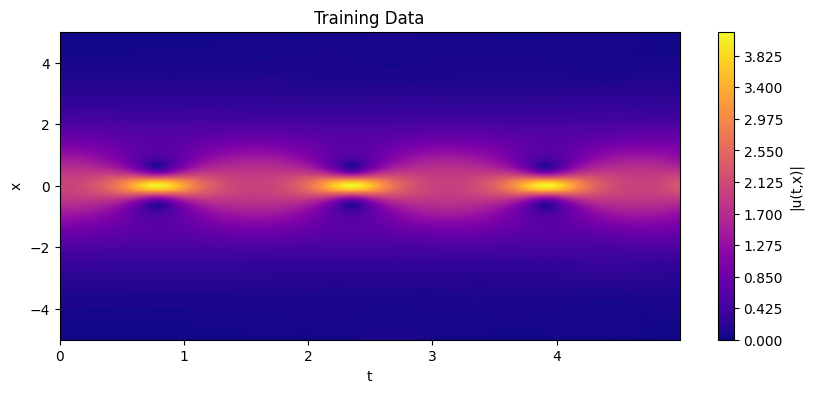

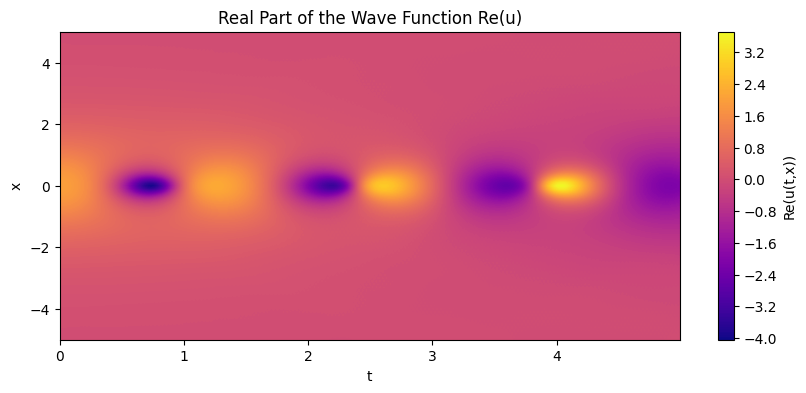

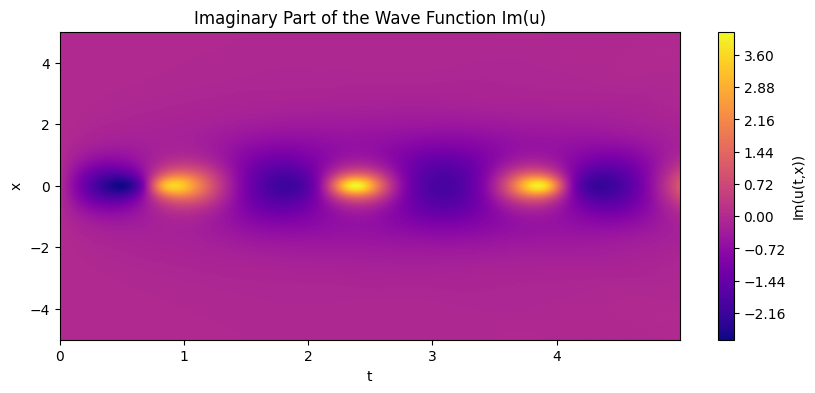

In [7]:
# Parameters
xspan = (-5.0, 5.0)
# tspan = (0.0, np.pi / 2)
tspan = (0.0, 5.0)
# dx = 0.05
dx = 0.1
dt = 0.01
xgrid = np.arange(xspan[0], xspan[1] + dx, dx)
# tgrid = np.arange(tspan[0] + dt, tspan[1] - dt + dt, dt)  # Avoiding tspan endpoints
tgrid = np.arange(tspan[0], tspan[1], dt)  # Avoiding tspan endpoints

# Initial conditions
def sech(x):
    return 2 / np.cosh(x)

u_real_init = sech(xgrid)
u_imag_init = np.zeros_like(xgrid)

# Discretization
def schrodinger_rhs(t, y, dx, N):
    u_real = y[:N]
    u_imag = y[N:]
    d2u_real_dx2 = np.zeros_like(u_real)
    d2u_imag_dx2 = np.zeros_like(u_imag)

    # Second derivative using finite differences (Neumann boundary conditions)
    for i in range(1, N-1):
        d2u_real_dx2[i] = (u_real[i-1] - 2 * u_real[i] + u_real[i+1]) / dx**2
        d2u_imag_dx2[i] = (u_imag[i-1] - 2 * u_imag[i] + u_imag[i+1]) / dx**2

    # Periodic boundary conditions
    d2u_real_dx2[0] = (u_real[-1] - 2 * u_real[0] + u_real[1]) / dx**2
    d2u_real_dx2[-1] = (u_real[-2] - 2 * u_real[-1] + u_real[0]) / dx**2

    d2u_imag_dx2[0] = (u_imag[-1] - 2 * u_imag[0] + u_imag[1]) / dx**2
    d2u_imag_dx2[-1] = (u_imag[-2] - 2 * u_imag[-1] + u_imag[0]) / dx**2

    # RHS of the Schrödinger equation
    du_real_dt = 0.5 * d2u_imag_dx2 + (u_real**2 + u_imag**2) * u_imag
    du_imag_dt = -0.5 * d2u_real_dx2 - (u_real**2 + u_imag**2) * u_real

    return np.concatenate([du_real_dt, du_imag_dt])

# Solve the PDE
N = len(xgrid)
y0 = np.concatenate([u_real_init, u_imag_init])
sol = solve_ivp(schrodinger_rhs, tspan, y0, method='RK45', t_eval=tgrid, args=(dx, N))

# Extract solutions
u_real_sol = sol.y[:N, :]
u_imag_sol = sol.y[N:, :]

# Plot training data
plt.figure(figsize=(10, 4))
plt.contourf(sol.t, xgrid, np.sqrt(u_real_sol**2 + u_imag_sol**2), levels=201, cmap='plasma')
plt.colorbar(label='|u(t,x)|')
plt.xlabel('t')
plt.ylabel('x')
plt.title('Training Data')
plt.show()

# Plot Re(u) (real part of the wave function)
plt.figure(figsize=(10, 4))
plt.contourf(sol.t, xgrid, u_real_sol, levels=201, cmap='plasma')
plt.colorbar(label='Re(u(t,x))')
plt.xlabel('t')
plt.ylabel('x')
plt.title('Real Part of the Wave Function Re(u)')
plt.show()

# Plot Im(u) (imaginary part of the wave function)
plt.figure(figsize=(10, 4))
plt.contourf(sol.t, xgrid, u_imag_sol, levels=201, cmap='plasma')
plt.colorbar(label='Im(u(t,x))')
plt.xlabel('t')
plt.ylabel('x')
plt.title('Imaginary Part of the Wave Function Im(u)')
plt.show()


# Fourier Neural Operator

## FNO Training

In [3]:
# Extract training data from the Schrodinger solution
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]
X_real_train = np.array([sol.y[:N, idx] for idx in idx_])
X_imag_train = np.array([sol.y[N:, idx] for idx in idx_])
X_train = np.hstack([X_real_train, X_imag_train])  # Combined real and imaginary parts
time_steps = np.array(dt_train)

# FNO Components
class SpectralConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, modes):
        super(SpectralConv1d, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes = modes
        self.scale = 1 / (in_channels * out_channels)
        self.weights1 = nn.Parameter(
            self.scale * torch.rand(in_channels, out_channels, modes, dtype=torch.cfloat)
        )

    def forward(self, x):
        x_ft = torch.fft.rfft(x, dim=-1)
        out_ft = torch.zeros_like(x_ft, dtype=torch.cfloat)
        out_ft[..., : self.modes] = torch.einsum(
            "bix,iox->box", x_ft[..., : self.modes], self.weights1
        )
        x = torch.fft.irfft(out_ft, n=x.size(-1), dim=-1)
        return x


class FNO1d(nn.Module):
    def __init__(self, modes, width):
        super(FNO1d, self).__init__()
        self.modes = modes
        self.width = width
        self.fc0 = nn.Linear(3, self.width)  # 3: real, imaginary, and time

        self.conv0 = SpectralConv1d(self.width, self.width, self.modes)
        self.conv1 = SpectralConv1d(self.width, self.width, self.modes)
        self.conv2 = SpectralConv1d(self.width, self.width, self.modes)

        self.w0 = nn.Conv1d(self.width, self.width, 1)
        self.w1 = nn.Conv1d(self.width, self.width, 1)
        self.w2 = nn.Conv1d(self.width, self.width, 1)

        self.fc1 = nn.Linear(self.width, 128)
        self.fc2 = nn.Linear(128, 2)  # Output: real and imaginary

    def forward(self, x):
        x = self.fc0(x)
        x = x.permute(0, 2, 1)

        x1 = self.conv0(x)
        x2 = self.w0(x)
        x = x1 + x2
        x = nn.ReLU()(x)

        x1 = self.conv1(x)
        x2 = self.w1(x)
        x = x1 + x2
        x = nn.ReLU()(x)

        x1 = self.conv2(x)
        x2 = self.w2(x)
        x = x1 + x2

        x = x.permute(0, 2, 1)
        x = nn.ReLU()(self.fc1(x))
        x = self.fc2(x)
        return x


# Prepare data
spatial_grid = np.repeat(xgrid.reshape(1, -1), len(time_steps), axis=0)
temporal_grid = np.repeat(time_steps.reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, real, and imaginary components as input
input_data = np.stack([spatial_grid, temporal_grid, X_real_train], axis=-1)
output_data = np.stack([X_real_train, X_imag_train], axis=-1)  # Shape: (8, len(xgrid), 2)

# Convert to PyTorch tensors
input_tensor = torch.tensor(input_data, dtype=torch.float32)
output_tensor = torch.tensor(output_data, dtype=torch.float32)

## preparing test dataset

In [ ]:
# Define the test time grid
dt_test = np.arange(0, 1.6, 0.2)  # Test times from 1.5 to 5.0 with spacing of 0.1

print(dt_test)

# Extract test data for Ey and Hz
u_real_test = np.array([u_real_sol[:, int(t / dt)] for t in dt_test])
u_imag_test = np.array([u_imag_sol[:, int(t / dt)] for t in dt_test])

# Prepare test dataset for input and output
spatial_test_grid = np.repeat(xgrid.reshape(1, -1), len(dt_test), axis=0)
temporal_test_grid = np.repeat(dt_test.reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, and fields (Ey, Hz) as input for testing
input_data_test = np.stack([spatial_test_grid, temporal_test_grid, u_real_test], axis=-1)
output_data_test = np.stack([u_real_test, u_imag_test], axis=-1)

# Convert test data to PyTorch tensors
input_tensor_test = torch.tensor(input_data_test, dtype=torch.float32)
output_tensor_test = torch.tensor(output_data_test, dtype=torch.float32)

print("Testing dataset prepared.")

[0.  0.2 0.4 0.6 0.8 1.  1.2 1.4]
Testing dataset prepared.


## Changing the hyperparameters

Training model with modes=2, width=32
Epoch 0, Training Loss: 0.42302438616752625, Testing Loss: 0.40797436237335205
Epoch 100, Training Loss: 0.07950091361999512, Testing Loss: 0.08185140788555145
Epoch 200, Training Loss: 0.001915360102429986, Testing Loss: 0.00879071094095707
Epoch 300, Training Loss: 0.000202906274353154, Testing Loss: 0.007715587504208088
Epoch 400, Training Loss: 0.00014573000953532755, Testing Loss: 0.007703905925154686
Epoch 500, Training Loss: 8.991552022052929e-05, Testing Loss: 0.007549791131168604
Epoch 600, Training Loss: 7.353654655162245e-05, Testing Loss: 0.007557858247309923
Epoch 700, Training Loss: 6.320467218756676e-05, Testing Loss: 0.007753502577543259
Epoch 800, Training Loss: 5.314860391081311e-05, Testing Loss: 0.007681275252252817
Epoch 900, Training Loss: 4.794299093191512e-05, Testing Loss: 0.007628825958818197
Epoch 1000, Training Loss: 4.302724119042978e-05, Testing Loss: 0.007724394090473652
Epoch 1100, Training Loss: 3.886412378051318e-0

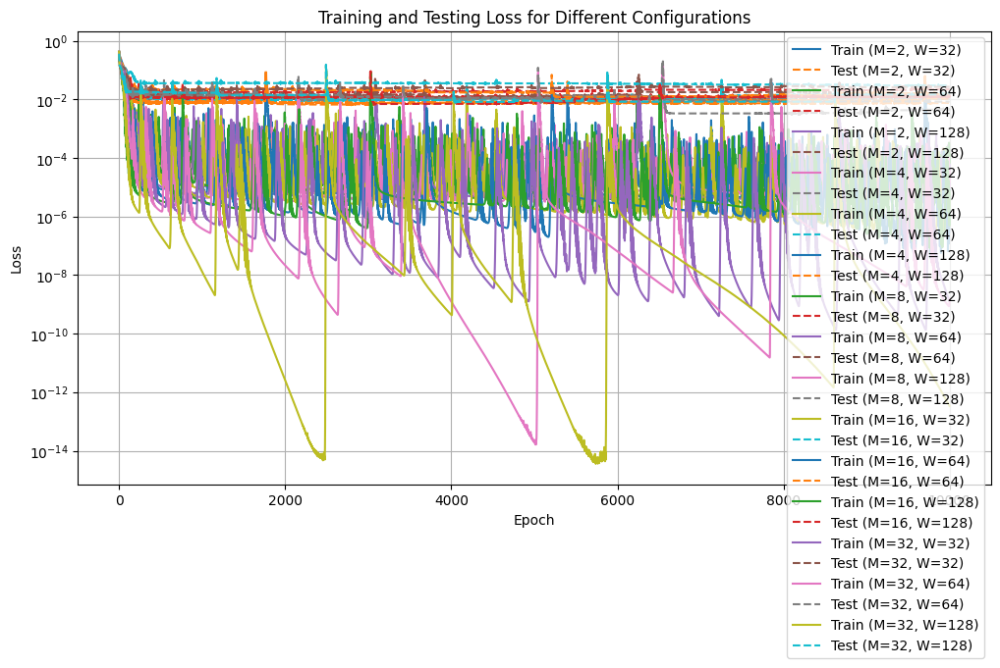

In [ ]:

import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from torch.optim.lr_scheduler import StepLR


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move tensors to GPU
input_tensor = input_tensor.to(device)
output_tensor = output_tensor.to(device)
input_tensor_test = input_tensor_test.to(device)
output_tensor_test = output_tensor_test.to(device)



def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def train_and_benchmark_fno_with_test(modes, width, lr, epochs, input_tensor, output_tensor, input_tensor_test, output_tensor_test, save_path="model.pth"):
    fno_model = FNO1d(modes, width).to(device)
    optimizer = torch.optim.Adam(fno_model.parameters(), lr=lr)
    # scheduler = StepLR(optimizer, step_size=1000, gamma=0.1)

    loss_fn = nn.MSELoss()

    num_parameters = count_parameters(fno_model)
    start_time = time.time()
    train_loss_history = []
    test_loss_history = []

    for epoch in range(epochs):
        fno_model.train()
        optimizer.zero_grad()
        predictions = fno_model(input_tensor)
        train_loss = loss_fn(predictions, output_tensor)
        train_loss.backward()

        optimizer.step()

        # scheduler.step()

        train_loss_history.append(train_loss.item())

        fno_model.eval()
        with torch.no_grad():
            test_predictions = fno_model(input_tensor_test)
            test_loss = loss_fn(test_predictions, output_tensor_test)
            test_loss_history.append(test_loss.item())

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss: {test_loss.item()}")

    training_time = time.time() - start_time
    fno_model.eval()
    start_inference = time.time()
    with torch.no_grad():
        fno_model(input_tensor_test)
    inference_time = time.time() - start_inference

    torch.save(fno_model.state_dict(), save_path)

    return {
        "modes": modes,
        "width": width,
        "lr": lr,
        "epochs": epochs,
        "training_time": training_time,
        "inference_time": inference_time,
        "final_train_loss": train_loss_history[-1],
        "final_test_loss": test_loss_history[-1],
        "num_parameters": num_parameters,
        "train_loss_history": train_loss_history,
        "test_loss_history": test_loss_history,
        "model_path": save_path,
    }



# Load existing metrics
if os.path.exists("schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json"):
    with open("schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

# Training loop
lr = 1e-3
epochs = 10000

# M <= N/2 + 1 = 51
modes_range = [2, 4, 8, 16, 32]
width_range = [32, 64, 128]

for modes in modes_range:
    for width in width_range:
        print(f"Training model with modes={modes}, width={width}")
        save_path = f"FNO_model_modes_{modes}_width_{width}.pth"
        metrics = train_and_benchmark_fno_with_test(
            modes=modes,
            width=width,
            lr=lr,
            epochs=epochs,
            input_tensor=input_tensor,
            output_tensor=output_tensor,
            input_tensor_test=input_tensor_test,
            output_tensor_test=output_tensor_test,
            save_path=save_path,
        )
        all_metrics.append(metrics)

        # Save metrics incrementally
        with open("schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json", "w") as f:
            json.dump(all_metrics, f, indent=4)

        print(f"Metrics for modes={modes}, width={width} saved.")

# Plot training and testing loss for all configurations
plt.figure(figsize=(12, 6))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label=f"Train (M={metrics['modes']}, W={metrics['width']})",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_history"],
        linestyle="--",
        label=f"Test (M={metrics['modes']}, W={metrics['width']})",
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for Different Configurations")
plt.legend()
plt.grid(True)
plt.show()
plt.close()

In [ ]:
from google.colab import drive
drive.flush_and_unmount()

Drive not mounted, so nothing to flush and unmount.


In [ ]:
import os

# List all files and directories in the current directory
files = os.listdir()
print("Files and directories in the current working directory:")
for file in files:
    print(file)

Files and directories in the current working directory:
.config
fno_model_modes_8_width_8.pth
fno_model_modes_8_width_16.pth
fno_model_modes_4_width_64.pth
fno_model_modes_4_width_8.pth
fno_model_modes_16_width_128.pth
fno_model_modes_16_width_64.pth
fno_model_modes_32_width_64.pth
fno_model_modes_2_width_16.pth
fno_model_modes_16_width_32.pth
fno_model_modes_32_width_128.pth
fno_model_modes_2_width_128.pth
fno_model_modes_2_width_8.pth
fno_model_modes_4_width_128.pth
fno_model_modes_8_width_32.pth
fno_model_modes_8_width_64.pth
fno_model_modes_2_width_32.pth
fno_model_modes_16_width_8.pth
fno_model_modes_2_width_64.pth
fno_model_modes_32_width_32.pth
schro_fno_lr1e-2_epochs1e3_benchmark_metrics.json
fno_model_modes_4_width_32.pth
fno_model_modes_32_width_8.pth
fno_model_modes_32_width_16.pth
fno_model_modes_8_width_128.pth
fno_model_modes_16_width_16.pth
fno_model_modes_4_width_16.pth
sample_data


In [ ]:
# import os
# import shutil

# # Delete all files and folders in the current directory
# for file_name in os.listdir():
#     file_path = os.path.join(os.getcwd(), file_name)
#     try:
#         if os.path.isfile(file_path) or os.path.islink(file_path):
#             os.unlink(file_path)  # Remove the file
#         elif os.path.isdir(file_path):
#             shutil.rmtree(file_path)  # Remove the directory
#         print(f"Deleted: {file_name}")
#     except Exception as e:
#         print(f"Failed to delete {file_name}: {e}")

Deleted: .config
Deleted: Schro_fno_model_modes_32_width_128.pth
Deleted: Schro_fno_model_modes_32_width_64.pth
Deleted: Schro_fno_benchmark_metrics.json
Deleted: Schro_fno_model_modes_48_width_256.pth
Deleted: Schro_fno_model_modes_48_width_16.pth
Deleted: Schro_fno_model_modes_32_width_256.pth
Deleted: Schro_fno_model_modes_4_width_64.pth
Deleted: Schro_fno_model_modes_48_width_128.pth
Deleted: Schro_fno_model_modes_4_width_8.pth
Deleted: Schro_fno_model_modes_32_width_16.pth
Deleted: Schro_fno_model_modes_48_width_8.pth
Deleted: Schro_fno_model_modes_16_width_256.pth
Deleted: Schro_fno_model_modes_16_width_8.pth
Failed to delete drive: [Errno 125] Operation canceled: 'MyDrive'
Deleted: Schro_fno_model_modes_2_width_16.pth
Deleted: Schro_fno_model_modes_2_width_256.pth
Deleted: Schro_fno_model_modes_2_width_128.pth
Deleted: Schro_fno_model_modes_2_width_8.pth
Deleted: Schro_fno_model_modes_8_width_256.pth
Deleted: Schro_fno_model_modes_8_width_64.pth
Deleted: Schro_fno_model_modes_32

## Save all the trained models and metrics in Google Drive

In [ ]:
from google.colab import drive
import os
import shutil

# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
target_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

# Ensure the target directory exists
os.makedirs(target_dir, exist_ok=True)

# Copy all saved models to the target directory
for metrics in all_metrics:
    model_path = metrics["model_path"]  # Get the saved model path from metrics
    if os.path.exists(model_path):  # Check if the model file exists
        shutil.copy(model_path, target_dir)
    else:
        print(f"Model file {model_path} not found!")

# Copy metrics file to the target directory
if os.path.exists("schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json"):
    shutil.copy("schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json", target_dir)
else:
    print("Metrics file not found!")

print(f"All models and metrics have been saved to: {target_dir}")

Mounted at /content/drive
All models and metrics have been saved to: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/




## Loading the saved models from Google Drive and plotting metrics

In [ ]:
from google.colab import drive
import os
import torch
import json

# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

# Load metrics from the JSON file
metrics_file = os.path.join(source_dir, "schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
        all_metrics = json.load(f)
    print("Metrics loaded successfully!")
else:
    print(f"Metrics file not found in {source_dir}!")

# Load models from the saved paths
loaded_models = {}
for metrics in all_metrics:
    model_path = os.path.join(source_dir, os.path.basename(metrics["model_path"]))
    if os.path.exists(model_path):
        print(f"Loading model from {model_path}...")
        fno_model = FNO1d(metrics["modes"], metrics["width"])  # Recreate the FNO model architecture
        fno_model.load_state_dict(torch.load(model_path))
        fno_model.eval()
        loaded_models[f'M={metrics["modes"]}_W={metrics["width"]}'] = fno_model
    else:
        print(f"Model file {model_path} not found!")

# Print loaded models
print(f"Loaded models: {list(loaded_models.keys())}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Metrics loaded successfully!
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_2_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_2_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_2_width_128.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_4_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_4_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Mode

<ipython-input-7-467a1b2d40ef>:28: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  fno_model.load_state_dict(torch.load(model_path))


Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_8_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_8_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_8_width_128.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_16_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_16_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_16_width_128.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_S

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


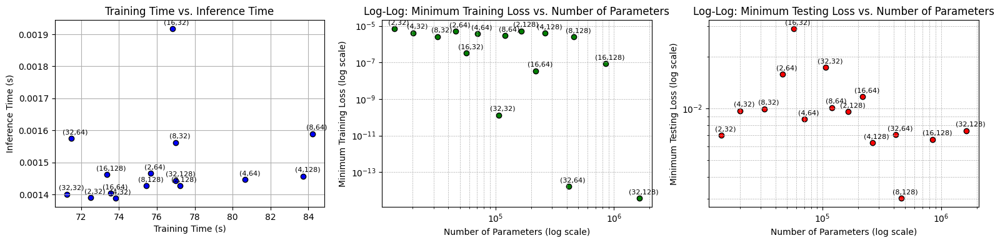

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import json
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

metrics_file = os.path.join(source_dir, "schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
min_test_losses = [min(metrics["test_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
modes = [metrics["modes"] for metrics in filtered_metrics]  # Number of modes (M)
widths = [metrics["width"] for metrics in filtered_metrics]  # Width (W)

# Plot 1: Training Time vs. Inference Time
plt.figure(figsize=(16, 4))

# Training Time vs. Inference Time
plt.subplot(1, 3, 1)
plt.scatter(training_times, inference_times, color="blue", edgecolor="black")
plt.xlabel("Training Time (s)")
plt.ylabel("Inference Time (s)")
plt.title("Training Time vs. Inference Time")
plt.grid(True)

# Add annotations for modes (M) and widths (W)
for i in range(len(training_times)):
    plt.annotate(f"({modes[i]},{widths[i]})",
                 (training_times[i], inference_times[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

# Plot 2: Log-Log Train Loss vs. Number of Parameters
plt.subplot(1, 3, 2)
plt.scatter(num_parameters, min_train_losses, color="green", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Training Loss (log scale)")
plt.title("Log-Log: Minimum Training Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for modes (M) and widths (W)
for i in range(len(num_parameters)):
    plt.annotate(f"({modes[i]},{widths[i]})",
                 (num_parameters[i], min_train_losses[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)


# Plot 3: Log-Log Test Loss vs. Number of Parameters
plt.subplot(1, 3, 3)
plt.scatter(num_parameters, min_test_losses, color="red", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Testing Loss (log scale)")
plt.title("Log-Log: Minimum Testing Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for modes (M) and widths (W)
for i in range(len(num_parameters)):
    plt.annotate(f"({modes[i]},{widths[i]})",
                 (num_parameters[i], min_test_losses[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

plt.tight_layout()

# Save the figure as a PDF
# pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/FNO_Maxwell_final_min_loss_scaling_plots.pdf"
# plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

# print(f"Figure saved as PDF at: {pdf_path}")


## Plotting the losses

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


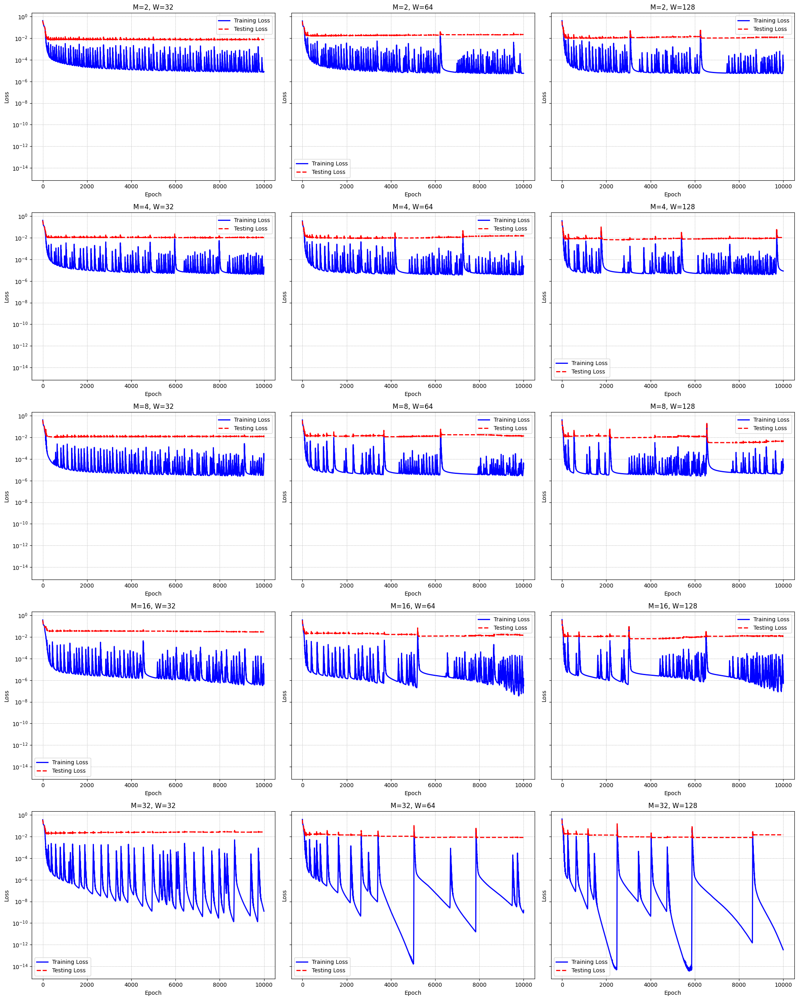

In [ ]:
# import matplotlib.pyplot as plt
# import json
# import math

# # Load metrics from the JSON file
# source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

# metrics_file = os.path.join(source_dir, "schro_fno_lr1e-2_epochs1e3_benchmark_metrics.json")
# if os.path.exists(metrics_file):
#     with open(metrics_file, "r") as f:
#       filtered_metrics = json.load(f)

# # Determine the number of subplots
# num_models = len(filtered_metrics)
# cols = 3  # Number of columns in the grid
# rows = math.ceil(num_models / cols)

# # Create subplots
# fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows), sharey=True)

# for i, metrics in enumerate(filtered_metrics):
#     modes = metrics["modes"]
#     width = metrics["width"]
#     loss_history = metrics["loss_history"]
#     epochs = len(loss_history)

#     # Find the current subplot
#     ax = axes[i // cols, i % cols] if rows > 1 else axes[i % cols]
#     ax.plot(range(epochs), loss_history, label=f"M={modes}, W={width}")
#     ax.set_yscale("log")
#     ax.set_title(f"M={modes}, W={width}")
#     ax.set_xlabel("Epoch")
#     ax.set_ylabel("Training Loss")
#     ax.grid(True)
#     ax.legend(fontsize="small")

# # Hide empty subplots
# for j in range(i + 1, rows * cols):
#     fig.delaxes(axes[j // cols, j % cols] if rows > 1 else axes[j % cols])

# plt.tight_layout()
# plt.show()




import matplotlib.pyplot as plt
import json
import os
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

metrics_file = os.path.join(source_dir, "schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Determine the number of configurations
num_configs = len(filtered_metrics)

# Calculate rows and columns for subplots
cols = 3  # Set the number of columns
rows = math.ceil(num_configs / cols)  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), sharey=True)
axes = axes.flatten()  # Flatten for easy indexing

# Plot each configuration
for i, metrics in enumerate(filtered_metrics):
    modes = metrics["modes"]
    widths = metrics["width"]
    train_loss_history = metrics["train_loss_history"]
    test_loss_history = metrics["test_loss_history"]

    # Plot training and testing loss in the respective subplot
    axes[i].plot(train_loss_history, label="Training Loss", color="blue", linewidth=2)
    axes[i].plot(test_loss_history, label="Testing Loss", color="red", linestyle="--", linewidth=2)

    # Configure subplot
    axes[i].set_yscale("log")
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].set_title(f"M={modes}, W={widths}")
    axes[i].legend()
    axes[i].grid(True, which="both", linestyle="--", linewidth=0.5)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save the figure as a PDF
# pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/FNO_final_loss_plots.pdf"
# plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

# print(f"Figure saved as PDF at: {pdf_path}")

## (Losses with weight decay 1e-4)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


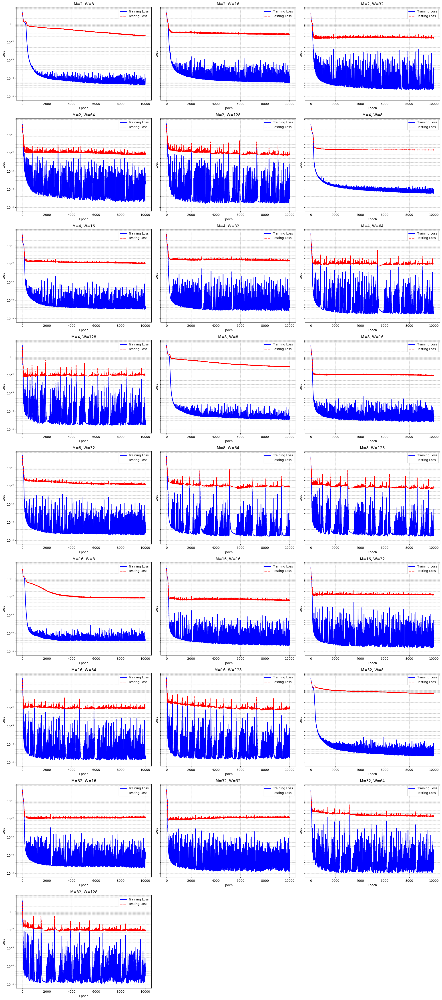

In [ ]:
# import matplotlib.pyplot as plt
# import json
# import math

# # Load metrics from the JSON file
# source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

# metrics_file = os.path.join(source_dir, "schro_fno_lr1e-2_epochs1e3_benchmark_metrics.json")
# if os.path.exists(metrics_file):
#     with open(metrics_file, "r") as f:
#       filtered_metrics = json.load(f)

# # Determine the number of subplots
# num_models = len(filtered_metrics)
# cols = 3  # Number of columns in the grid
# rows = math.ceil(num_models / cols)

# # Create subplots
# fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows), sharey=True)

# for i, metrics in enumerate(filtered_metrics):
#     modes = metrics["modes"]
#     width = metrics["width"]
#     loss_history = metrics["loss_history"]
#     epochs = len(loss_history)

#     # Find the current subplot
#     ax = axes[i // cols, i % cols] if rows > 1 else axes[i % cols]
#     ax.plot(range(epochs), loss_history, label=f"M={modes}, W={width}")
#     ax.set_yscale("log")
#     ax.set_title(f"M={modes}, W={width}")
#     ax.set_xlabel("Epoch")
#     ax.set_ylabel("Training Loss")
#     ax.grid(True)
#     ax.legend(fontsize="small")

# # Hide empty subplots
# for j in range(i + 1, rows * cols):
#     fig.delaxes(axes[j // cols, j % cols] if rows > 1 else axes[j % cols])

# plt.tight_layout()
# plt.show()




import matplotlib.pyplot as plt
import json
import os
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

metrics_file = os.path.join(source_dir, "schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Determine the number of configurations
num_configs = len(filtered_metrics)

# Calculate rows and columns for subplots
cols = 3  # Set the number of columns
rows = math.ceil(num_configs / cols)  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), sharey=True)
axes = axes.flatten()  # Flatten for easy indexing

# Plot each configuration
for i, metrics in enumerate(filtered_metrics):
    modes = metrics["modes"]
    widths = metrics["width"]
    train_loss_history = metrics["train_loss_history"]
    test_loss_history = metrics["test_loss_history"]

    # Plot training and testing loss in the respective subplot
    axes[i].plot(train_loss_history, label="Training Loss", color="blue", linewidth=2)
    axes[i].plot(test_loss_history, label="Testing Loss", color="red", linestyle="--", linewidth=2)

    # Configure subplot
    axes[i].set_yscale("log")
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].set_title(f"M={modes}, W={widths}")
    axes[i].legend()
    axes[i].grid(True, which="both", linestyle="--", linewidth=0.5)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save the figure as a PDF
# pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/FNO_final_loss_plots.pdf"
# plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

# print(f"Figure saved as PDF at: {pdf_path}")

## FNO visualization

In [ ]:
# Evaluate the FNO model
fno_model.eval()  # Set model to evaluation mode
with torch.no_grad():
    pred_output = fno_model(input_tensor).numpy()  # Shape: (8, len(xgrid), 2)

# Extract predicted u_real and u_imag
pred_u_real = pred_output[:, :, 0]  # Predicted u_real
pred_u_imag = pred_output[:, :, 1]  # Predicted u_imag

# np.sqrt(u_real_sol**2 + u_imag_sol**2)

# Select ground truth for u_real and u_imag at the sampled time steps
time_indices = np.searchsorted(tgrid, dt_train)
u_real_truth_selected = u_real_sol[:, time_indices]  # Ground truth u_real
u_imag_truth_selected = u_imag_sol[:, time_indices]  # Ground truth u_imag

# Compute absolute errors for u_real and u_imag
u_real_abs_error = np.abs(u_real_truth_selected.T - pred_u_real)
u_imag_abs_error = np.abs(u_imag_truth_selected.T - pred_u_imag)
u_norm_abs_error = np.abs(np.sqrt(u_real_truth_selected**2 + u_imag_truth_selected**2).T - np.sqrt(pred_u_real**2 + pred_u_imag**2))

# Subset the original time grid and ground truth data up to the last training time step
tgrid_subset = tgrid[tgrid <= dt_train[-1]]  # Subset tgrid up to the last training time
time_indices_subset = np.searchsorted(tgrid, tgrid_subset)  # Indices corresponding to the subset
u_real_sol_subset = u_real_sol[:, time_indices_subset]  # Subset u_real ground truth
u_imag_sol_subset = u_imag_sol[:, time_indices_subset]  # Subset u_imag ground truth

# Plotting results with ground truth limited to the reduced time grid
plt.figure(figsize=(20, 12))

# Ground Truth Re(u) (Reduced Time Grid)
plt.subplot(3, 3, 1)
plt.pcolormesh(tgrid_subset, xgrid, np.sqrt(u_real_sol_subset**2 + u_imag_sol_subset**2), cmap='coolwarm', shading='auto')
plt.colorbar(label='$Re(u(t,x))$')
plt.title('Ground Truth $Re(u(t,x))$ (Reduced Time Grid)')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Predicted Re(u) (Training Time Grid)
plt.subplot(3, 3, 2)
plt.pcolormesh(dt_train, xgrid, np.sqrt(pred_u_real**2 + pred_u_imag**2).T, cmap='coolwarm', shading='auto')
plt.colorbar(label='$Re(u(t,x))$')
plt.title('FNO Prediction $Re(u(t,x))$ (Training Grid)')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Absolute Error Re(u)
plt.subplot(3, 3, 3)
plt.pcolormesh(dt_train, xgrid, u_norm_abs_error.T, cmap='inferno', shading='auto')
plt.colorbar(label='Absolute Error $Re(u)$')
plt.title('Absolute Error in $Re(u)$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')





# Ground Truth Re(u) (Reduced Time Grid)
plt.subplot(3, 3, 4)
plt.pcolormesh(tgrid_subset, xgrid, u_real_sol_subset, cmap='coolwarm', shading='auto')
plt.colorbar(label='$Re(u(t,x))$')
plt.title('Ground Truth $Re(u(t,x))$ (Reduced Time Grid)')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Predicted Re(u) (Training Time Grid)
plt.subplot(3, 3, 5)
plt.pcolormesh(dt_train, xgrid, pred_u_real.T, cmap='coolwarm', shading='auto')
plt.colorbar(label='$Re(u(t,x))$')
plt.title('FNO Prediction $Re(u(t,x))$ (Training Grid)')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Ground Truth Im(u) (Reduced Time Grid)
plt.subplot(3, 3, 7)
plt.pcolormesh(tgrid_subset, xgrid, u_imag_sol_subset, cmap='coolwarm', shading='auto')
plt.colorbar(label='$Im(u(t,x))$')
plt.title('Ground Truth $Im(u(t,x))$ (Reduced Time Grid)')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Predicted Im(u) (Training Time Grid)
plt.subplot(3, 3, 8)
plt.pcolormesh(dt_train, xgrid, pred_u_imag.T, cmap='coolwarm', shading='auto')
plt.colorbar(label='$Im(u(t,x))$')
plt.title('FNO Prediction $Im(u(t,x))$ (Training Grid)')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Absolute Error Re(u)
plt.subplot(3, 3, 6)
plt.pcolormesh(dt_train, xgrid, u_real_abs_error.T, cmap='inferno', shading='auto')
plt.colorbar(label='Absolute Error $Re(u)$')
plt.title('Absolute Error in $Re(u)$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

# Absolute Error Im(u)
plt.subplot(3, 3, 9)
plt.pcolormesh(dt_train, xgrid, u_imag_abs_error.T, cmap='inferno', shading='auto')
plt.colorbar(label='Absolute Error $Im(u)$')
plt.title('Absolute Error in $Im(u)$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')

plt.tight_layout()
plt.show()

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cpu and cuda:0! (when checking argument for argument mat1 in method wrapper_CUDA_addmm)

## Final figures

### time plots

Mounted at /content/drive


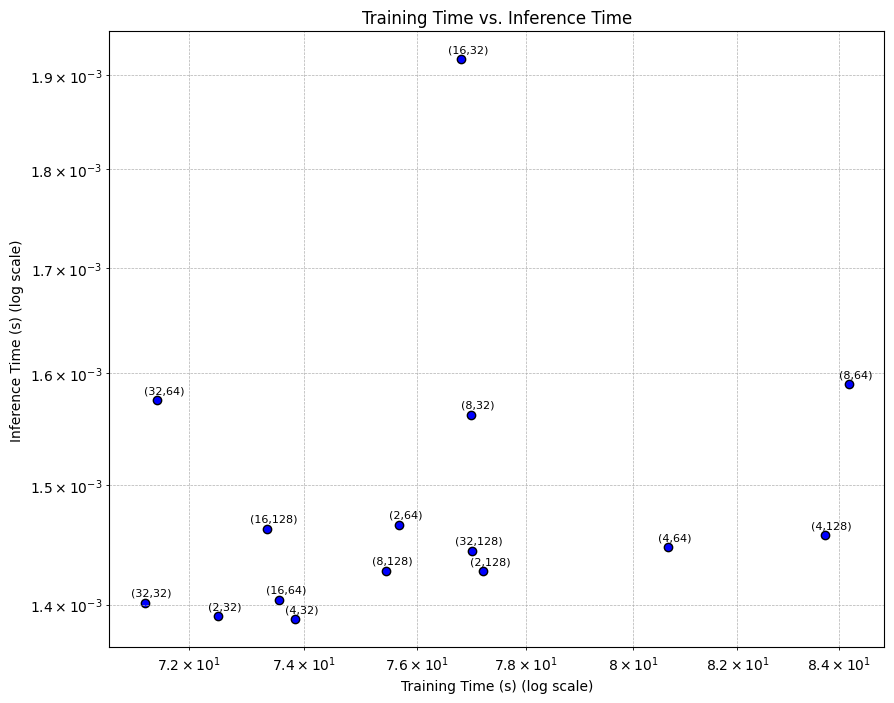

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Times.pdf


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import json
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your JSON file in Google Drive
file_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json"

# Load metrics from the JSON file
with open(file_path, "r") as f:
    filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
modes = [metrics["modes"] for metrics in filtered_metrics]  # Number of modes (M)
widths = [metrics["width"] for metrics in filtered_metrics]  # Width (W)

# Plot 1: Training Time vs. Inference Time
plt.figure(figsize=(10, 8))

# Training Time vs. Inference Time
plt.scatter(training_times, inference_times, color="blue", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Training Time (s) (log scale)")
plt.ylabel("Inference Time (s) (log scale)")
plt.title("Training Time vs. Inference Time")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for modes (M) and widths (W)
for i in range(len(training_times)):
    plt.annotate(f"({modes[i]},{widths[i]})",
                 (training_times[i], inference_times[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Times.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")


### Scaling plot

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


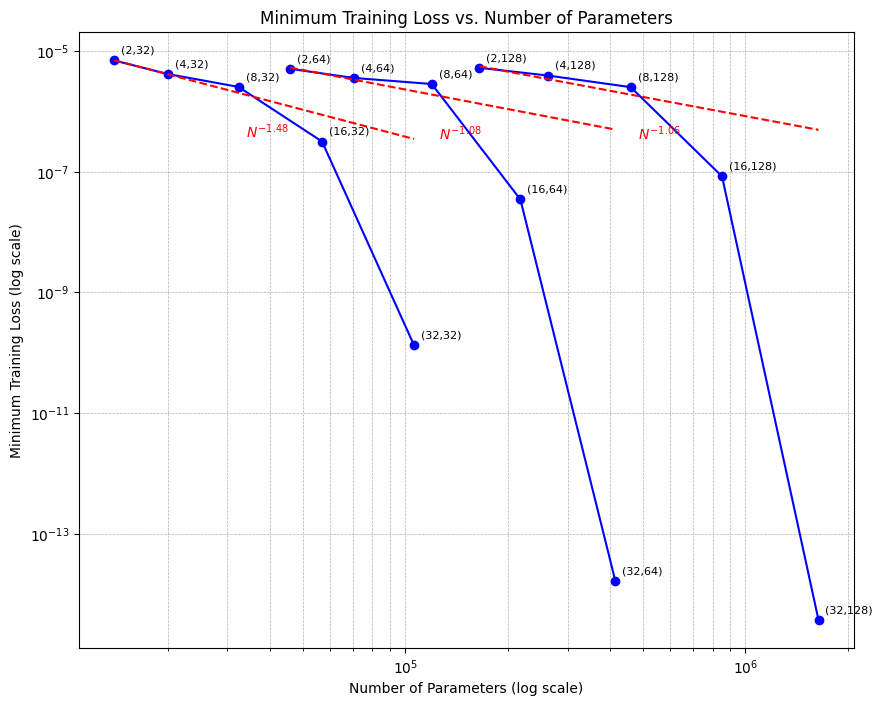

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Scaling.pdf


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import json
from scipy.optimize import curve_fit
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your JSON file in Google Drive
file_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json"

# Load metrics from the JSON file
with open(file_path, "r") as f:
    filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
modes = [metrics["modes"] for metrics in filtered_metrics]  # Number of modes (M)
widths = [metrics["width"] for metrics in filtered_metrics]  # Width (W)

# Fit function
def scaling_law(x, C, alpha):
    return C * (x ** alpha)

# Group points by width
unique_widths = sorted(set(widths))
width_groups = {w: {"num_params": [], "min_loss": [], "modes": []} for w in unique_widths}

for i in range(len(widths)):
    width_groups[widths[i]]["num_params"].append(num_parameters[i])
    width_groups[widths[i]]["min_loss"].append(min_train_losses[i])
    width_groups[widths[i]]["modes"].append(modes[i])

# Plot Log-Log Loss vs. Number of Parameters
plt.figure(figsize=(10, 8))

for width, group in width_groups.items():
    # Sort points for each width
    sorted_indices = np.argsort(group["num_params"])
    num_params_sorted = np.array(group["num_params"])[sorted_indices]
    min_loss_sorted = np.array(group["min_loss"])[sorted_indices]
    modes_sorted = np.array(group["modes"])[sorted_indices]

    # Fit scaling law
    params, _ = curve_fit(scaling_law, num_params_sorted, min_loss_sorted)
    C, alpha = params

    # Generate piecewise line
    plt.plot(num_params_sorted, min_loss_sorted, linestyle="-", marker="o", color="blue", linewidth=1.5)

    # Generate fitted line
    fitted_y = scaling_law(num_params_sorted, C, alpha)
    plt.plot(num_params_sorted, fitted_y, linestyle="--", color="red", linewidth=1.5)

    # Annotate (M, W) for each point
    for x, y, mode in zip(num_params_sorted, min_loss_sorted, modes_sorted):
        plt.annotate(f"({mode},{width})", (x, y), textcoords="offset points", xytext=(5, 5), fontsize=8)

    # Annotate the scaling law ~N^alpha
    mid_x = np.median(num_params_sorted)
    mid_y = scaling_law(mid_x, C, alpha)
    plt.text(1.2*mid_x, 0.18*mid_y, f"$~N^{{{alpha:.2f}}}$", fontsize=10, ha="center", color="red")

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Training Loss (log scale)")
plt.title("Minimum Training Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Scaling.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

### Loss curve

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


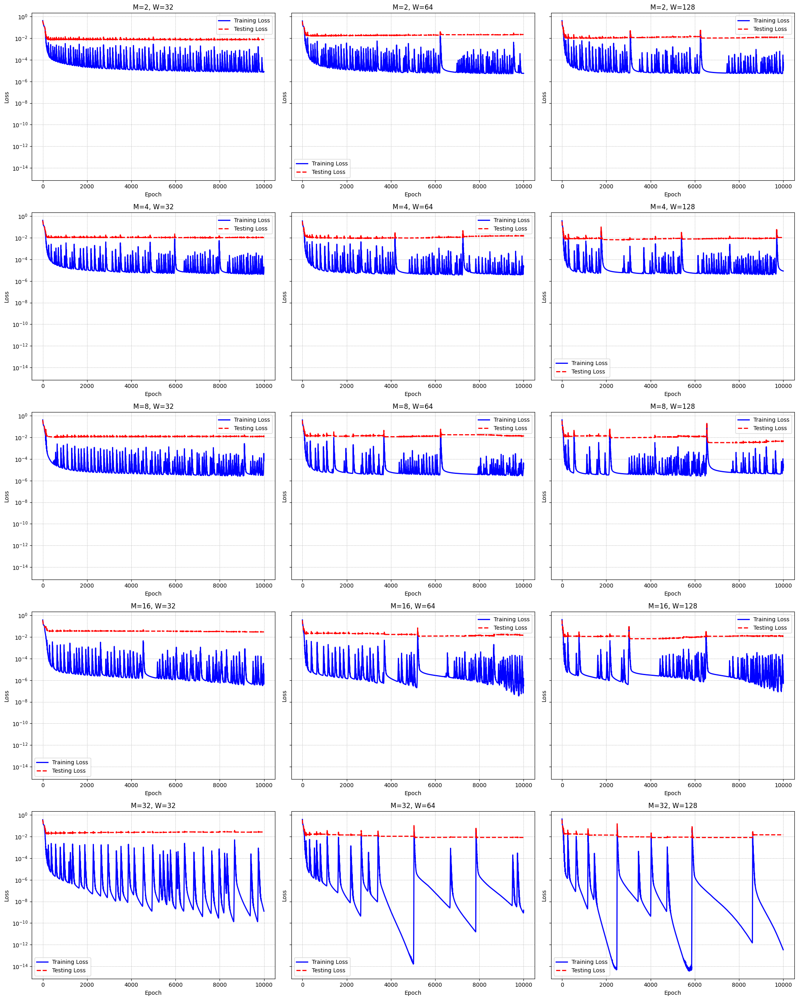

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Loss.pdf


In [3]:
import matplotlib.pyplot as plt
import json
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your JSON file in Google Drive
file_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json"

# Load metrics from the JSON file
with open(file_path, "r") as f:
    filtered_metrics = json.load(f)

# Determine the number of configurations
num_configs = len(filtered_metrics)

# Calculate rows and columns for subplots
cols = 3  # Set the number of columns
rows = math.ceil(num_configs / cols)  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), sharey=True)
axes = axes.flatten()  # Flatten for easy indexing

# Plot each configuration
for i, metrics in enumerate(filtered_metrics):
    modes = metrics["modes"]
    widths = metrics["width"]
    train_loss_history = metrics["train_loss_history"]
    test_loss_history = metrics["test_loss_history"]

    # Plot training and testing loss in the respective subplot
    axes[i].plot(train_loss_history, label="Training Loss", color="blue", linewidth=2)
    axes[i].plot(test_loss_history, label="Testing Loss", color="red", linestyle="--", linewidth=2)

    # Configure subplot
    axes[i].set_yscale("log")
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].set_title(f"M={modes}, W={widths}")
    axes[i].legend()
    axes[i].grid(True, which="both", linestyle="--", linewidth=0.5)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Loss.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")


## FNO Field Visualization

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Metrics loaded successfully!
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_2_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_2_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_2_width_128.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_4_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_4_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Mode

<ipython-input-8-f3cee48b9e0a>:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  fno_model.load_state_dict(torch.load(model_path))


Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_8_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_8_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_8_width_128.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_16_width_32.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_16_width_64.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/FNO_model_modes_16_width_128.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_S

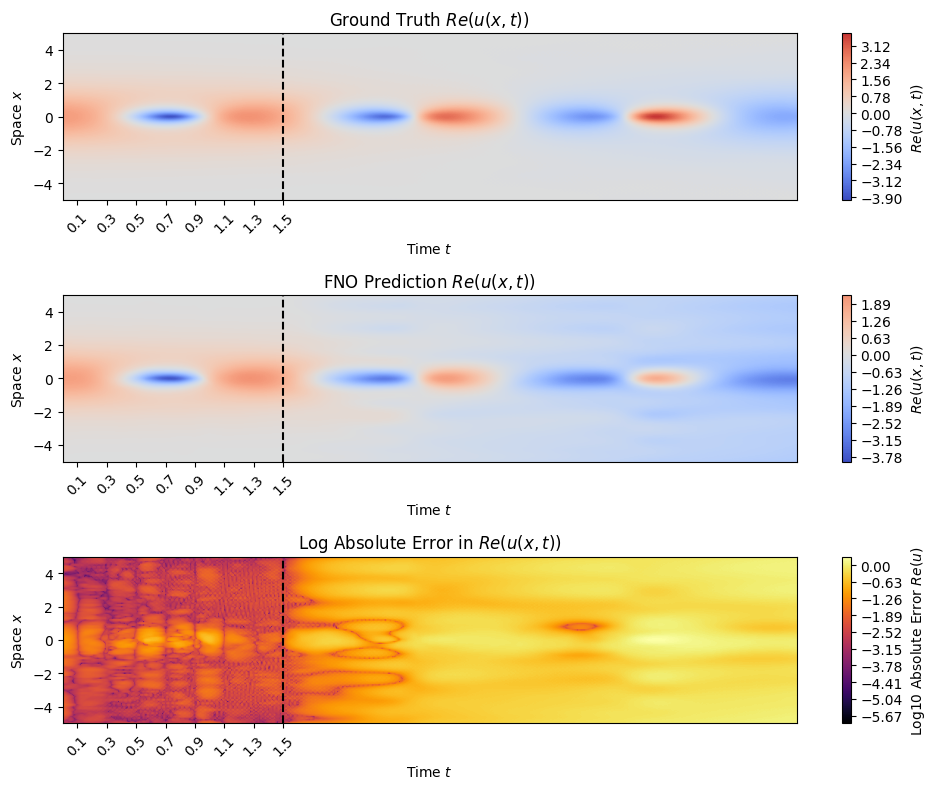

Plot saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_field_visual.pdf


In [8]:
#Load the saved model for M = 8, W = 32
from google.colab import drive
import os
import torch
import json

# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/FNO_final/'

# Load metrics from the JSON file
metrics_file = os.path.join(source_dir, "schro_fno_lr1e-3_epochs1e4_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
        all_metrics = json.load(f)
    print("Metrics loaded successfully!")
else:
    print(f"Metrics file not found in {source_dir}!")


# Load models from the saved paths
loaded_models = {}
for metrics in all_metrics:
    model_path = os.path.join(source_dir, os.path.basename(metrics["model_path"]))
    if os.path.exists(model_path):
        print(f"Loading model from {model_path}...")
        fno_model = FNO1d(metrics["modes"], metrics["width"])  # Recreate the FNO model architecture
        fno_model.load_state_dict(torch.load(model_path))
        fno_model.eval()
        loaded_models[f'M={metrics["modes"]}_W={metrics["width"]}'] = fno_model
    else:
        print(f"Model file {model_path} not found!")

fno_visual = loaded_models["M=8_W=32"]

# Prepare data
spatial_grid_vis = np.repeat(xgrid.reshape(1, -1), len(tgrid), axis=0)
temporal_grid_vis = np.repeat(tgrid.reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, and fields (Ey, Hz) as input
input_data_vis = np.stack([spatial_grid_vis, temporal_grid_vis, u_real_sol.T], axis=-1)
output_data_vis = np.stack([u_real_sol, u_imag_sol], axis=-1)

# Convert to PyTorch tensors
input_tensor = torch.tensor(input_data_vis, dtype=torch.float32)
output_tensor = torch.tensor(output_data_vis, dtype=torch.float32)


# Evaluate the FNO model
fno_visual.eval()  # Set model to evaluation mode
with torch.no_grad():
    pred_output = fno_visual(input_tensor).numpy()  # Shape: (8, len(xgrid), 2)

# Extract predicted E_y and H_z
pred_u_real = pred_output[:, :, 0]  # Predicted E_y
pred_u_imag = pred_output[:, :, 1]  # Predicted H_z

# Select ground truth for E_y and H_z at the sampled time steps
u_real_truth_selected = u_real_sol # Ground truth E_y
u_imag_truth_selected = u_imag_sol  # Ground truth H_z




# Compute absolute errors for E_y and H_z
u_real_abs_error = np.abs(u_real_truth_selected.T - pred_u_real)
u_imag_abs_error = np.abs(u_imag_truth_selected.T - pred_u_imag)



# File path for saving the PDF
output_pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_field_visual.pdf"

# Last training time step
last_training_time = dt_train[-1]
vmin = u_real_sol.min()
vmax = u_imag_sol.max()

# Plotting results in one column
plt.figure(figsize=(10, 8))

# Ground Truth E_y (Contour Plot)
plt.subplot(3, 1, 1)
contour_Ey = plt.contourf(tgrid, xgrid, u_real_sol, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
plt.colorbar(contour_Ey, label='$Re(u(x,t))$')
plt.title('Ground Truth $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# Predicted E_y (Contour Plot)
plt.subplot(3, 1, 2)
contour_pred_Ey = plt.contourf(tgrid, xgrid, pred_u_real.T, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
plt.colorbar(contour_pred_Ey, label='$Re(u(x,t))$')
plt.title('FNO Prediction $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# Log Absolute Error E_y (Contour Plot)
plt.subplot(3, 1, 3)
log_u_real_abs_error = np.log10(np.clip(u_real_abs_error, a_min=1e-12, a_max=None))  # Clip to avoid log of 0
contour_log_Ey = plt.contourf(tgrid, xgrid, log_u_real_abs_error.T, levels=500, cmap='inferno')
plt.colorbar(contour_log_Ey, label='Log10 Absolute Error $Re(u)$')
plt.title('Log Absolute Error in $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

plt.tight_layout()

# Save the figure as a PDF
plt.savefig(output_pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Plot saved as PDF at: {output_pdf_path}")


##Testing

Here we select a particular FNO hyperparameter, M = 8 and W = 32. We use this model, and test it for the following three different testing dataset.

1. Test set A: Interpolated time
2. Test set B: Extrapolated time
3. Test set C: Change the initial condition

### Creating testing datasets

Schrödinger equation datasets prepared.


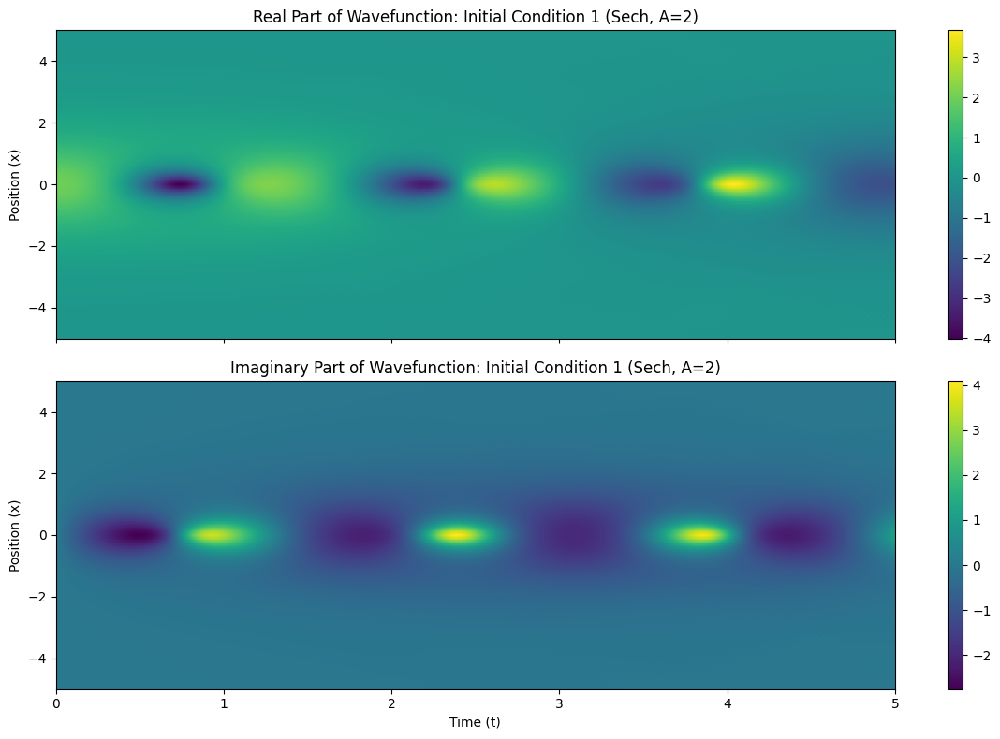

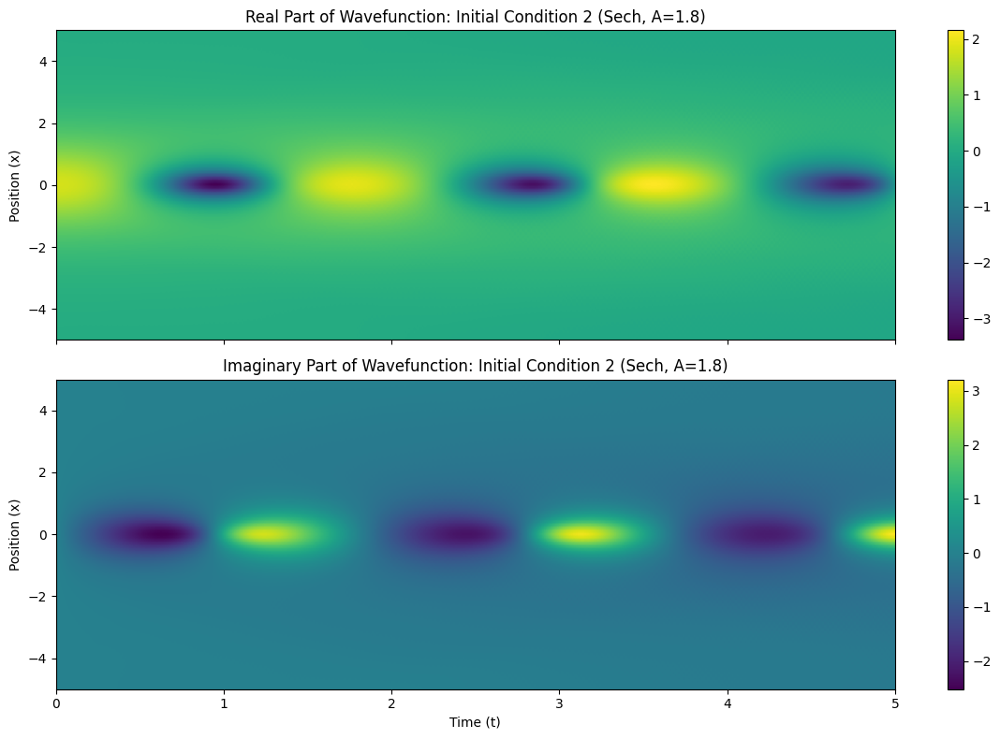

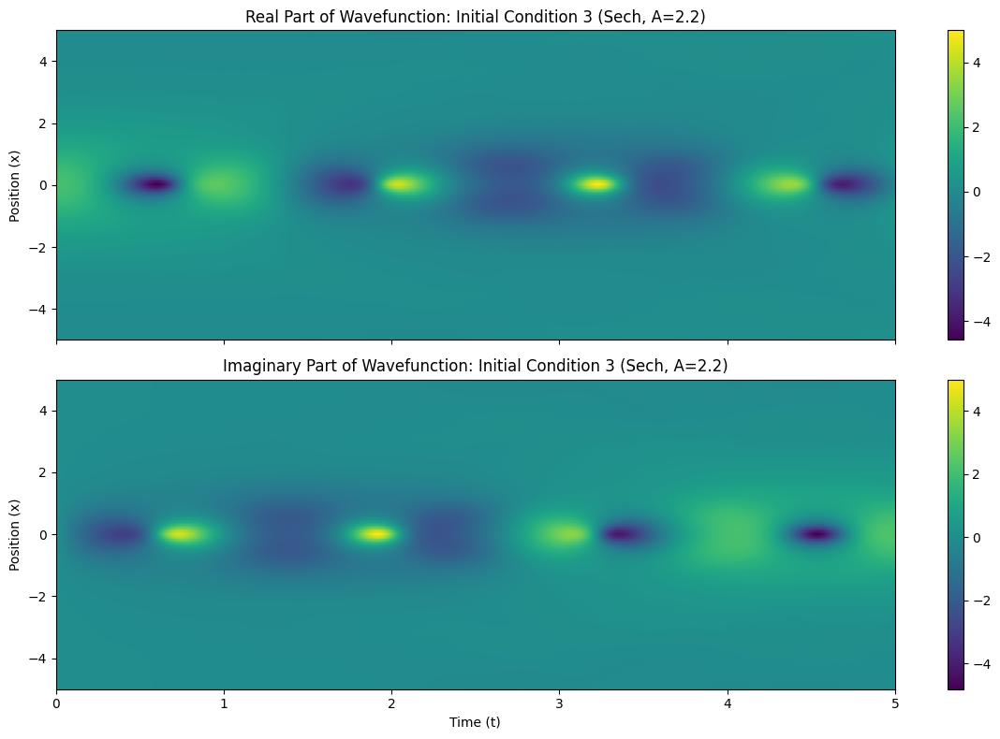

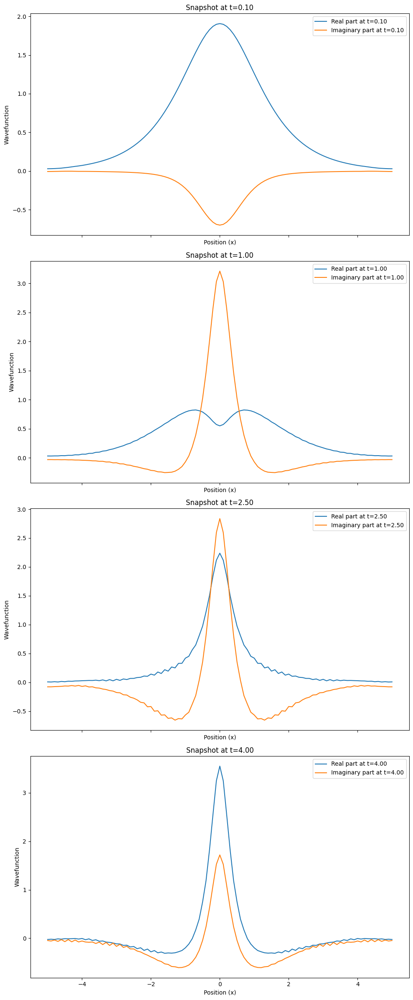

In [60]:
import numpy as np
import torch
from scipy.integrate import solve_ivp

# Parameters
xspan = (-5.0, 5.0)
tspan = (0.0, 5.0)
dx = 0.1
dt = 0.01
xgrid = np.arange(xspan[0], xspan[1] + dx, dx)
tgrid = np.arange(tspan[0], tspan[1] + dt, dt)

# Initial conditions
def sech(x, A):
    return A / np.cosh(x)

# def gaussian(x, x0=0.0, sigma=1.0):
#     return np.exp(-((x - x0) ** 2) / (2 * sigma ** 2))

u_real_init1 = sech(xgrid, A = 2)
u_imag_init1 = np.zeros_like(xgrid)

u_real_init2 = sech(xgrid, A = 1.8)
u_imag_init2 = np.zeros_like(xgrid)

u_real_init3 = sech(xgrid, A = 2.2)
u_imag_init3 = np.zeros_like(xgrid)

# Discretization
def schrodinger_rhs(t, y, dx, N):
    u_real = y[:N]
    u_imag = y[N:]
    d2u_real_dx2 = np.zeros_like(u_real)
    d2u_imag_dx2 = np.zeros_like(u_imag)

    # Second derivative using finite differences (Neumann boundary conditions)
    for i in range(1, N-1):
        d2u_real_dx2[i] = (u_real[i-1] - 2 * u_real[i] + u_real[i+1]) / dx**2
        d2u_imag_dx2[i] = (u_imag[i-1] - 2 * u_imag[i] + u_imag[i+1]) / dx**2

    # Periodic boundary conditions
    d2u_real_dx2[0] = (u_real[-1] - 2 * u_real[0] + u_real[1]) / dx**2
    d2u_real_dx2[-1] = (u_real[-2] - 2 * u_real[-1] + u_real[0]) / dx**2

    d2u_imag_dx2[0] = (u_imag[-1] - 2 * u_imag[0] + u_imag[1]) / dx**2
    d2u_imag_dx2[-1] = (u_imag[-2] - 2 * u_imag[-1] + u_imag[0]) / dx**2

    # RHS of the Schrödinger equation
    du_real_dt = 0.5 * d2u_imag_dx2 + (u_real**2 + u_imag**2) * u_imag
    du_imag_dt = -0.5 * d2u_real_dx2 - (u_real**2 + u_imag**2) * u_real

    return np.concatenate([du_real_dt, du_imag_dt])

# Solve the PDE for different initial conditions
N = len(xgrid)

y0_1 = np.concatenate([u_real_init1, u_imag_init1])
sol1 = solve_ivp(schrodinger_rhs, tspan, y0_1, method='RK45', t_eval=tgrid, args=(dx, N))

y0_2 = np.concatenate([u_real_init2, u_imag_init2])
sol2 = solve_ivp(schrodinger_rhs, tspan, y0_2, method='RK45', t_eval=tgrid, args=(dx, N))

y0_3 = np.concatenate([u_real_init3, u_imag_init3])
sol3 = solve_ivp(schrodinger_rhs, tspan, y0_3, method='RK45', t_eval=tgrid, args=(dx, N))

# Extract solutions
u_real_sol1 = sol1.y[:N, :]
u_imag_sol1 = sol1.y[N:, :]

u_real_sol2 = sol2.y[:N, :]
u_imag_sol2 = sol2.y[N:, :]

u_real_sol3 = sol3.y[:N, :]
u_imag_sol3 = sol3.y[N:, :]

# Extract training data
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]

u_real_train = np.array([u_real_sol1[:, idx] for idx in idx_])
u_imag_train = np.array([u_imag_sol1[:, idx] for idx in idx_])
time_steps = np.array(dt_train)

# Prepare training data
spatial_grid = np.repeat(xgrid.reshape(1, -1), len(time_steps), axis=0)
temporal_grid = np.repeat(time_steps.reshape(-1, 1), len(xgrid), axis=1)

input_data = np.stack([spatial_grid, temporal_grid, u_real_train], axis=-1)
output_data = np.stack([u_real_train, u_imag_train], axis=-1)

# Convert to PyTorch tensors
input_tensor = torch.tensor(input_data, dtype=torch.float32)
output_tensor = torch.tensor(output_data, dtype=torch.float32)

# Define test time grids
dt_testA = np.arange(0, 1.6, 0.2)
dt_testB = np.arange(1.6, 3.2, 0.2)

# Extract test data
u_real_testA = np.array([u_real_sol1[:, int(t / dt)] for t in dt_testA])
u_imag_testA = np.array([u_imag_sol1[:, int(t / dt)] for t in dt_testA])

u_real_testB = np.array([u_real_sol1[:, int(t / dt)] for t in dt_testB])
u_imag_testB = np.array([u_imag_sol1[:, int(t / dt)] for t in dt_testB])

u_real_testC = np.array([u_real_sol2[:, int(t / dt)] for t in dt_train])
u_imag_testC = np.array([u_imag_sol2[:, int(t / dt)] for t in dt_train])

u_real_testD = np.array([u_real_sol3[:, int(t / dt)] for t in dt_train])
u_imag_testD = np.array([u_imag_sol3[:, int(t / dt)] for t in dt_train])

# Prepare test datasets
spatial_test_gridA = np.repeat(xgrid.reshape(1, -1), len(dt_testA), axis=0)
temporal_test_gridA = np.repeat(dt_testA.reshape(-1, 1), len(xgrid), axis=1)

spatial_test_gridB = np.repeat(xgrid.reshape(1, -1), len(dt_testB), axis=0)
temporal_test_gridB = np.repeat(dt_testB.reshape(-1, 1), len(xgrid), axis=1)

spatial_test_gridCD = np.repeat(xgrid.reshape(1, -1), len(dt_train), axis=0)
temporal_test_gridCD = np.repeat(np.array(dt_train).reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, and fields for testing
input_data_testA = np.stack([spatial_test_gridA, temporal_test_gridA, u_real_testA], axis=-1)
output_data_testA = np.stack([u_real_testA, u_imag_testA], axis=-1)

input_data_testB = np.stack([spatial_test_gridB, temporal_test_gridB, u_real_testB], axis=-1)
output_data_testB = np.stack([u_real_testB, u_imag_testB], axis=-1)

input_data_testC = np.stack([spatial_test_gridCD, temporal_test_gridCD, u_real_testC], axis=-1)
output_data_testC = np.stack([u_real_testC, u_imag_testC], axis=-1)

input_data_testD = np.stack([spatial_test_gridCD, temporal_test_gridCD, u_real_testD], axis=-1)
output_data_testD = np.stack([u_real_testD, u_imag_testD], axis=-1)

# Convert test data to PyTorch tensors
input_tensor_testA = torch.tensor(input_data_testA, dtype=torch.float32)
output_tensor_testA = torch.tensor(output_data_testA, dtype=torch.float32)

input_tensor_testB = torch.tensor(input_data_testB, dtype=torch.float32)
output_tensor_testB = torch.tensor(output_data_testB, dtype=torch.float32)

input_tensor_testC = torch.tensor(input_data_testC, dtype=torch.float32)
output_tensor_testC = torch.tensor(output_data_testC, dtype=torch.float32)

input_tensor_testD = torch.tensor(input_data_testD, dtype=torch.float32)
output_tensor_testD = torch.tensor(output_data_testD, dtype=torch.float32)

print("Schrödinger equation datasets prepared.")




import matplotlib.pyplot as plt

# Function to plot the wavefunction evolution
def plot_wavefunction(xgrid, tgrid, u_real_sol, u_imag_sol, title="Wavefunction Evolution"):
    fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # Plot real part
    im1 = ax[0].imshow(
        u_real_sol, aspect='auto', extent=[tgrid[0], tgrid[-1], xgrid[0], xgrid[-1]], origin='lower'
    )
    ax[0].set_title(f"Real Part of Wavefunction: {title}")
    ax[0].set_ylabel("Position (x)")
    plt.colorbar(im1, ax=ax[0])

    # Plot imaginary part
    im2 = ax[1].imshow(
        u_imag_sol, aspect='auto', extent=[tgrid[0], tgrid[-1], xgrid[0], xgrid[-1]], origin='lower'
    )
    ax[1].set_title(f"Imaginary Part of Wavefunction: {title}")
    ax[1].set_xlabel("Time (t)")
    ax[1].set_ylabel("Position (x)")
    plt.colorbar(im2, ax=ax[1])

    plt.tight_layout()
    plt.show()

# Function to plot snapshots at specific times
def plot_snapshots(xgrid, tgrid, u_real_sol, u_imag_sol, times, title="Snapshots"):
    fig, ax = plt.subplots(len(times), 1, figsize=(10, 6 * len(times)), sharex=True)

    if len(times) == 1:
        ax = [ax]  # Ensure ax is iterable if only one subplot is created

    for i, t in enumerate(times):
        idx = int(t / dt)  # Find the closest time index
        ax[i].plot(xgrid, u_real_sol[:, idx], label=f"Real part at t={t:.2f}")
        ax[i].plot(xgrid, u_imag_sol[:, idx], label=f"Imaginary part at t={t:.2f}")
        ax[i].set_title(f"Snapshot at t={t:.2f}")
        ax[i].set_xlabel("Position (x)")
        ax[i].set_ylabel("Wavefunction")
        ax[i].legend()

    plt.tight_layout()
    plt.show()

# Plot wavefunction evolution for each initial condition
plot_wavefunction(xgrid, tgrid, u_real_sol1, u_imag_sol1, title="Initial Condition 1 (Sech, A=2)")
plot_wavefunction(xgrid, tgrid, u_real_sol2, u_imag_sol2, title="Initial Condition 2 (Sech, A=1.8)")
plot_wavefunction(xgrid, tgrid, u_real_sol3, u_imag_sol3, title="Initial Condition 3 (Sech, A=2.2)")

# Plot snapshots at specific times for the first initial condition
snapshot_times = [0.1, 1.0, 2.5, 4.0]
plot_snapshots(xgrid, tgrid, u_real_sol1, u_imag_sol1, snapshot_times, title="Snapshots for Initial Condition 1")






### Training

In [61]:
# Function to train and benchmark the FNO model
def fno_training_test(
    modes, width, lr, epochs, input_tensor, output_tensor, input_tensor_test, output_tensor_test, save_path="model.pth"
):
    fno_model = FNO1d(modes, width)
    optimizer = torch.optim.Adam(fno_model.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    train_loss_history = []
    test_loss_historyA = []
    test_loss_historyB = []
    test_loss_historyC = []
    test_loss_historyD = []

    for epoch in range(epochs):
        # Training step
        fno_model.train()
        optimizer.zero_grad()
        predictions = fno_model(input_tensor)
        train_loss = loss_fn(predictions, output_tensor)
        train_loss.backward()
        optimizer.step()

        # Record training loss
        train_loss_history.append(train_loss.item())

        # Testing step
        fno_model.eval()
        with torch.no_grad():
            test_predictionsA = fno_model(input_tensor_test[0])
            test_lossA = loss_fn(test_predictionsA, output_tensor_test[0])
            test_loss_historyA.append(test_lossA.item())

            test_predictionsB = fno_model(input_tensor_test[1])
            test_lossB = loss_fn(test_predictionsB, output_tensor_test[1])
            test_loss_historyB.append(test_lossB.item())

            test_predictionsC = fno_model(input_tensor_test[2])
            test_lossC = loss_fn(test_predictionsC, output_tensor_test[2])
            test_loss_historyC.append(test_lossC.item())

            test_predictionsD = fno_model(input_tensor_test[2])
            test_lossD = loss_fn(test_predictionsD, output_tensor_test[2])
            test_loss_historyD.append(test_lossD.item())

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss A: {test_lossA.item()}, Testing Loss B: {test_lossB.item()}, Testing Loss C: {test_lossC.item()}, Testing Loss D: {test_lossD.item()}")

    # Save the trained model
    torch.save(fno_model.state_dict(), save_path)

    return {
        "modes": modes,
        "width": width,
        "lr": lr,
        "epochs": epochs,
        "train_loss_history": train_loss_history,
        "test_loss_historyA": test_loss_historyA,
        "test_loss_historyB": test_loss_historyB,
        "test_loss_historyC": test_loss_historyC,
        "test_loss_historyD": test_loss_historyD,
        "model_path": save_path,
    }

### Plotting

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Training model with modes=8, width=32
Epoch 0, Training Loss: 0.3794916868209839, Testing Loss A: 0.3632141053676605, Testing Loss B: 0.36701130867004395, Testing Loss C: 0.30090421438217163, Testing Loss D: 0.30090421438217163
Epoch 100, Training Loss: 0.02010810561478138, Testing Loss A: 0.0670425295829773, Testing Loss B: 0.622978150844574, Testing Loss C: 0.14662690460681915, Testing Loss D: 0.14662690460681915
Epoch 200, Training Loss: 0.00017402885714545846, Testing Loss A: 0.019937165081501007, Testing Loss B: 0.4872470498085022, Testing Loss C: 0.15018180012702942, Testing Loss D: 0.15018180012702942
Epoch 300, Training Loss: 8.32683508633636e-05, Testing Loss A: 0.019515864551067352, Testing Loss B: 0.4884394407272339, Testing Loss C: 0.15156956017017365, Testing Loss D: 0.15156956017017365
Epoch 400, Training Loss: 5.110584243084304e-05, Testing Los

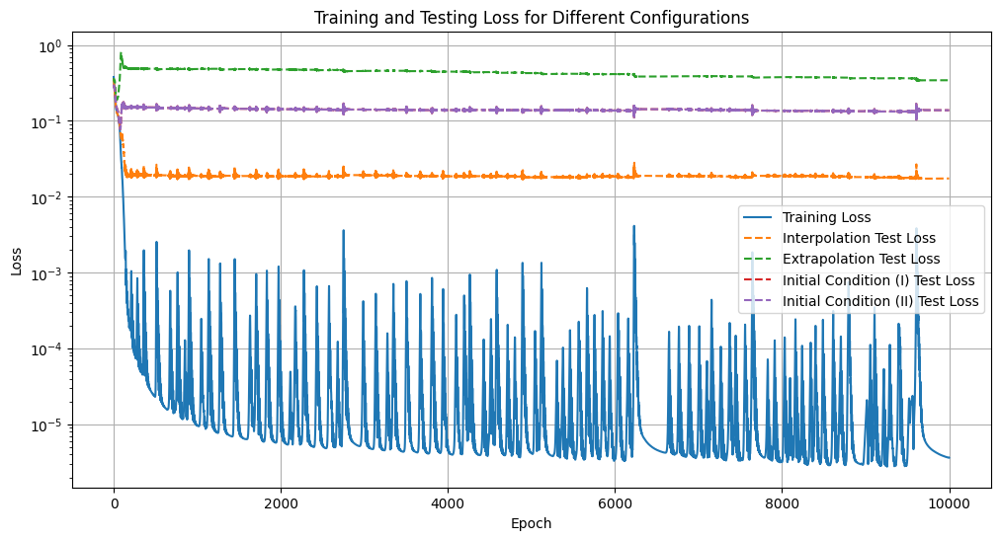

In [66]:
import os
import matplotlib.pyplot as plt
import json
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load existing metrics
if os.path.exists("schro_fno_testing_metrics.json"):
    with open("schro_fno_testing_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

all_metrics = []

# Training loop
lr = 1e-3
epochs = 10000

# M <= N/2 + 1 = 51
modes_range = [8]
width_range = [32]

for modes in modes_range:
    for width in width_range:
        print(f"Training model with modes={modes}, width={width}")
        save_path = f"schro_fno_model_modes_{modes}_width_{width}.pth"
        metrics = fno_training_test(
            modes=modes,
            width=width,
            lr=lr,
            epochs=epochs,
            input_tensor=input_tensor,
            output_tensor=output_tensor,
            input_tensor_test=[input_tensor_testA,input_tensor_testB,input_tensor_testC,input_tensor_testD],
            output_tensor_test=[output_tensor_testA,output_tensor_testB,output_tensor_testC,output_tensor_testD],
            save_path=save_path,
        )
        all_metrics.append(metrics)

        # Save metrics incrementally
        with open("schro_fno_testing_metrics.json", "w") as f:
            json.dump(all_metrics, f, indent=4)

        print(f"Metrics for modes={modes}, width={width} saved.")

# Plot training and testing loss for all configurations
plt.figure(figsize=(12, 6))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label="Training Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyA"],
        linestyle="--",
        label="Interpolation Test Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyB"],
        linestyle="--",
        label="Extrapolation Test Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyC"],
        linestyle="--",
        label="Initial Condition (I) Test Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyD"],
        linestyle="--",
        label="Initial Condition (II) Test Loss",
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for Different Configurations")
plt.legend()
plt.grid(True)
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


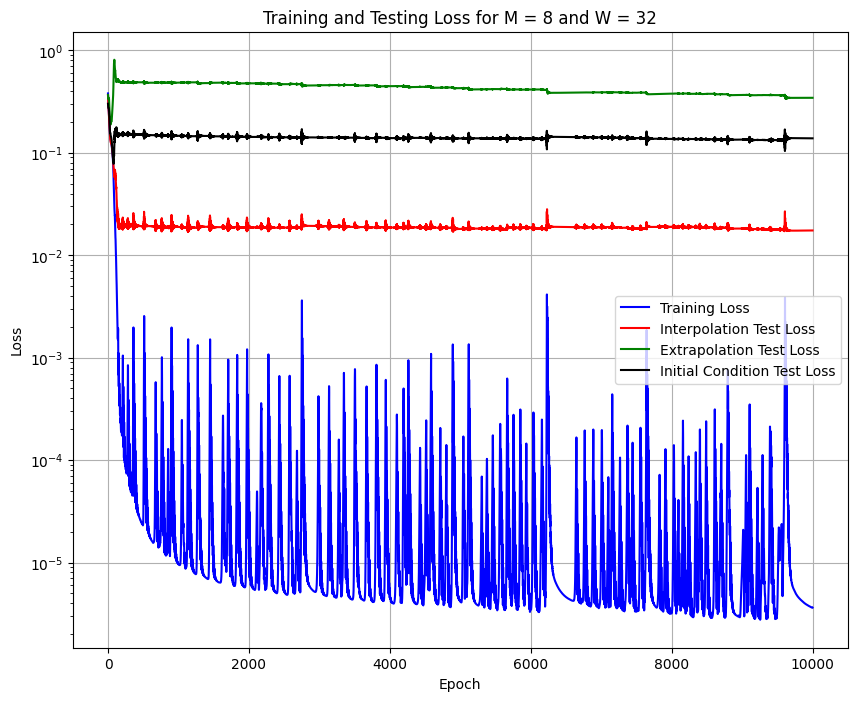

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Testing_v2.pdf


In [67]:
import os
import matplotlib.pyplot as plt
import json
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Plot training and testing loss for all configurations
plt.figure(figsize=(10, 8))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label="Training Loss",
        color = "blue"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyA"],
        label="Interpolation Test Loss",
        color = "red"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyB"],
        label="Extrapolation Test Loss",
        color = "green"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyC"],
        label="Initial Condition Test Loss",
        color="black"
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for M = 8 and W = 32")
plt.legend()
plt.grid(True)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_MWL_Testing_v2.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

In [65]:
print(len(metrics["test_loss_historyB"]))

10000


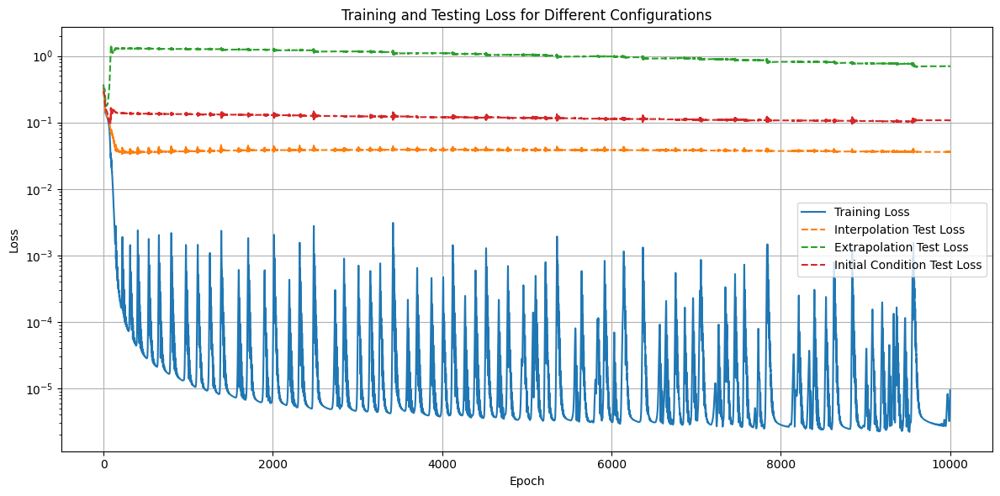

Plot saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_test_init_cond.pdf


In [21]:
output_pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_FNO_test_init_cond.pdf"


# Plot training and testing loss for all configurations
plt.figure(figsize=(12, 6))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label="Training Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyA"],
        linestyle="--",
        label="Interpolation Test Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyB"],
        linestyle="--",
        label="Extrapolation Test Loss",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyC"],
        linestyle="--",
        label="Initial Condition Test Loss",
    )
    # plt.plot(
    #     epochs_range,
    #     metrics["test_loss_historyD"],
    #     linestyle="--",
    #     label="Initial Condition (II) Test Loss",
    # )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for Different Configurations")
plt.legend()
plt.grid(True)

plt.tight_layout()

# Save the figure as a PDF
plt.savefig(output_pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Plot saved as PDF at: {output_pdf_path}")


# KAN-ODE

In [27]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Extract training data from the Schrodinger solution
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]
X_real_train = np.array([sol.y[:N, idx] for idx in idx_])
X_imag_train = np.array([sol.y[N:, idx] for idx in idx_])
X_train = np.hstack([X_real_train, X_imag_train])  # Combined real and imaginary parts
time_steps = np.array(dt_train)

# Radial Basis Function (RBF)
def rbf(x, z, h):
    """Radial Basis Function."""
    z = z.to(x.device)
    return torch.exp(-((x - z) / h) ** 2)

# Define KAN-ODE architecture
# KDense Layer
class KDense(nn.Module):
    def __init__(self, in_dims, out_dims, grid_len,
                 normalizer=torch.tanh, grid_lims=(-1.0, 1.0),
                 denominator=None, basis_func=rbf,
                 base_act=torch.nn.SiLU(), use_base_act=True):
        """
        Kolmogorov-Arnold Dense Layer.

        :param in_dims: Input dimensionality.
        :param out_dims: Output dimensionality.
        :param grid_len: Number of grid points.
        """
        super(KDense, self).__init__()
        self.in_dims = in_dims
        self.out_dims = out_dims
        self.grid_len = grid_len
        self.normalizer = normalizer
        self.grid_lims = torch.tensor(grid_lims, dtype=torch.float32)
        self.denominator = denominator or (2 / (grid_len - 1))
        self.basis_func = basis_func
        self.base_act = base_act
        self.use_base_act = use_base_act

        # Define weights
        self.C = nn.Parameter(torch.empty(out_dims, grid_len * in_dims))
        if use_base_act:
            self.W = nn.Parameter(torch.empty(out_dims, in_dims))
        else:
            self.W = None

        # Initialize weights
        nn.init.xavier_uniform_(self.C)  # Glorot initialization
        if self.use_base_act:
            nn.init.xavier_uniform_(self.W)

        # Create grid
        self.grid = torch.linspace(self.grid_lims[0], self.grid_lims[1], grid_len)

    def forward(self, x):
        """
        Forward pass through the KDense layer.

        :param x: Input tensor (batch_size, in_dims).
        :return: Output tensor (batch_size, out_dims).
        """
        batch_size = x.shape[0] if x.ndim > 1 else 1  # Handle batch size or single input
        x = x.unsqueeze(0) if x.ndim == 1 else x  # Ensure input is 2D for consistency

        # Normalize inputs
        x_norm = self.normalizer(x)  # ∈ [-1, 1]

        # Move self.grid to the same device as x
        grid = self.grid.to(x.device)

        # Reshape inputs for basis function computation
        x_reshaped = x_norm.unsqueeze(-1)  # Shape: (batch_size, in_dims, 1)

        # Compute basis function
        basis = self.basis_func(x_reshaped, self.grid, self.denominator)  # Shape: (batch_size, in_dims, grid_len)

        # Reshape basis to align with weight dimensions
        if basis.ndim == 3:
            basis = basis.permute(0, 2, 1).contiguous()  # Reorder to (batch_size, grid_len, in_dims)
            basis = basis.view(batch_size, -1)  # Flatten to (batch_size, grid_len * in_dims)
        elif basis.ndim == 2:  # Handle non-batch case
            basis = basis.view(-1)  # Flatten for single instance

        # print(f"basis shape: {basis.shape}")  # Should be (batch_size, grid_len * in_dims)
        # print(f"self.C shape: {self.C.shape}")  # Should be (out_dims, grid_len * in_dims)


        # Compute spline component
        spline = torch.matmul(basis, self.C.T)  # Shape: (batch_size, out_dims)

        if self.use_base_act:
            base = torch.matmul(x, self.W.T)  # Shape: (batch_size, out_dims)
            base = self.base_act(base)
            return spline + base
        else:
            return spline


# Updated KANODE class
# KANODE Architecture
class KANODE(nn.Module):
    def __init__(self, xgrid_len, KANnode, KANgrid):
        """
        Kolmogorov-Arnold Neural ODE Model.

        :param xgrid_len: Length of spatial grid.
        :param KANnode: Number of nodes per layer.
        :param KANgrid: Number of grid points in KDense.
        """
        super(KANODE, self).__init__()
        self.layer1 = KDense(xgrid_len * 2, KANnode, KANgrid, basis_func=rbf)
        self.layer2 = KDense(KANnode, xgrid_len * 2, KANgrid, basis_func=rbf)

    def forward(self, t, y):
        y = self.layer1(y)
        y = self.layer2(y)
        return y

Using device: cuda


## preparing dataset

In [ ]:
# Define the test time grid
dt_test = np.arange(0, 1.6, 0.2)  # Test times from 1.5 to 5.0 with spacing of 0.1

print(dt_test)

# Extract test data for Ey and Hz
u_real_test = np.array([u_real_sol[:, int(t / dt)] for t in dt_test])
u_imag_test = np.array([u_imag_sol[:, int(t / dt)] for t in dt_test])

# Prepare test dataset for input and output
spatial_test_grid = np.repeat(xgrid.reshape(1, -1), len(dt_test), axis=0)
temporal_test_grid = np.repeat(dt_test.reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, and fields (Ey, Hz) as input for testing
input_data_test = np.stack([spatial_test_grid, temporal_test_grid, u_real_test], axis=-1)
output_data_test = np.stack([u_real_test, u_imag_test], axis=-1)

# Convert test data to PyTorch tensors
input_tensor_test = torch.tensor(input_data_test, dtype=torch.float32)
output_tensor_test = torch.tensor(output_data_test, dtype=torch.float32)

print("Testing dataset prepared.")

## Training

In [ ]:
import numpy as np
import torch
from torch import nn
from torchdiffeq import odeint
import matplotlib.pyplot as plt
import os
import time
import json


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


# Reshape initial condition for a single time step
t_eval = torch.tensor(dt_train, dtype=torch.float32).to(device)  # Time points for evaluation
y0 = torch.tensor(np.hstack([X_real_train[0], X_imag_train[0]]), dtype=torch.float32).to(device)  # Shape: (2 * len(xgrid),)

# Compute loss
ground_truth = np.hstack([X_real_train, X_imag_train])  # Combine real and imaginary parts
ground_truth_tensor = torch.tensor(ground_truth, dtype=torch.float32).to(device)  # Ground truth shape: (len(dt_train), 2 * len(xgrid))

# Prepare initial condition for the test set
y0_test = torch.tensor(np.hstack([u_real_test[0], u_imag_test[0]]), dtype=torch.float32).to(device)
dt_test_tensor = torch.tensor(dt_test, dtype=torch.float32).to(device)

# Ground truth for test set
ground_truth_test = torch.tensor(np.hstack([u_real_test, u_imag_test]), dtype=torch.float32).to(device)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_and_benchmark_kanode_with_test(grid, nodes, lr, epochs, input_tensor, t_eval, output_tensor, input_tensor_test, dt_test_tensor, output_tensor_test, save_path="model.pth"):
    kanode = KANODE(len(xgrid), nodes, grid).to(device)
    optimizer = torch.optim.Adam(kanode.parameters(), lr=lr)

    loss_fn = nn.MSELoss()

    num_parameters = count_parameters(kanode)
    start_time = time.time()
    train_loss_history = []
    test_loss_history = []

    for epoch in range(epochs):
        kanode.train()
        optimizer.zero_grad()
        predictions = odeint(kanode, y0, t_eval)
        predictions = predictions.view(len(dt_train), -1)
        train_loss = loss_fn(predictions, ground_truth_tensor)
        train_loss.backward()

        optimizer.step()

        # scheduler.step()

        train_loss_history.append(train_loss.item())

        # Evaluate the model on the test data
        kanode.eval()
        with torch.no_grad():
            test_pred = odeint(kanode, y0_test, dt_test_tensor)  # Solve the ODE for test time points
            test_pred = test_pred.view(len(dt_test), -1)         # Reshape to match ground truth shape
            test_loss = loss_fn(test_pred, ground_truth_test)    # Compute test loss
            test_loss_history.append(test_loss.item())


        kanode.train()  # Set model back to training mode

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss: {test_loss.item()}")

    training_time = time.time() - start_time
    kanode.eval()
    start_inference = time.time()
    with torch.no_grad():
        odeint(kanode, y0_test, dt_test_tensor)
    inference_time = time.time() - start_inference

    torch.save(kanode.state_dict(), save_path)

    return {
        "grid": grid,
        "nodes": nodes,
        "lr": lr,
        "epochs": epochs,
        "training_time": training_time,
        "inference_time": inference_time,
        "final_train_loss": train_loss_history[-1],
        "final_test_loss": test_loss_history[-1],
        "num_parameters": num_parameters,
        "train_loss_history": train_loss_history,
        "test_loss_history": test_loss_history,
        "model_path": save_path,
    }








# # Reshape initial condition for a single time step
# t_eval = torch.tensor(dt_train, dtype=torch.float32).to(device)  # Time points for evaluation
# y0 = torch.tensor(np.hstack([X_real_train[0], X_imag_train[0]]), dtype=torch.float32).to(device)  # Shape: (2 * len(xgrid),)

# # Compute loss
# ground_truth = np.hstack([X_real_train, X_imag_train])  # Combine real and imaginary parts
# ground_truth_tensor = torch.tensor(ground_truth, dtype=torch.float32).to(device)  # Ground truth shape: (len(dt_train), 2 * len(xgrid))

# # Parameters
# KANgrid = [5, 10, 15]
# KANnode = [10, 20, 30]

# learning_rate = 1e-2
# num_epochs = 1000  # 1e5 iterations in KAN-ODE paper
# loss_history = []
# test_loss_history = []

# # Instantiate the KANODE model
# kanode = KANODE(len(xgrid), KANnode, KANgrid).to(device)
# # Define optimizer and loss function
# optimizer = torch.optim.Adam(kanode.parameters(), lr=learning_rate)
# loss_fn = nn.MSELoss()  # Mean squared error loss

# # Training loop
# for epoch in range(num_epochs):
#     optimizer.zero_grad()

#     # Forward pass through the ODE solver for training data
#     pred = odeint(kanode, y0, t_eval)  # Solve the ODE for the given time points
#     pred = pred.view(len(dt_train), -1)  # Reshape to match ground truth shape

#     # Compute training loss
#     loss = loss_fn(pred, ground_truth_tensor)
#     loss.backward()
#     optimizer.step()

#     # Log the training loss
#     loss_history.append(loss.item())


#     # Prepare initial condition for the test set
#     y0_test = torch.tensor(np.hstack([u_real_test[0], u_imag_test[0]]), dtype=torch.float32).to(device)
#     dt_test_tensor = torch.tensor(dt_test, dtype=torch.float32).to(device)

#     # Ground truth for test set
#     ground_truth_test = torch.tensor(np.hstack([u_real_test, u_imag_test]), dtype=torch.float32).to(device)

#     # Evaluate the model on the test data
#     kanode.eval()
#     with torch.no_grad():
#         test_pred = odeint(kanode, y0_test, dt_test_tensor)  # Solve the ODE for test time points
#         test_pred = test_pred.view(len(dt_test), -1)         # Reshape to match ground truth shape
#         test_loss = loss_fn(test_pred, ground_truth_test)    # Compute test loss
#         test_loss_history.append(test_loss.item())


#     kanode.train()  # Set model back to training mode

#     # Print progress every 100 epochs
#     if epoch % 100 == 0:
#         print(f"Epoch {epoch}, Training Loss: {loss.item()}, Test Loss: {test_loss.item()}")








# Load existing metrics
if os.path.exists("schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json"):
    with open("schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

# Training loop
lr = 1e-2
epochs = 1000

# Parameters
KANgrid_range = [5, 10, 15]
KANnode_range = [10, 20, 30]

for KANgrid in KANgrid_range:
    for KANnode in KANnode_range:
        if (KANgrid == 15 and KANnode in [20, 30]):
            continue
        print(f"Training model with grid={KANgrid}, nodes={KANnode}")
        save_path = f"kanode_model_grid_{KANgrid}_nodes_{KANnode}.pth"
        metrics = train_and_benchmark_kanode_with_test(
            grid=KANgrid,
            nodes=KANnode,
            lr=lr,
            epochs=epochs,
            input_tensor=y0,
            t_eval=t_eval,
            output_tensor=ground_truth_tensor,
            input_tensor_test=y0_test,
            dt_test_tensor=dt_test_tensor,
            output_tensor_test=ground_truth_test,
            save_path=save_path,
        )
        all_metrics.append(metrics)

        # Save metrics incrementally
        with open("schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json", "w") as f:
            json.dump(all_metrics, f, indent=4)

        print(f"Metrics for grid={KANgrid}, nodes={KANnode} saved.")

# Plot training and testing loss for all configurations
plt.figure(figsize=(12, 6))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label=f"Train (G={metrics['grid']}, N={metrics['nodes']})",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_history"],
        linestyle="--",
        label=f"Test (G={metrics['grid']}, N={metrics['nodes']})",
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for Different Configurations")
plt.legend()
plt.grid(True)
plt.show()
plt.close()



Using device: cuda
Training model with grid=5, nodes=10
Epoch 0, Training Loss: 0.4602630138397217, Testing Loss: 0.761579155921936
Epoch 100, Training Loss: 0.10071409493684769, Testing Loss: 0.17557469010353088
Epoch 200, Training Loss: 0.031615469604730606, Testing Loss: 0.11709294468164444
Epoch 300, Training Loss: 0.010618358850479126, Testing Loss: 0.09955082833766937
Epoch 400, Training Loss: 0.20258298516273499, Testing Loss: 0.3671700060367584
Epoch 500, Training Loss: 0.024581635370850563, Testing Loss: 0.09414655715227127
Epoch 600, Training Loss: 0.014089886099100113, Testing Loss: 0.0917138010263443
Epoch 700, Training Loss: 0.009382743388414383, Testing Loss: 0.08561654388904572
Epoch 800, Training Loss: 0.006722769234329462, Testing Loss: 0.07147043943405151
Epoch 900, Training Loss: 0.005065347999334335, Testing Loss: 0.06531497836112976
Metrics for grid=5, nodes=10 saved.
Training model with grid=5, nodes=20
Epoch 0, Training Loss: 0.5455593466758728, Testing Loss: 1.3

KeyboardInterrupt: 

##Save all the trained models and metrics in Google Drive

In [ ]:
from google.colab import drive
import os
import shutil

# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
target_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

# Ensure the target directory exists
os.makedirs(target_dir, exist_ok=True)

# Copy all saved models to the target directory
for metrics in all_metrics:
    model_path = metrics["model_path"]  # Get the saved model path from metrics
    if os.path.exists(model_path):  # Check if the model file exists
        shutil.copy(model_path, target_dir)
    else:
        print(f"Model file {model_path} not found!")

# Copy metrics file to the target directory
if os.path.exists("schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json"):
    shutil.copy("schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json", target_dir)
else:
    print("Metrics file not found!")

print(f"All models and metrics have been saved to: {target_dir}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
All models and metrics have been saved to: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/


## Loading the saved models from Google Drive and plotting metrics

In [ ]:
from google.colab import drive
import os
import torch
import json

# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

# Load metrics from the JSON file
metrics_file = os.path.join(source_dir, "schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
        all_metrics = json.load(f)
    print("Metrics loaded successfully!")
else:
    print(f"Metrics file not found in {source_dir}!")

# Load models from the saved paths
loaded_models = {}
for metrics in all_metrics:
    model_path = os.path.join(source_dir, os.path.basename(metrics["model_path"]))
    if os.path.exists(model_path):
        print(f"Loading model from {model_path}...")
        kanode = KANODE(len(xgrid), metrics["nodes"], metrics["grid"]).to(device) # Recreate the KANODE model architecture
        kanode.load_state_dict(torch.load(model_path))
        kanode.eval()
        loaded_models[f'G={metrics["grid"]}_N={metrics["nodes"]}'] = kanode
    else:
        print(f"Model file {model_path} not found!")

# Print loaded models
print(f"Loaded models: {list(loaded_models.keys())}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Metrics loaded successfully!
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/kanode_model_grid_5_nodes_10.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/kanode_model_grid_5_nodes_20.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/kanode_model_grid_5_nodes_30.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/kanode_model_grid_10_nodes_10.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/kanode_model_grid_10_nodes_20.pth...
Loading model from /content/drive/My Drive/PhD MIT/Deep Learning/

<ipython-input-26-052ddb6a9ea7>:28: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  kanode.load_state_dict(torch.load(model_path))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


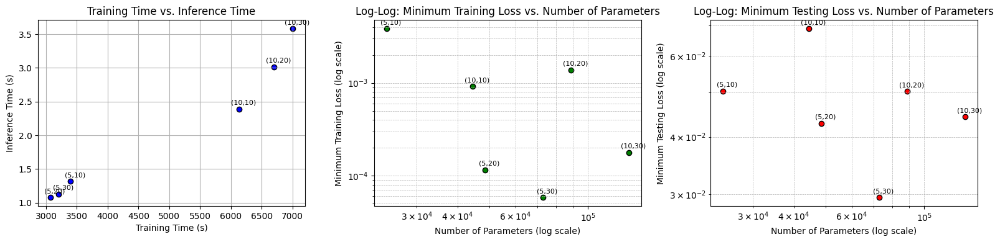

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import json
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

metrics_file = os.path.join(source_dir, "schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
min_test_losses = [min(metrics["test_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
grid = [metrics["grid"] for metrics in filtered_metrics]  # Number of modes (M)
nodes = [metrics["nodes"] for metrics in filtered_metrics]  # Width (W)

# Plot 1: Training Time vs. Inference Time
plt.figure(figsize=(16, 4))

# Training Time vs. Inference Time
plt.subplot(1, 3, 1)
plt.scatter(training_times, inference_times, color="blue", edgecolor="black")
plt.xlabel("Training Time (s)")
plt.ylabel("Inference Time (s)")
plt.title("Training Time vs. Inference Time")
plt.grid(True)

# Add annotations for modes (M) and widths (W)
for i in range(len(training_times)):
    plt.annotate(f"({grid[i]},{nodes[i]})",
                 (training_times[i], inference_times[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

# Plot 2: Log-Log Train Loss vs. Number of Parameters
plt.subplot(1, 3, 2)
plt.scatter(num_parameters, min_train_losses, color="green", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Training Loss (log scale)")
plt.title("Log-Log: Minimum Training Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for modes (M) and widths (W)
for i in range(len(num_parameters)):
    plt.annotate(f"({grid[i]},{nodes[i]})",
                 (num_parameters[i], min_train_losses[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)


# Plot 3: Log-Log Test Loss vs. Number of Parameters
plt.subplot(1, 3, 3)
plt.scatter(num_parameters, min_test_losses, color="red", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Testing Loss (log scale)")
plt.title("Log-Log: Minimum Testing Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for modes (M) and widths (W)
for i in range(len(num_parameters)):
    plt.annotate(f"({grid[i]},{nodes[i]})",
                 (num_parameters[i], min_test_losses[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

plt.tight_layout()

# Save the figure as a PDF
# pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/FNO_Maxwell_final_min_loss_scaling_plots.pdf"
# plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

# print(f"Figure saved as PDF at: {pdf_path}")


## Plotting the loss

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


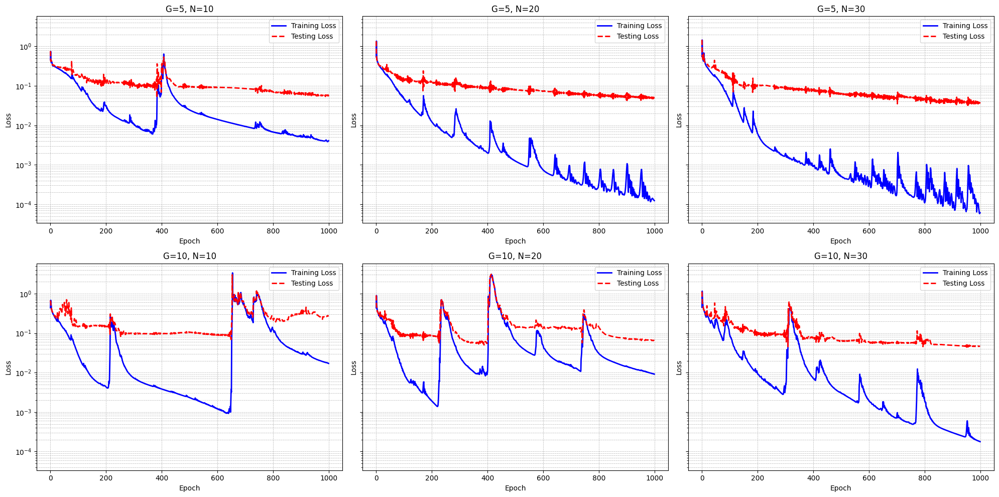

In [ ]:
import matplotlib.pyplot as plt
import json
import os
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

metrics_file = os.path.join(source_dir, "schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Determine the number of configurations
num_configs = len(filtered_metrics)

# Calculate rows and columns for subplots
cols = 3  # Set the number of columns
rows = math.ceil(num_configs / cols)  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), sharey=True)
axes = axes.flatten()  # Flatten for easy indexing

# Plot each configuration
for i, metrics in enumerate(filtered_metrics):
    grid = metrics["grid"]
    nodes = metrics["nodes"]
    train_loss_history = metrics["train_loss_history"]
    test_loss_history = metrics["test_loss_history"]

    # Plot training and testing loss in the respective subplot
    axes[i].plot(train_loss_history, label="Training Loss", color="blue", linewidth=2)
    axes[i].plot(test_loss_history, label="Testing Loss", color="red", linestyle="--", linewidth=2)

    # Configure subplot
    axes[i].set_yscale("log")
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].set_title(f"G={grid}, N={nodes}")
    axes[i].legend()
    axes[i].grid(True, which="both", linestyle="--", linewidth=0.5)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save the figure as a PDF
# pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/FNO_final_loss_plots.pdf"
# plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

## Final figures

### time plots

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


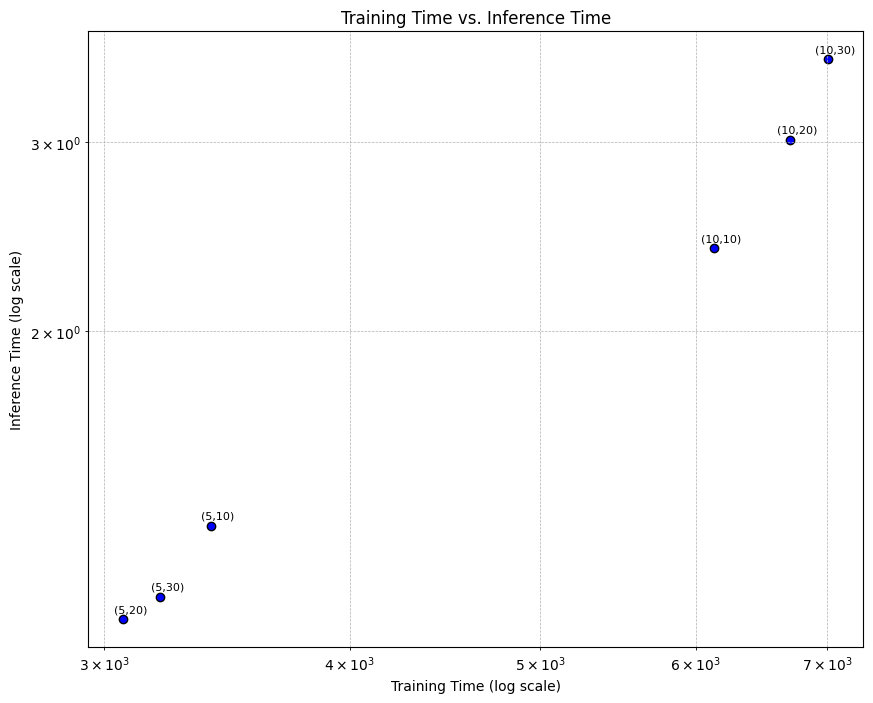

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Times.pdf


In [5]:
import matplotlib.pyplot as plt
import json
import numpy as np
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

metrics_file = os.path.join(source_dir, "schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
kan_grids = [metrics["grid"] for metrics in filtered_metrics]  # KANgrid values
kan_nodes = [metrics["nodes"] for metrics in filtered_metrics]  # KANnode values

# Plot 1: Training Time vs. Inference Time
plt.figure(figsize=(10, 8))

# Training Time vs. Inference Time (Log-Log)

plt.xscale("log")
plt.yscale("log")
plt.scatter(training_times, inference_times, color="blue", edgecolor="black")
plt.xlabel("Training Time (log scale)")
plt.ylabel("Inference Time (log scale)")
plt.title("Training Time vs. Inference Time")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for KANgrid and KANnode
for i in range(len(training_times)):
    plt.annotate(f"({kan_grids[i]},{kan_nodes[i]})",
                 (training_times[i], inference_times[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Times.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")


### scaling plot

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-9-89282852d0b3>:33: RuntimeWarning: overflow encountered in power
  return C * (x ** alpha)
<ipython-input-9-89282852d0b3>:52: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(


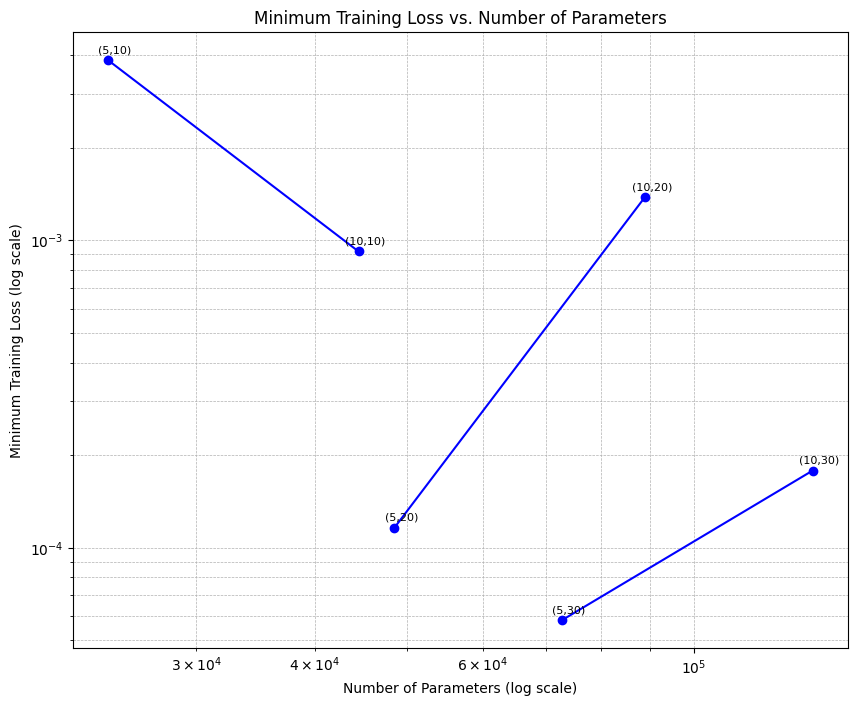

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Scaling.pdf


In [9]:
import matplotlib.pyplot as plt
import json
import numpy as np
from scipy.optimize import curve_fit
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

metrics_file = os.path.join(source_dir, "schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Extract data from metrics
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
kan_grids = [metrics["grid"] for metrics in filtered_metrics]  # KANgrid values
kan_nodes = [metrics["nodes"] for metrics in filtered_metrics]  # KANnode values

# Group data by unique KANnode values
unique_nodes = sorted(set(kan_nodes))
node_groups = {node: [] for node in unique_nodes}
for i, node in enumerate(kan_nodes):
    node_groups[node].append((num_parameters[i], min_train_losses[i], kan_grids[i], kan_nodes[i]))

# Define the scaling function
def scaling_law(x, C, alpha):
    return C * (x ** alpha)

# Plot Log-Log Loss vs. Number of Parameters with Scaling Laws
plt.figure(figsize=(10, 8))
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Training Loss (log scale)")
plt.title("Minimum Training Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Fit and plot scaling laws for each group
for node, points in node_groups.items():
    points = sorted(points)  # Sort points by number of parameters
    x, y, grids, nodes = zip(*points)
    x = np.array(x)
    y = np.array(y)

    # Fit scaling law
    params, _ = curve_fit(
        scaling_law, x, y, p0=[1e-8, -1], maxfev=10000
    )  # Initial guesses for [C, alpha]
    C, alpha = params

    # Plot points and connect them with lines
    plt.plot(x, y, linestyle="-", marker="o", color="blue", linewidth=1.5)

    # # Plot fitted scaling law
    # plt.plot(x, scaling_law(x, C, alpha), linestyle="--", color="red", linewidth=1.5)

    # # Annotate the scaling law
    # mid_x = np.median(x)
    # mid_y = scaling_law(mid_x, C, alpha)
    # plt.text(1*mid_x, 1.25*mid_y, f"$N^{{{alpha:.2f}}}$", fontsize=10, ha="center", color="red")

    # Annotate points with (G, N)
    for xi, yi, grid, node in zip(x, y, grids, nodes):
        plt.annotate(f"({grid},{node})", (xi, yi), textcoords="offset points", xytext=(5, 5), ha="center", fontsize=8)



# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Scaling.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

### Loss curve

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


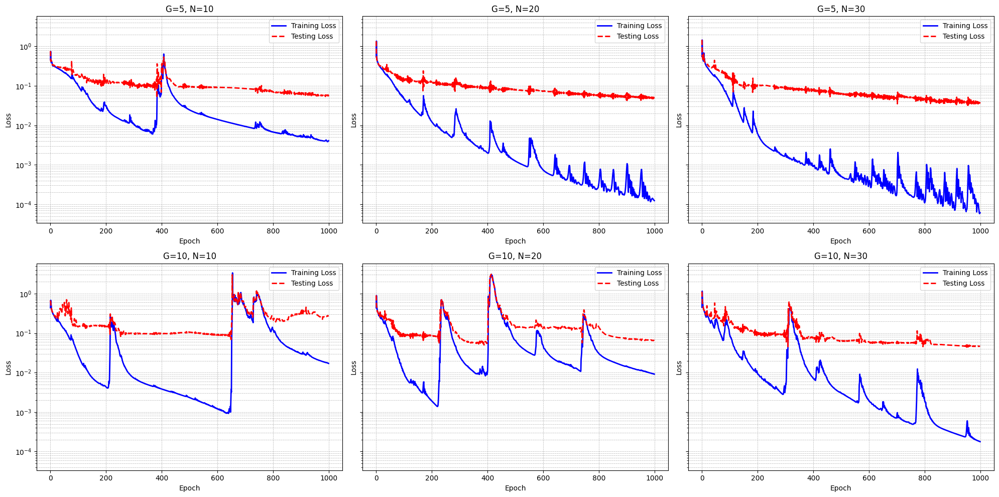

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Loss.pdf


In [7]:
import matplotlib.pyplot as plt
import json
import math
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Load metrics from the JSON file
source_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/'

metrics_file = os.path.join(source_dir, "schro_kanode_lr1e-2_epochs1e3_benchmark_metrics.json")
if os.path.exists(metrics_file):
    with open(metrics_file, "r") as f:
      filtered_metrics = json.load(f)

# Determine the number of configurations
num_configs = len(filtered_metrics)

# Calculate rows and columns for subplots
cols = 3  # Set the number of columns
rows = math.ceil(num_configs / cols)  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), sharey=True)
axes = axes.flatten()  # Flatten for easy indexing

# Plot each configuration
for i, metrics in enumerate(filtered_metrics):
    kan_grid = metrics["grid"]
    kan_node = metrics["nodes"]
    train_loss_history = metrics["train_loss_history"]
    test_loss_history = metrics["test_loss_history"]

    # Plot training and testing loss in the respective subplot
    axes[i].plot(train_loss_history, label="Training Loss", color="blue", linewidth=2)
    axes[i].plot(test_loss_history, label="Testing Loss", color="red", linestyle="--", linewidth=2)

    # Configure subplot
    axes[i].set_yscale("log")
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].set_title(f"G={kan_grid}, N={kan_node}")
    axes[i].legend()
    axes[i].grid(True, which="both", linestyle="--", linewidth=0.5)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Loss.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

## Field visualization

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
torch.Size([202])
torch.Size([500])
Model loaded successfully!


<ipython-input-48-eda281244069>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  kanode_visual.load_state_dict(torch.load(trained_model_path, map_location=torch.device('cpu

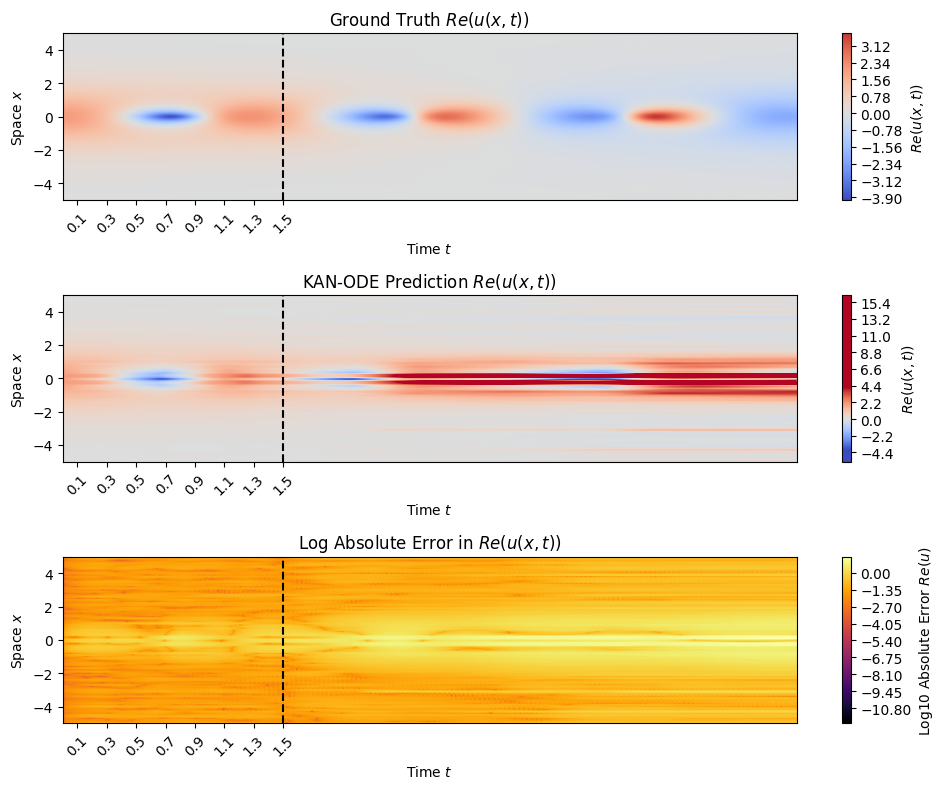

Plot saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_field_visual.pdf


In [48]:
# Mount Google Drive
from google.colab import drive
import os
import torch

drive.mount('/content/drive')

# Define the path to your trained model in Drive
trained_model_path = '/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/Trained_Models_Schrodinger/KANODE_final/kanode_model_grid_5_nodes_10.pth'

# Define the model parameters
KANgrid = 5
KANnode = 10
xgrid_len = 101  # Example value; replace with the actual spatial grid length
# Prepare initial conditions and time grid
y0_test = torch.tensor(np.hstack([u_real_sol.T[0], u_imag_sol.T[0]]), dtype=torch.float32)
print(y0_test.shape)
#y0_test = y0_test.unsqueeze(0)  # Add batch dimension
t_eval_test = torch.tensor(tgrid, dtype=torch.float32)
print(t_eval_test.shape)
# Load the trained model
kanode_visual = KANODE(len(y0_train) // 2, KANnode, KANgrid)  # Ensure the KANODE architecture matches
kanode_visual.load_state_dict(torch.load(trained_model_path, map_location=torch.device('cpu')))
kanode_visual.eval()  # Set the model to evaluation mode

print("Model loaded successfully!")

# Evaluate the model
with torch.no_grad():
    pred_output = odeint(kanode_visual, y0_test, t_eval_test)
    pred_output = pred_output.squeeze(1).numpy()

# Extract predicted fields
pred_u_real = pred_output[:, :xgrid_len]
pred_u_imag = pred_output[:, xgrid_len:]

u_real_abs_error = np.abs(u_real_sol.T - pred_u_real)
log_u_real_abs_error = np.log10(np.clip(u_real_abs_error, a_min=1e-12, a_max=None))  # Avoid log(0) by clipping

# File path for saving the PDF
output_pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_field_visual.pdf"





# # Plotting results in a single column
# plt.figure(figsize=(10, 8))

# # Define vmin and vmax based on the ground truth
# vmin = Ey_sol.min()
# vmax = Ey_sol.max()

# # Ground Truth E_y (Contour Plot)
# plt.subplot(3, 1, 1)
# contour_Ey_truth = plt.contourf(tgrid, xgrid, Ey_sol, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
# plt.colorbar(contour_Ey_truth, label='$E_y(t,x)$')
# plt.title('Ground Truth $E_y(t,x)$')
# plt.xlabel('Time $t$')
# plt.ylabel('Space $x$')
# plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
# plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# # Predicted E_y (Contour Plot)
# plt.subplot(3, 1, 2)
# contour_pred_Ey = plt.contourf(tgrid, xgrid, pred_Ey.T, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
# plt.colorbar(contour_pred_Ey, label='$E_y(t,x)$')
# plt.title('KANODE Prediction $E_y(t,x)$')
# plt.xlabel('Time $t$')
# plt.ylabel('Space $x$')
# plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
# plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# # Log Absolute Error E_y (Contour Plot)
# plt.subplot(3, 1, 3)
# contour_log_error = plt.contourf(tgrid, xgrid, log_Ey_abs_error.T, levels=500, cmap='inferno')
# plt.colorbar(contour_log_error, label='Log10 Absolute Error $E_y$')
# plt.title('Log Absolute Error in $E_y(t,x)$')
# plt.xlabel('Time $t$')
# plt.ylabel('Space $x$')
# plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
# plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# plt.tight_layout()

# tgrid = tgrid[:-1]

# Plotting results in one column
plt.figure(figsize=(10, 8))

# Ground Truth E_y (Contour Plot)
plt.subplot(3, 1, 1)
contour_Ey = plt.contourf(tgrid, xgrid, u_real_sol, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
plt.colorbar(contour_Ey, label='$Re(u(x,t))$')
plt.title('Ground Truth $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# Predicted E_y (Contour Plot)
plt.subplot(3, 1, 2)
contour_pred_Ey = plt.contourf(tgrid, xgrid, pred_u_real.T, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
plt.colorbar(contour_pred_Ey, label='$Re(u(x,t))$')
plt.title('KAN-ODE Prediction $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# Log Absolute Error E_y (Contour Plot)
plt.subplot(3, 1, 3)
log_u_real_abs_error = np.log10(np.clip(u_real_abs_error, a_min=1e-12, a_max=None))  # Clip to avoid log of 0
contour_log_Ey = plt.contourf(tgrid, xgrid, log_u_real_abs_error.T, levels=500, cmap='inferno')
plt.colorbar(contour_log_Ey, label='Log10 Absolute Error $Re(u)$')
plt.title('Log Absolute Error in $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

plt.tight_layout()

# Save the figure as a PDF
plt.savefig(output_pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Plot saved as PDF at: {output_pdf_path}")

In [47]:
# Parameters
xspan = (-5.0, 5.0)
# tspan = (0.0, np.pi / 2)
tspan = (0.0, 5.0)
# dx = 0.05
dx = 0.1
dt = 0.01
xgrid = np.arange(xspan[0], xspan[1] + dx, dx)
# tgrid = np.arange(tspan[0] + dt, tspan[1] - dt + dt, dt)  # Avoiding tspan endpoints
tgrid = np.arange(tspan[0], tspan[1], dt)  # Avoiding tspan endpoints


## Testing

### creating testing dataset

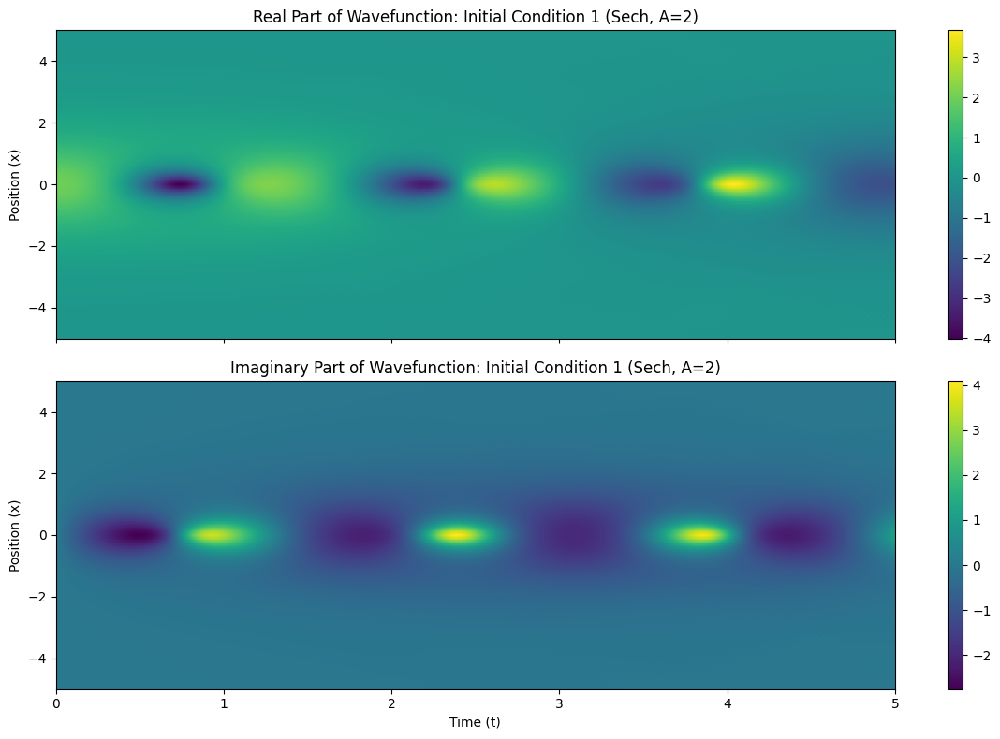

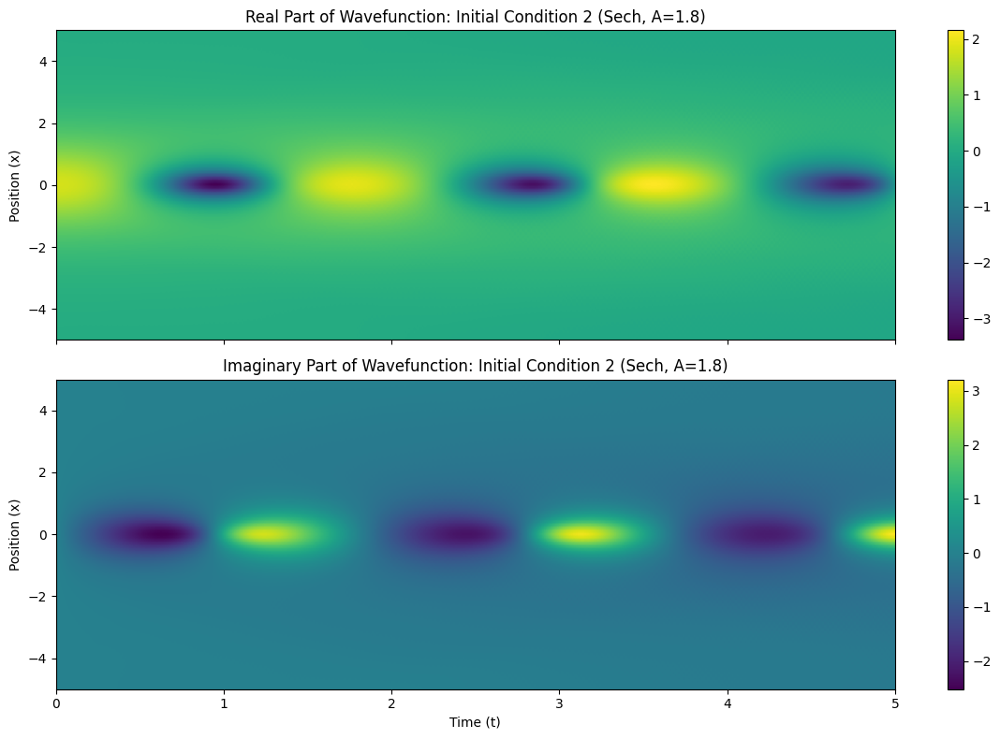

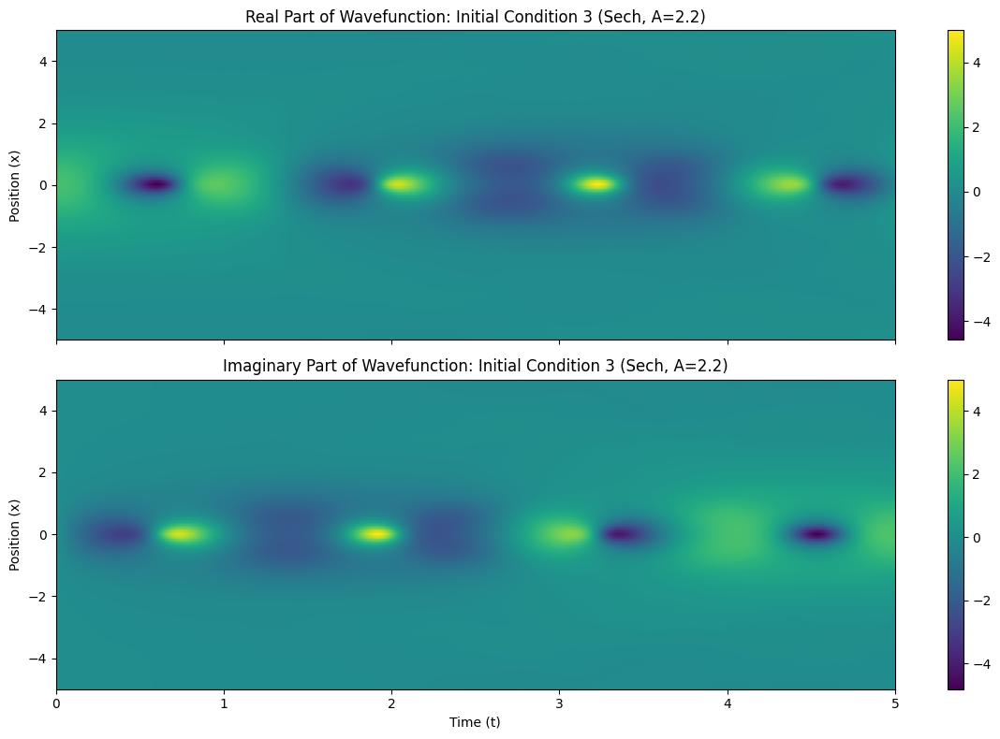

In [23]:
import numpy as np
import torch
from scipy.integrate import solve_ivp

# Parameters
xspan = (-5.0, 5.0)
tspan = (0.0, 5.0)
dx = 0.1
dt = 0.01
xgrid = np.arange(xspan[0], xspan[1] + dx, dx)
tgrid = np.arange(tspan[0], tspan[1] + dt, dt)

# Initial conditions
def sech(x, A):
    return A / np.cosh(x)

# def gaussian(x, x0=0.0, sigma=1.0):
#     return np.exp(-((x - x0) ** 2) / (2 * sigma ** 2))

u_real_init1 = sech(xgrid, A = 2)
u_imag_init1 = np.zeros_like(xgrid)

u_real_init2 = sech(xgrid, A = 1.8)
u_imag_init2 = np.zeros_like(xgrid)

u_real_init3 = sech(xgrid, A = 2.2)
u_imag_init3 = np.zeros_like(xgrid)

# Discretization
def schrodinger_rhs(t, y, dx, N):
    u_real = y[:N]
    u_imag = y[N:]
    d2u_real_dx2 = np.zeros_like(u_real)
    d2u_imag_dx2 = np.zeros_like(u_imag)

    # Second derivative using finite differences (Neumann boundary conditions)
    for i in range(1, N-1):
        d2u_real_dx2[i] = (u_real[i-1] - 2 * u_real[i] + u_real[i+1]) / dx**2
        d2u_imag_dx2[i] = (u_imag[i-1] - 2 * u_imag[i] + u_imag[i+1]) / dx**2

    # Periodic boundary conditions
    d2u_real_dx2[0] = (u_real[-1] - 2 * u_real[0] + u_real[1]) / dx**2
    d2u_real_dx2[-1] = (u_real[-2] - 2 * u_real[-1] + u_real[0]) / dx**2

    d2u_imag_dx2[0] = (u_imag[-1] - 2 * u_imag[0] + u_imag[1]) / dx**2
    d2u_imag_dx2[-1] = (u_imag[-2] - 2 * u_imag[-1] + u_imag[0]) / dx**2

    # RHS of the Schrödinger equation
    du_real_dt = 0.5 * d2u_imag_dx2 + (u_real**2 + u_imag**2) * u_imag
    du_imag_dt = -0.5 * d2u_real_dx2 - (u_real**2 + u_imag**2) * u_real

    return np.concatenate([du_real_dt, du_imag_dt])

# Solve the PDE for different initial conditions
N = len(xgrid)

y0_1 = np.concatenate([u_real_init1, u_imag_init1])
sol1 = solve_ivp(schrodinger_rhs, tspan, y0_1, method='RK45', t_eval=tgrid, args=(dx, N))

y0_2 = np.concatenate([u_real_init2, u_imag_init2])
sol2 = solve_ivp(schrodinger_rhs, tspan, y0_2, method='RK45', t_eval=tgrid, args=(dx, N))

y0_3 = np.concatenate([u_real_init3, u_imag_init3])
sol3 = solve_ivp(schrodinger_rhs, tspan, y0_3, method='RK45', t_eval=tgrid, args=(dx, N))

# Extract solutions
u_real_sol1 = sol1.y[:N, :]
u_imag_sol1 = sol1.y[N:, :]

u_real_sol2 = sol2.y[:N, :]
u_imag_sol2 = sol2.y[N:, :]

u_real_sol3 = sol3.y[:N, :]
u_imag_sol3 = sol3.y[N:, :]

# Extract training data
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]

u_real_train = np.array([u_real_sol1[:, idx] for idx in idx_])
u_imag_train = np.array([u_imag_sol1[:, idx] for idx in idx_])
time_steps = np.array(dt_train)

# Prepare training data
spatial_grid = np.repeat(xgrid.reshape(1, -1), len(time_steps), axis=0)
temporal_grid = np.repeat(time_steps.reshape(-1, 1), len(xgrid), axis=1)

input_data = np.stack([spatial_grid, temporal_grid, u_real_train], axis=-1)
output_data = np.stack([u_real_train, u_imag_train], axis=-1)

# Convert to PyTorch tensors
input_tensor = torch.tensor(input_data, dtype=torch.float32)
output_tensor = torch.tensor(output_data, dtype=torch.float32)

# Define test time grids
dt_testA = np.arange(0, 1.6, 0.2)
dt_testB = np.arange(1.6, 3.2, 0.2)

# Extract test data
u_real_testA = np.array([u_real_sol1[:, int(t / dt)] for t in dt_testA])
u_imag_testA = np.array([u_imag_sol1[:, int(t / dt)] for t in dt_testA])

u_real_testB = np.array([u_real_sol1[:, int(t / dt)] for t in dt_testB])
u_imag_testB = np.array([u_imag_sol1[:, int(t / dt)] for t in dt_testB])

u_real_testC = np.array([u_real_sol2[:, int(t / dt)] for t in dt_train])
u_imag_testC = np.array([u_imag_sol2[:, int(t / dt)] for t in dt_train])

u_real_testD = np.array([u_real_sol3[:, int(t / dt)] for t in dt_train])
u_imag_testD = np.array([u_imag_sol3[:, int(t / dt)] for t in dt_train])



# Combine Ey and Hz into the initial conditions
xgrid_len = len(xgrid)
y0_train = torch.tensor(np.hstack([u_real_train[0], u_imag_train[0]]), dtype=torch.float32)

# Prepare Ground Truth for Training
ground_truth_train = np.hstack([u_real_train, u_imag_train])
ground_truth_tensor_train = torch.tensor(ground_truth_train, dtype=torch.float32)

# Prepare Testing Data
ground_truth_testA = np.hstack([u_real_testA, u_imag_testA])
ground_truth_tensor_testA = torch.tensor(ground_truth_testA, dtype=torch.float32)

ground_truth_testB = np.hstack([u_real_testB, u_imag_testB])
ground_truth_tensor_testB = torch.tensor(ground_truth_testB, dtype=torch.float32)

ground_truth_testC = np.hstack([u_real_testC, u_imag_testC])
ground_truth_tensor_testC = torch.tensor(ground_truth_testC, dtype=torch.float32)

ground_truth_testD = np.hstack([u_real_testD, u_imag_testD])
ground_truth_tensor_testD = torch.tensor(ground_truth_testD, dtype=torch.float32)

# Initial conditions for testing
y0_testA = torch.tensor(np.hstack([u_real_testA[0], u_imag_testA[0]]), dtype=torch.float32)  # Initial state for testing
y0_testB = torch.tensor(np.hstack([u_real_testB[0], u_imag_testB[0]]), dtype=torch.float32)
y0_testC = torch.tensor(np.hstack([u_real_testC[0], u_imag_testC[0]]), dtype=torch.float32)
y0_testD = torch.tensor(np.hstack([u_real_testD[0], u_imag_testD[0]]), dtype=torch.float32)

# Time points for training evaluation
t_eval_train = torch.tensor(dt_train, dtype=torch.float32)  # Training time points

# Time points for testing evaluation
t_eval_testA = torch.tensor(dt_testA, dtype=torch.float32)  # Testing time points
t_eval_testB = torch.tensor(dt_testB, dtype=torch.float32)  # Testing time points
t_eval_testC = torch.tensor(dt_train, dtype=torch.float32)  # Testing time points
t_eval_testD = torch.tensor(dt_train, dtype=torch.float32)  # Testing time points





import matplotlib.pyplot as plt

# Function to plot the wavefunction evolution
def plot_wavefunction(xgrid, tgrid, u_real_sol, u_imag_sol, title="Wavefunction Evolution"):
    fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # Plot real part
    im1 = ax[0].imshow(
        u_real_sol, aspect='auto', extent=[tgrid[0], tgrid[-1], xgrid[0], xgrid[-1]], origin='lower'
    )
    ax[0].set_title(f"Real Part of Wavefunction: {title}")
    ax[0].set_ylabel("Position (x)")
    plt.colorbar(im1, ax=ax[0])

    # Plot imaginary part
    im2 = ax[1].imshow(
        u_imag_sol, aspect='auto', extent=[tgrid[0], tgrid[-1], xgrid[0], xgrid[-1]], origin='lower'
    )
    ax[1].set_title(f"Imaginary Part of Wavefunction: {title}")
    ax[1].set_xlabel("Time (t)")
    ax[1].set_ylabel("Position (x)")
    plt.colorbar(im2, ax=ax[1])

    plt.tight_layout()
    plt.show()

# Function to plot snapshots at specific times
def plot_snapshots(xgrid, tgrid, u_real_sol, u_imag_sol, times, title="Snapshots"):
    fig, ax = plt.subplots(len(times), 1, figsize=(10, 6 * len(times)), sharex=True)

    if len(times) == 1:
        ax = [ax]  # Ensure ax is iterable if only one subplot is created

    for i, t in enumerate(times):
        idx = int(t / dt)  # Find the closest time index
        ax[i].plot(xgrid, u_real_sol[:, idx], label=f"Real part at t={t:.2f}")
        ax[i].plot(xgrid, u_imag_sol[:, idx], label=f"Imaginary part at t={t:.2f}")
        ax[i].set_title(f"Snapshot at t={t:.2f}")
        ax[i].set_xlabel("Position (x)")
        ax[i].set_ylabel("Wavefunction")
        ax[i].legend()

    plt.tight_layout()
    plt.show()

# Plot wavefunction evolution for each initial condition
plot_wavefunction(xgrid, tgrid, u_real_sol1, u_imag_sol1, title="Initial Condition 1 (Sech, A=2)")
plot_wavefunction(xgrid, tgrid, u_real_sol2, u_imag_sol2, title="Initial Condition 2 (Sech, A=1.8)")
plot_wavefunction(xgrid, tgrid, u_real_sol3, u_imag_sol3, title="Initial Condition 3 (Sech, A=2.2)")

# Plot snapshots at specific times for the first initial condition
snapshot_times = [0.1, 1.0, 2.5, 4.0]
# plot_snapshots(xgrid, tgrid, u_real_sol1, u_imag_sol1, snapshot_times, title="Snapshots for Initial Condition 1")


### training

In [25]:
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import json

# Function to count the number of model parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Function to train and benchmark the KANODE model
def kanode_testing(
    KANgrid, KANnode, lr, epochs, y0_train, ground_truth_tensor_train, y0_test, ground_truth_tensor_test, t_eval_train, t_eval_test, save_path="kanode_model.pth"
):
    # Instantiate the KANODE model
    kanode = KANODE(len(y0_train) // 2, KANnode, KANgrid)
    optimizer = torch.optim.Adam(kanode.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    # Count the number of model parameters
    num_parameters = count_parameters(kanode)

    # Initialize tracking variables
    start_time = time.time()
    train_loss_history = []
    test_loss_historyA = []
    test_loss_historyB = []
    test_loss_historyC = []
    # test_loss_historyD = []

    for epoch in range(epochs):
        # Training step
        optimizer.zero_grad()
        pred_train = odeint(kanode, y0_train, t_eval_train)
        pred_train = pred_train.view(len(t_eval_train), -1)
        train_loss = loss_fn(pred_train, ground_truth_tensor_train)
        train_loss.backward()
        optimizer.step()

        # Record training loss
        train_loss_history.append(train_loss.item())

        # Testing step
        with torch.no_grad():
            pred_testA = odeint(kanode, y0_test[0], t_eval_test[0])
            pred_testA = pred_testA.view(len(t_eval_test[0]), -1)
            test_lossA = loss_fn(pred_testA, ground_truth_tensor_test[0])
            test_loss_historyA.append(test_lossA.item())

            pred_testB = odeint(kanode, y0_test[1], t_eval_test[1])
            pred_testB = pred_testB.view(len(t_eval_test[1]), -1)
            test_lossB = loss_fn(pred_testB, ground_truth_tensor_test[1])
            test_loss_historyB.append(test_lossB.item())

            pred_testC = odeint(kanode, y0_test[2], t_eval_test[2])
            pred_testC = pred_testC.view(len(t_eval_test[2]), -1)
            test_lossC = loss_fn(pred_testC, ground_truth_tensor_test[2])
            test_loss_historyC.append(test_lossC.item())

            # pred_testD = odeint(kanode, y0_test[3], t_eval_test[3])
            # pred_testD = pred_testD.view(len(t_eval_test[3]), -1)
            # test_lossD = loss_fn(pred_testD, ground_truth_tensor_test[3])
            # test_loss_historyD.append(test_lossD.item())

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss A: {test_lossA.item()}, Testing Loss B: {test_lossB.item()}, Testing Loss C: {test_lossC.item()}")

    # Measure training time
    training_time = time.time() - start_time

    # Measure inference time
    kanode.eval()
    start_inference = time.time()
    with torch.no_grad():
        odeint(kanode, y0_testA, t_eval_testA)
    inference_time = time.time() - start_inference

    # Save the trained model
    torch.save(kanode.state_dict(), save_path)

    return {
        "KANgrid": KANgrid,
        "KANnode": KANnode,
        "lr": lr,
        "epochs": epochs,
        "training_time": training_time,
        "inference_time": inference_time,
        "final_train_loss": train_loss_history[-1],
        "final_test_loss": test_loss_historyA[-1],
        "num_parameters": num_parameters,
        "train_loss_history": train_loss_history,
        "test_loss_historyA": test_loss_historyA,
        "test_loss_historyB": test_loss_historyB,
        "test_loss_historyC": test_loss_historyC,
        # "test_loss_historyD": test_loss_historyD,
        "model_path": save_path,
    }


In [28]:
import os
import matplotlib.pyplot as plt
import json
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')


# Load existing metrics
if os.path.exists("schro_kanode_testing_metrics.json"):
    with open("schro_kanode_testing_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

# Training loop
lr = 1e-2
epochs = 1000

# Define range of KANgrid and KANnode
KANgrid_range = [5]
KANnode_range = [10]

for KANgrid in KANgrid_range:
    for KANnode in KANnode_range:
        print(f"Training model with KANgrid={KANgrid}, KANnode={KANnode}")
        save_path = f"schro_kanode_model_grid_{KANgrid}_node_{KANnode}.pth"
        metrics = kanode_testing(
            KANgrid=KANgrid,
            KANnode=KANnode,
            lr=lr,
            epochs=epochs,
            y0_train=y0_train,
            ground_truth_tensor_train=ground_truth_tensor_train,
            y0_test=[y0_testA,y0_testB,y0_testC,y0_testD],
            ground_truth_tensor_test=[ground_truth_tensor_testA,ground_truth_tensor_testB,ground_truth_tensor_testC,ground_truth_tensor_testD],
            t_eval_train=t_eval_train,
            t_eval_test=[t_eval_testA,t_eval_testB,t_eval_testC,t_eval_testD],
            save_path=save_path,
        )
        all_metrics.append(metrics)

        # Save metrics incrementally
        with open("schro_kanode_testing_metrics.json", "w") as f:
            json.dump(all_metrics, f, indent=4)

        print(f"Metrics for KANgrid={KANgrid}, KANnode={KANnode} saved.")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Training model with KANgrid=5, KANnode=10
Epoch 0, Training Loss: 0.5040895342826843, Testing Loss A: 0.7052785754203796, Testing Loss B: 0.7063284516334534, Testing Loss C: 0.8434227108955383
Epoch 100, Training Loss: 0.019965725019574165, Testing Loss A: 0.2243501842021942, Testing Loss B: 1.422753930091858, Testing Loss C: 0.23073852062225342
Epoch 200, Training Loss: 0.04429646208882332, Testing Loss A: 0.13999104499816895, Testing Loss B: 0.12746742367744446, Testing Loss C: 0.2500391900539398
Epoch 300, Training Loss: 0.0017898732330650091, Testing Loss A: 0.08210556954145432, Testing Loss B: 2.7259490489959717, Testing Loss C: 0.23293085396289825
Epoch 400, Training Loss: 0.0009119329042732716, Testing Loss A: 0.07495050877332687, Testing Loss B: 3.0146961212158203, Testing Loss C: 0.22979983687400818
Epoch 500, Training Loss: 0.0004571310128085315, Te

### plotting

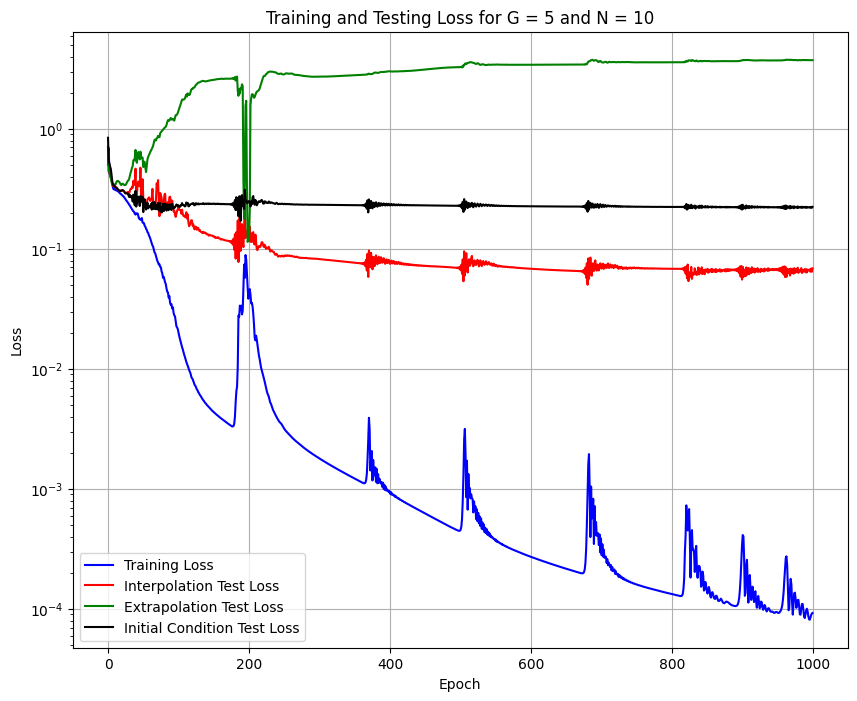

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Testing.pdf


In [31]:
# Plot training and testing loss for all configurations
plt.figure(figsize=(10, 8))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label="Training Loss",
        color = "blue"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyA"],
        label="Interpolation Test Loss",
        color = "red"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyB"],
        label="Extrapolation Test Loss",
        color = "green"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyC"],
        label="Initial Condition Test Loss",
        color="black"
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for G = 5 and N = 10")
plt.legend()
plt.grid(True)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_KANODE_MWL_Testing.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

# Neural ODE

## Neural ODE module

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torchdiffeq import odeint

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Neural ODE Dynamics Function
class NeuralODEFunc(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(NeuralODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim)
        )

    def forward(self, t, y):
        return self.net(y)

# Training and Evaluation Data Preparation (Reuse from KANODE)
# Prepare Training Data
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]
u_real_train = np.array([u_real_sol[:, idx] for idx in idx_])
u_imag_train = np.array([u_imag_sol[:, idx] for idx in idx_])
time_steps = np.array(dt_train)

# Combine Ey and Hz into the initial conditions
xgrid_len = len(xgrid)
y0_train = torch.tensor(np.hstack([u_real_train[0], u_imag_train[0]]), dtype=torch.float32).to(device)

# Prepare Ground Truth for Training
ground_truth_train = np.hstack([u_real_train, u_imag_train])
ground_truth_tensor_train = torch.tensor(ground_truth_train, dtype=torch.float32).to(device)

# Prepare Testing Data
dt_test = np.arange(0, 1.6, 0.2)
u_real_test = np.array([u_real_sol[:, int(t / dt)] for t in dt_test])
u_imag_test = np.array([u_imag_sol[:, int(t / dt)] for t in dt_test])
ground_truth_test = np.hstack([u_real_test, u_imag_test])
ground_truth_tensor_test = torch.tensor(ground_truth_test, dtype=torch.float32).to(device)

# Initial conditions for testing
y0_test = torch.tensor(np.hstack([u_real_test[0], u_imag_test[0]]), dtype=torch.float32).to(device)  # Initial state for testing

# Time points for training evaluation
t_eval_train = torch.tensor(dt_train, dtype=torch.float32).to(device)  # Training time points

# Time points for testing evaluation
t_eval_test = torch.tensor(dt_test, dtype=torch.float32).to(device)  # Testing time points

Using device: cuda


##Training for different hyperparameters

Training model with Hidden Dim=250
Epoch 0, Training Loss: 0.37801095843315125, Testing Loss: 0.37264829874038696
Epoch 100, Training Loss: 0.003468463895842433, Testing Loss: 0.00590292876586318
Epoch 200, Training Loss: 0.0001207349996548146, Testing Loss: 0.0011426123091951013
Epoch 300, Training Loss: 3.963680865126662e-05, Testing Loss: 0.0011479298118501902
Epoch 400, Training Loss: 1.8769620510283858e-05, Testing Loss: 0.001280980184674263
Epoch 500, Training Loss: 2.5240015020244755e-05, Testing Loss: 0.0015207160031422973
Epoch 600, Training Loss: 7.305105100385845e-06, Testing Loss: 0.0014308224199339747
Epoch 700, Training Loss: 1.1736246051441412e-05, Testing Loss: 0.0017363420920446515
Epoch 800, Training Loss: 3.739180556294741e-06, Testing Loss: 0.0016412282129749656
Epoch 900, Training Loss: 0.003258525626733899, Testing Loss: 0.01828606240451336
Metrics for Hidden Dim=250 saved.


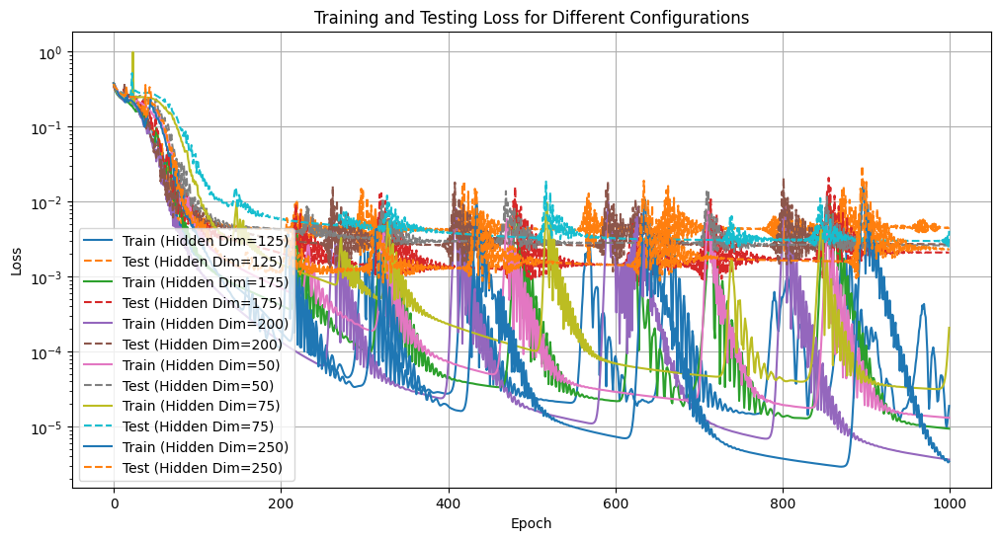

In [ ]:
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import json

# Function to count the number of model parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Function to train and benchmark the Neural ODE model
def train_and_benchmark_neural_ode_with_test(
    input_dim, hidden_dim, output_dim, lr, epochs, y0_train, ground_truth_tensor_train, y0_test, ground_truth_tensor_test, t_eval_train, t_eval_test, save_path="neural_ode_model.pth"
):
    # Instantiate the Neural ODE model
    neural_ode = NeuralODEFunc(input_dim, hidden_dim, output_dim).to(device)
    optimizer = torch.optim.Adam(neural_ode.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    # Count the number of model parameters
    num_parameters = count_parameters(neural_ode)

    # Initialize tracking variables
    start_time = time.time()
    train_loss_history = []
    test_loss_history = []

    for epoch in range(epochs):
        # Training step
        optimizer.zero_grad()
        pred_train = odeint(neural_ode, y0_train, t_eval_train)
        pred_train = pred_train.view(len(t_eval_train), -1)
        train_loss = loss_fn(pred_train, ground_truth_tensor_train)
        train_loss.backward()
        optimizer.step()

        # Record training loss
        train_loss_history.append(train_loss.item())

        # Testing step
        with torch.no_grad():
            pred_test = odeint(neural_ode, y0_test, t_eval_test)
            pred_test = pred_test.view(len(t_eval_test), -1)
            test_loss = loss_fn(pred_test, ground_truth_tensor_test)
            test_loss_history.append(test_loss.item())

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss: {test_loss.item()}")

    # Measure training time
    training_time = time.time() - start_time

    # Measure inference time
    neural_ode.eval()
    start_inference = time.time()
    with torch.no_grad():
        odeint(neural_ode, y0_test, t_eval_test)
    inference_time = time.time() - start_inference

    # Save the trained model
    torch.save(neural_ode.state_dict(), save_path)

    return {
        "input_dim": input_dim,
        "hidden_dim": hidden_dim,
        "output_dim": output_dim,
        "lr": lr,
        "epochs": epochs,
        "training_time": training_time,
        "inference_time": inference_time,
        "final_train_loss": train_loss_history[-1],
        "final_test_loss": test_loss_history[-1],
        "num_parameters": num_parameters,
        "train_loss_history": train_loss_history,
        "test_loss_history": test_loss_history,
        "model_path": save_path,
    }

# Load existing metrics
if os.path.exists("schro_neural_ode_benchmark_metrics.json"):
    with open("schro_neural_ode_benchmark_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

# Training loop
lr = 1e-2
epochs = 1000

# Define range of hidden_dim
hidden_dim_range =[250]   #[125, 175, 200] done

for hidden_dim in hidden_dim_range:
    print(f"Training model with Hidden Dim={hidden_dim}")
    save_path = f"schro_neural_ode_model_hidden_{hidden_dim}.pth"
    metrics = train_and_benchmark_neural_ode_with_test(
        input_dim=len(y0_train),
        hidden_dim=hidden_dim,
        output_dim=len(y0_train),
        lr=lr,
        epochs=epochs,
        y0_train=y0_train,
        ground_truth_tensor_train=ground_truth_tensor_train,
        y0_test=y0_test,
        ground_truth_tensor_test=ground_truth_tensor_test,
        t_eval_train=t_eval_train,
        t_eval_test=t_eval_test,
        save_path=save_path,
    )
    all_metrics.append(metrics)

    # Save metrics incrementally
    with open("schro_neural_ode_benchmark_metrics.json", "w") as f:
        json.dump(all_metrics, f, indent=4)

    print(f"Metrics for Hidden Dim={hidden_dim} saved.")

# Plot training and testing loss for all configurations
plt.figure(figsize=(12, 6))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label=f"Train (Hidden Dim={metrics['hidden_dim']})",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_history"],
        linestyle="--",
        label=f"Test (Hidden Dim={metrics['hidden_dim']})",
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for Different Configurations")
plt.legend()
plt.grid(True)
plt.show()


##Save all the trained models and metrics in Google Drive

In [ ]:
from google.colab import drive
import os
import shutil

# Mount Google Drive
drive.mount('/content/drive')

# Define the target directory in Google Drive
target_dir = '/content/drive/My Drive/PhD MIT/Deep Learning/Trained_Models_Schrodinger/Neural_ODE/'

# Ensure the target directory exists
os.makedirs(target_dir, exist_ok=True)

# Copy all saved models to the target directory
for metrics in all_metrics:
    model_path = metrics["model_path"]  # Get the saved model path from metrics
    if os.path.exists(model_path):  # Check if the model file exists
        shutil.copy(model_path, target_dir)
    else:
        print(f"Model file {model_path} not found!")

# Copy metrics file to the target directory
if os.path.exists("schro_neural_ode_benchmark_metrics.json"):
    shutil.copy("schro_neural_ode_benchmark_metrics.json", target_dir)
else:
    print("Metrics file not found!")

print(f"All Neural ODE models and metrics have been saved to: {target_dir}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
All Neural ODE models and metrics have been saved to: /content/drive/My Drive/PhD MIT/Deep Learning/Trained_Models_Schrodinger/Neural_ODE/


## Final figures

### time plots

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


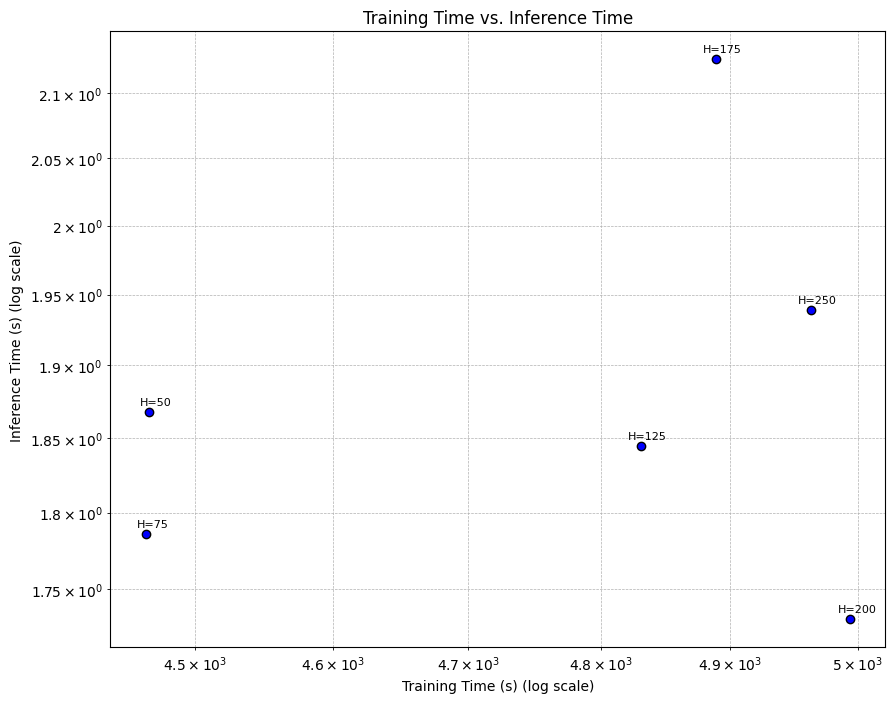

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_MWL_Times.pdf


In [12]:
import matplotlib.pyplot as plt
import numpy as np
import json
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your JSON file in Google Drive
file_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Trained_Models_Schrodinger/Neural_ODE/schro_neural_ode_benchmark_metrics.json"

# Load metrics from the JSON file
with open(file_path, "r") as f:
    filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
hidden_dims = [metrics["hidden_dim"] for metrics in filtered_metrics]  # Hidden dimensions


plt.figure(figsize=(10, 8))

# Training Time vs. Inference Time
plt.scatter(training_times, inference_times, color="blue", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Training Time (s) (log scale)")
plt.ylabel("Inference Time (s) (log scale)")
plt.title("Training Time vs. Inference Time")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Add annotations for hidden dimensions
for i in range(len(training_times)):
    plt.annotate(f"H={hidden_dims[i]}",
                 (training_times[i], inference_times[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_MWL_Times.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

### scaling plots

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-13-9e10970bd6bc>:26: RuntimeWarning: overflow encountered in power
  return C * (x ** alpha)


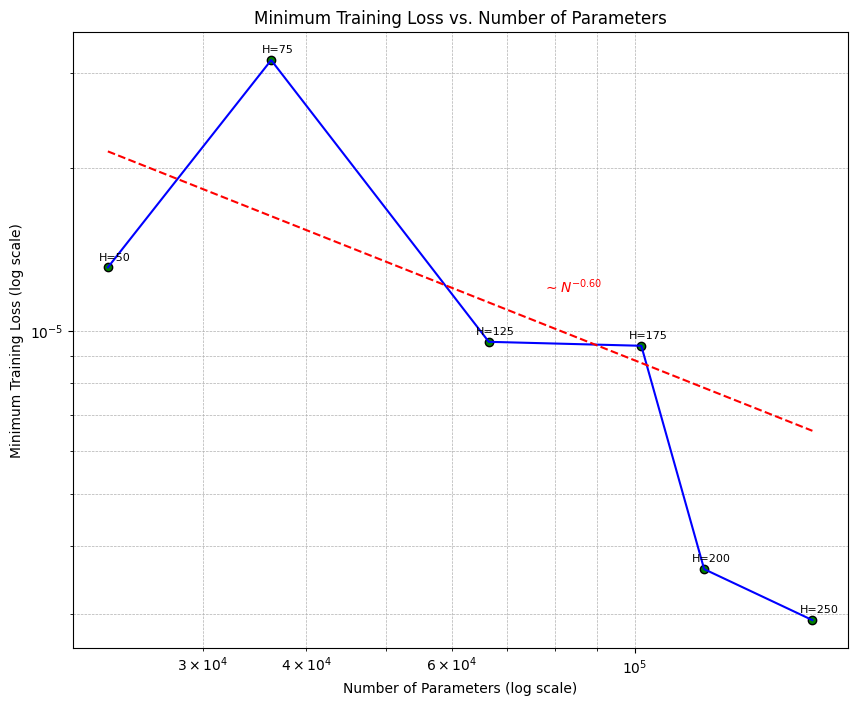

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_MWL_Scaling.pdf


In [13]:
import matplotlib.pyplot as plt
import numpy as np
import json
from scipy.optimize import curve_fit
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your JSON file in Google Drive
file_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Trained_Models_Schrodinger/Neural_ODE/schro_neural_ode_benchmark_metrics.json"

# Load metrics from the JSON file
with open(file_path, "r") as f:
    filtered_metrics = json.load(f)

# Extract data from metrics
training_times = [metrics["training_time"] for metrics in filtered_metrics]
inference_times = [metrics["inference_time"] for metrics in filtered_metrics]
min_train_losses = [min(metrics["train_loss_history"]) for metrics in filtered_metrics]  # Minimum training loss
num_parameters = [metrics["num_parameters"] for metrics in filtered_metrics]
hidden_dims = [metrics["hidden_dim"] for metrics in filtered_metrics]  # Hidden dimensions

# Define the scaling function
def scaling_law(x, C, alpha):
    return C * (x ** alpha)

plt.figure(figsize=(10, 8))

# Loss vs. Number of Parameters
plt.scatter(num_parameters, min_train_losses, color="green", edgecolor="black")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Number of Parameters (log scale)")
plt.ylabel("Minimum Training Loss (log scale)")
plt.title("Minimum Training Loss vs. Number of Parameters")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

# Join points with a piecewise blue line
sorted_indices = np.argsort(hidden_dims)
sorted_num_parameters = np.array(num_parameters)[sorted_indices]
sorted_min_train_losses = np.array(min_train_losses)[sorted_indices]
sorted_hidden_dims = np.array(hidden_dims)[sorted_indices]

plt.plot(sorted_num_parameters, sorted_min_train_losses, linestyle="-", color="blue", linewidth=1.5)

# Fit scaling law
params, _ = curve_fit(scaling_law, sorted_num_parameters, sorted_min_train_losses, p0=[1e-8, -1], maxfev=10000)
C, alpha = params

# Plot fitted scaling law
plt.plot(sorted_num_parameters, scaling_law(sorted_num_parameters, C, alpha), linestyle="--", color="red", linewidth=1.5)

# Annotate the scaling law
mid_x = np.median(sorted_num_parameters)
mid_y = scaling_law(mid_x, C, alpha)
plt.text(mid_x, 1.2*mid_y, f"$\\sim N^{{{alpha:.2f}}}$", fontsize=10, ha="center", color="red")

# Annotate points with "H="
for i in range(len(sorted_num_parameters)):
    plt.annotate(f"H={sorted_hidden_dims[i]}",
                 (sorted_num_parameters[i], sorted_min_train_losses[i]),
                 textcoords="offset points",
                 xytext=(5, 5),
                 ha="center", fontsize=8)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_MWL_Scaling.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")


### loss curves

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


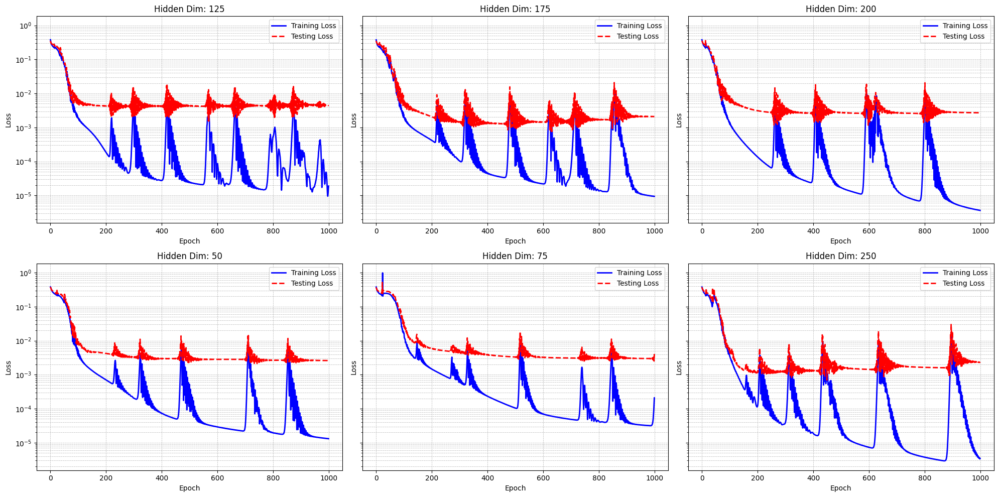

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_MWL_Loss.pdf


In [14]:
import matplotlib.pyplot as plt
import json
import math
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to your JSON file in Google Drive
file_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Trained_Models_Schrodinger/Neural_ODE/schro_neural_ode_benchmark_metrics.json"

# Load metrics from the JSON file
with open(file_path, "r") as f:
    filtered_metrics = json.load(f)

# Determine the number of configurations
num_configs = len(filtered_metrics)

# Calculate rows and columns for subplots
cols = 3  # Set the number of columns
rows = math.ceil(num_configs / cols)  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), sharey=True)
axes = axes.flatten()  # Flatten for easy indexing

# Plot each configuration
for i, metrics in enumerate(filtered_metrics):
    hidden_dim = metrics["hidden_dim"]
    train_loss_history = metrics["train_loss_history"]
    test_loss_history = metrics["test_loss_history"]

    # Plot training and testing loss in the respective subplot
    axes[i].plot(train_loss_history, label="Training Loss", color="blue", linewidth=2)
    axes[i].plot(test_loss_history, label="Testing Loss", color="red", linestyle="--", linewidth=2)

    # Configure subplot
    axes[i].set_yscale("log")
    axes[i].set_xlabel("Epoch")
    axes[i].set_ylabel("Loss")
    axes[i].set_title(f"Hidden Dim: {hidden_dim}")
    axes[i].legend()
    axes[i].grid(True, which="both", linestyle="--", linewidth=0.5)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_MWL_Loss.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

## Neural ODE visualization

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model loaded successfully!


<ipython-input-55-e498fb3d02a9>:39: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  neural_ode.load_state_dict(torch.load(trained_model_path, map_location=torch.device('cpu'))

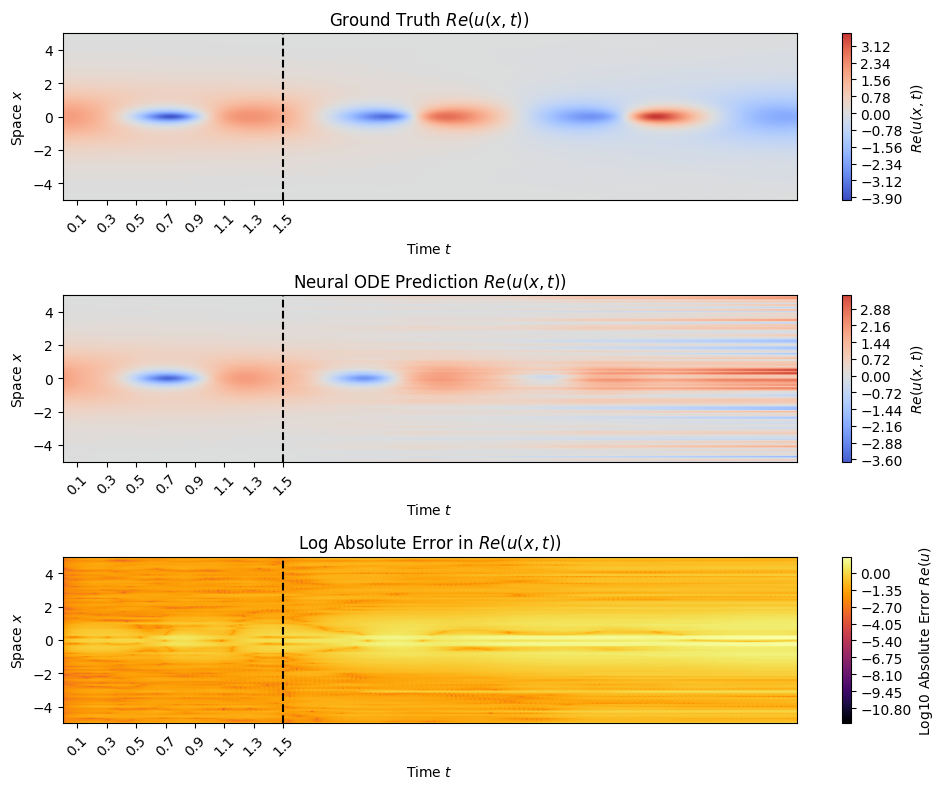

Plot saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_field_visual.pdf


In [55]:
# Mount Google Drive
from google.colab import drive
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchdiffeq import odeint

# Neural ODE Dynamics Function
class NeuralODEFunc(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(NeuralODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim)
        )

    def forward(self, t, y):
        return self.net(y)

drive.mount('/content/drive')

# Define the path to your trained model in Drive
trained_model_path = '/content/drive/My Drive/PhD MIT/Deep Learning/Trained_Models_Schrodinger/Neural_ODE/schro_neural_ode_model_hidden_75.pth'

# Define the model parameters
hidden_dim = 75  # Replace with the hidden dimension of your Neural ODE
xgrid_len = 101  # Example value; replace with the actual spatial grid length

# Prepare initial conditions and time grid
y0_test = torch.tensor(np.hstack([u_real_sol.T[0], u_imag_sol.T[0]]), dtype=torch.float32)
t_eval_test = torch.tensor(tgrid, dtype=torch.float32)

# Load the trained model
neural_ode = NeuralODEFunc(input_dim=2 * xgrid_len, hidden_dim=hidden_dim, output_dim = len(y0_train))
neural_ode.load_state_dict(torch.load(trained_model_path, map_location=torch.device('cpu')))
neural_ode.eval()  # Set the model to evaluation mode

print("Model loaded successfully!")

# Evaluate the model
with torch.no_grad():
    pred_output = odeint(neural_ode, y0_test, t_eval_test)
    pred_output = pred_output.numpy()

pred_u_real = pred_output[:, :xgrid_len]  # Predicted E_y
pred_u_imag = pred_output[:, xgrid_len:]

Ey_abs_error = np.abs(u_real_sol.T - pred_u_real)
log_u_real_abs_error = np.log10(np.clip(Ey_abs_error, a_min=1e-12, a_max=None))  # Avoid log(0) by clipping

# File path for saving the PDF
output_pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_Neural_ODE_field_visual.pdf"

# Plotting results in one column
plt.figure(figsize=(10, 8))

# Ground Truth E_y (Contour Plot)
plt.subplot(3, 1, 1)
contour_Ey = plt.contourf(tgrid, xgrid, u_real_sol, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
plt.colorbar(contour_Ey, label='$Re(u(x,t))$')
plt.title('Ground Truth $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# Predicted E_y (Contour Plot)
plt.subplot(3, 1, 2)
contour_pred_Ey = plt.contourf(tgrid, xgrid, pred_u_real.T, levels=500, cmap='coolwarm', vmin=vmin, vmax=vmax)
plt.colorbar(contour_pred_Ey, label='$Re(u(x,t))$')
plt.title('Neural ODE Prediction $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

# Log Absolute Error E_y (Contour Plot)
plt.subplot(3, 1, 3)
log_u_real_abs_error = np.log10(np.clip(u_real_abs_error, a_min=1e-12, a_max=None))  # Clip to avoid log of 0
contour_log_Ey = plt.contourf(tgrid, xgrid, log_u_real_abs_error.T, levels=500, cmap='inferno')
plt.colorbar(contour_log_Ey, label='Log10 Absolute Error $Re(u)$')
plt.title('Log Absolute Error in $Re(u(x,t))$')
plt.xlabel('Time $t$')
plt.ylabel('Space $x$')
plt.xticks(dt_train, labels=[f"{t:.1f}" for t in dt_train], rotation=45)  # Tick marks at training steps
plt.axvline(x=last_training_time, color="black", linestyle="--", label="Last Training Time")  # Vertical line

plt.tight_layout()
# Save the figure as a PDF
plt.savefig(output_pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Plot saved as PDF at: {output_pdf_path}")


In [54]:
# Parameters
xspan = (-5.0, 5.0)
# tspan = (0.0, np.pi / 2)
tspan = (0.0, 5.0)
# dx = 0.05
dx = 0.1
dt = 0.01
xgrid = np.arange(xspan[0], xspan[1] + dx, dx)
# tgrid = np.arange(tspan[0] + dt, tspan[1] - dt + dt, dt)  # Avoiding tspan endpoints
tgrid = np.arange(tspan[0], tspan[1], dt)  # Avoiding tspan endpoints

## Testing

### testing dataset

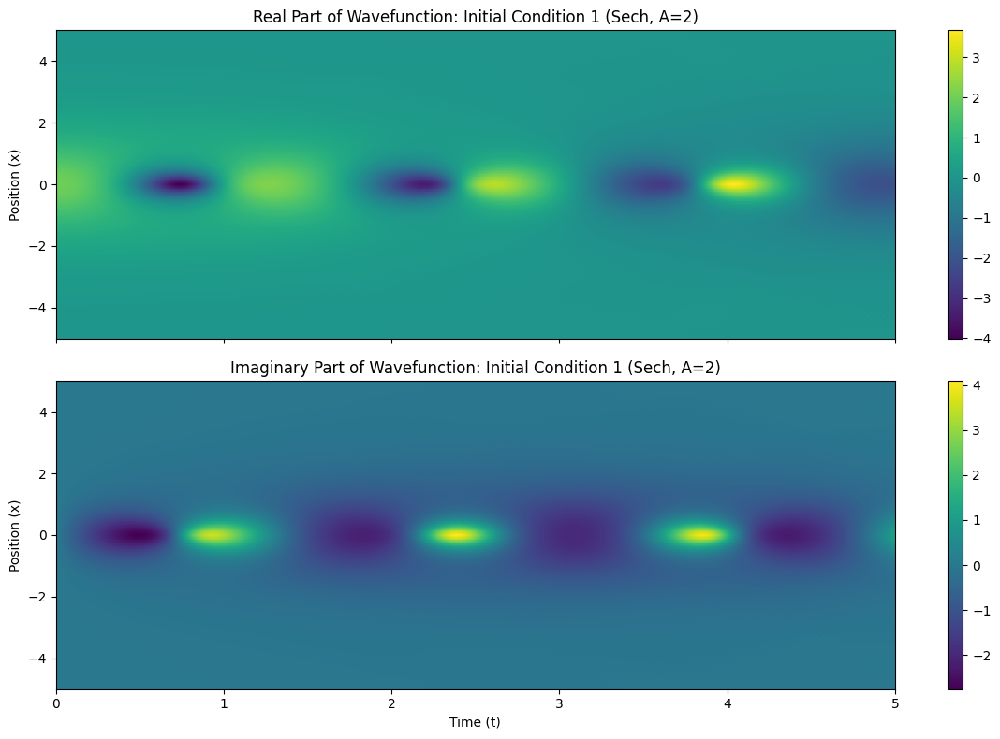

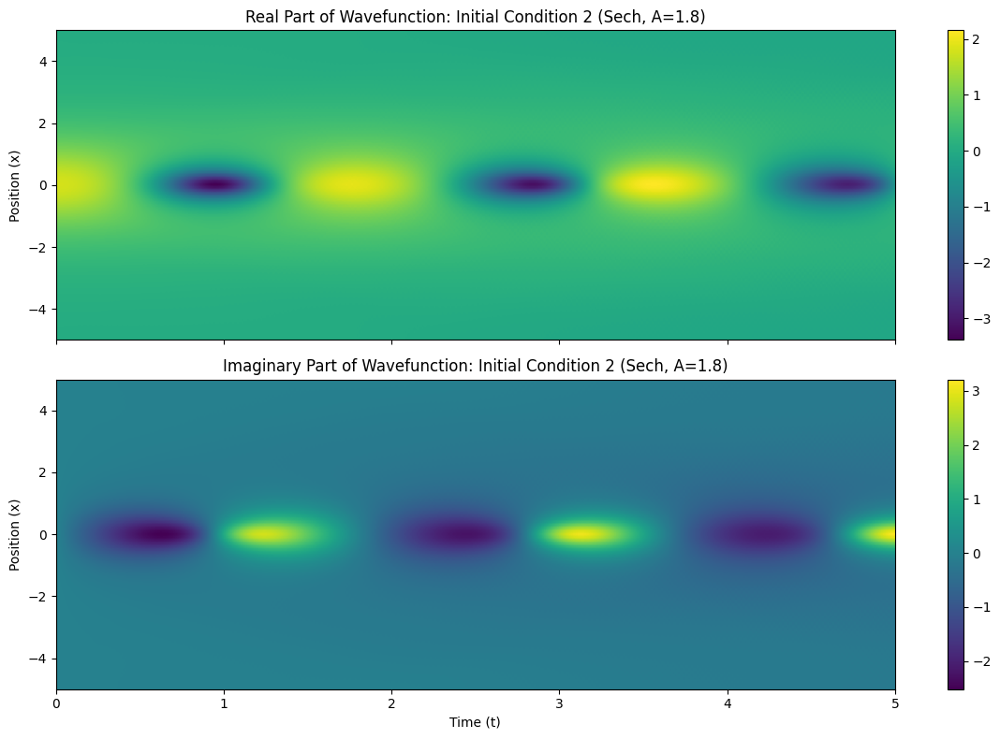

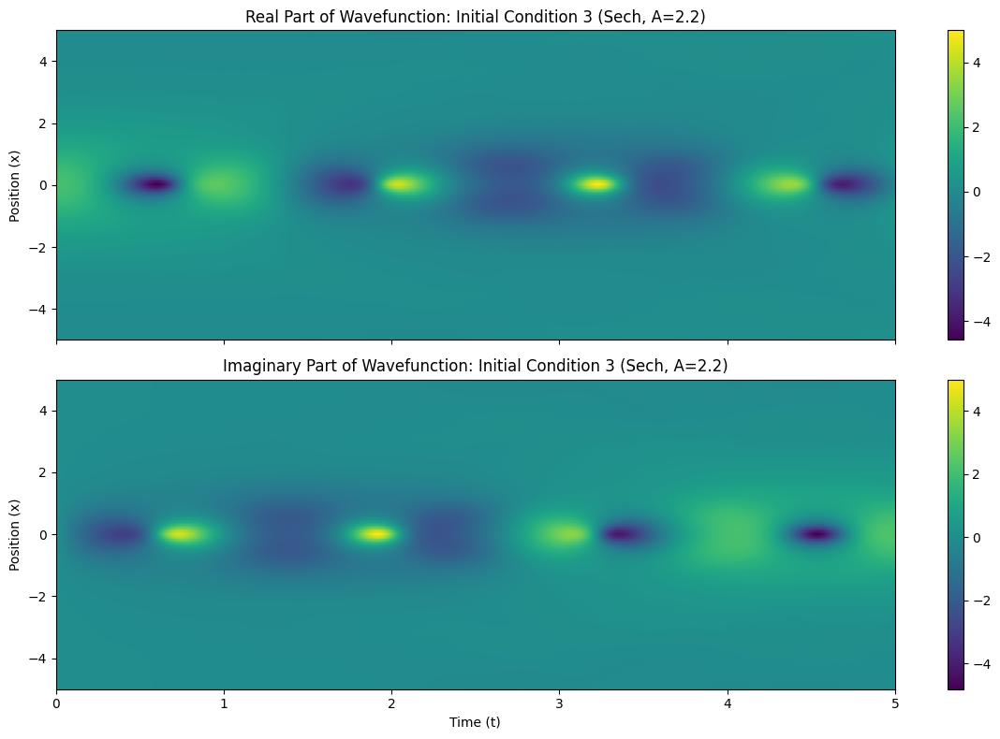

In [56]:
import numpy as np
import torch
from scipy.integrate import solve_ivp

# Parameters
xspan = (-5.0, 5.0)
tspan = (0.0, 5.0)
dx = 0.1
dt = 0.01
xgrid = np.arange(xspan[0], xspan[1] + dx, dx)
tgrid = np.arange(tspan[0], tspan[1] + dt, dt)

# Initial conditions
def sech(x, A):
    return A / np.cosh(x)

# def gaussian(x, x0=0.0, sigma=1.0):
#     return np.exp(-((x - x0) ** 2) / (2 * sigma ** 2))

u_real_init1 = sech(xgrid, A = 2)
u_imag_init1 = np.zeros_like(xgrid)

u_real_init2 = sech(xgrid, A = 1.8)
u_imag_init2 = np.zeros_like(xgrid)

u_real_init3 = sech(xgrid, A = 2.2)
u_imag_init3 = np.zeros_like(xgrid)

# Discretization
def schrodinger_rhs(t, y, dx, N):
    u_real = y[:N]
    u_imag = y[N:]
    d2u_real_dx2 = np.zeros_like(u_real)
    d2u_imag_dx2 = np.zeros_like(u_imag)

    # Second derivative using finite differences (Neumann boundary conditions)
    for i in range(1, N-1):
        d2u_real_dx2[i] = (u_real[i-1] - 2 * u_real[i] + u_real[i+1]) / dx**2
        d2u_imag_dx2[i] = (u_imag[i-1] - 2 * u_imag[i] + u_imag[i+1]) / dx**2

    # Periodic boundary conditions
    d2u_real_dx2[0] = (u_real[-1] - 2 * u_real[0] + u_real[1]) / dx**2
    d2u_real_dx2[-1] = (u_real[-2] - 2 * u_real[-1] + u_real[0]) / dx**2

    d2u_imag_dx2[0] = (u_imag[-1] - 2 * u_imag[0] + u_imag[1]) / dx**2
    d2u_imag_dx2[-1] = (u_imag[-2] - 2 * u_imag[-1] + u_imag[0]) / dx**2

    # RHS of the Schrödinger equation
    du_real_dt = 0.5 * d2u_imag_dx2 + (u_real**2 + u_imag**2) * u_imag
    du_imag_dt = -0.5 * d2u_real_dx2 - (u_real**2 + u_imag**2) * u_real

    return np.concatenate([du_real_dt, du_imag_dt])

# Solve the PDE for different initial conditions
N = len(xgrid)

y0_1 = np.concatenate([u_real_init1, u_imag_init1])
sol1 = solve_ivp(schrodinger_rhs, tspan, y0_1, method='RK45', t_eval=tgrid, args=(dx, N))

y0_2 = np.concatenate([u_real_init2, u_imag_init2])
sol2 = solve_ivp(schrodinger_rhs, tspan, y0_2, method='RK45', t_eval=tgrid, args=(dx, N))

y0_3 = np.concatenate([u_real_init3, u_imag_init3])
sol3 = solve_ivp(schrodinger_rhs, tspan, y0_3, method='RK45', t_eval=tgrid, args=(dx, N))

# Extract solutions
u_real_sol1 = sol1.y[:N, :]
u_imag_sol1 = sol1.y[N:, :]

u_real_sol2 = sol2.y[:N, :]
u_imag_sol2 = sol2.y[N:, :]

u_real_sol3 = sol3.y[:N, :]
u_imag_sol3 = sol3.y[N:, :]

# Extract training data
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]

u_real_train = np.array([u_real_sol1[:, idx] for idx in idx_])
u_imag_train = np.array([u_imag_sol1[:, idx] for idx in idx_])
time_steps = np.array(dt_train)

# Prepare training data
spatial_grid = np.repeat(xgrid.reshape(1, -1), len(time_steps), axis=0)
temporal_grid = np.repeat(time_steps.reshape(-1, 1), len(xgrid), axis=1)

input_data = np.stack([spatial_grid, temporal_grid, u_real_train], axis=-1)
output_data = np.stack([u_real_train, u_imag_train], axis=-1)

# Convert to PyTorch tensors
input_tensor = torch.tensor(input_data, dtype=torch.float32)
output_tensor = torch.tensor(output_data, dtype=torch.float32)

# Define test time grids
dt_testA = np.arange(0, 1.6, 0.2)
dt_testB = np.arange(1.6, 3.2, 0.2)

# Extract test data
u_real_testA = np.array([u_real_sol1[:, int(t / dt)] for t in dt_testA])
u_imag_testA = np.array([u_imag_sol1[:, int(t / dt)] for t in dt_testA])

u_real_testB = np.array([u_real_sol1[:, int(t / dt)] for t in dt_testB])
u_imag_testB = np.array([u_imag_sol1[:, int(t / dt)] for t in dt_testB])

u_real_testC = np.array([u_real_sol2[:, int(t / dt)] for t in dt_train])
u_imag_testC = np.array([u_imag_sol2[:, int(t / dt)] for t in dt_train])

u_real_testD = np.array([u_real_sol3[:, int(t / dt)] for t in dt_train])
u_imag_testD = np.array([u_imag_sol3[:, int(t / dt)] for t in dt_train])



# Combine Ey and Hz into the initial conditions
xgrid_len = len(xgrid)
y0_train = torch.tensor(np.hstack([u_real_train[0], u_imag_train[0]]), dtype=torch.float32)

# Prepare Ground Truth for Training
ground_truth_train = np.hstack([u_real_train, u_imag_train])
ground_truth_tensor_train = torch.tensor(ground_truth_train, dtype=torch.float32)

# Prepare Testing Data
ground_truth_testA = np.hstack([u_real_testA, u_imag_testA])
ground_truth_tensor_testA = torch.tensor(ground_truth_testA, dtype=torch.float32)

ground_truth_testB = np.hstack([u_real_testB, u_imag_testB])
ground_truth_tensor_testB = torch.tensor(ground_truth_testB, dtype=torch.float32)

ground_truth_testC = np.hstack([u_real_testC, u_imag_testC])
ground_truth_tensor_testC = torch.tensor(ground_truth_testC, dtype=torch.float32)

ground_truth_testD = np.hstack([u_real_testD, u_imag_testD])
ground_truth_tensor_testD = torch.tensor(ground_truth_testD, dtype=torch.float32)

# Initial conditions for testing
y0_testA = torch.tensor(np.hstack([u_real_testA[0], u_imag_testA[0]]), dtype=torch.float32)  # Initial state for testing
y0_testB = torch.tensor(np.hstack([u_real_testB[0], u_imag_testB[0]]), dtype=torch.float32)
y0_testC = torch.tensor(np.hstack([u_real_testC[0], u_imag_testC[0]]), dtype=torch.float32)
y0_testD = torch.tensor(np.hstack([u_real_testD[0], u_imag_testD[0]]), dtype=torch.float32)

# Time points for training evaluation
t_eval_train = torch.tensor(dt_train, dtype=torch.float32)  # Training time points

# Time points for testing evaluation
t_eval_testA = torch.tensor(dt_testA, dtype=torch.float32)  # Testing time points
t_eval_testB = torch.tensor(dt_testB, dtype=torch.float32)  # Testing time points
t_eval_testC = torch.tensor(dt_train, dtype=torch.float32)  # Testing time points
t_eval_testD = torch.tensor(dt_train, dtype=torch.float32)  # Testing time points









# # Prepare test datasets
# spatial_test_gridA = np.repeat(xgrid.reshape(1, -1), len(dt_testA), axis=0)
# temporal_test_gridA = np.repeat(dt_testA.reshape(-1, 1), len(xgrid), axis=1)

# spatial_test_gridB = np.repeat(xgrid.reshape(1, -1), len(dt_testB), axis=0)
# temporal_test_gridB = np.repeat(dt_testB.reshape(-1, 1), len(xgrid), axis=1)

# spatial_test_gridCD = np.repeat(xgrid.reshape(1, -1), len(dt_train), axis=0)
# temporal_test_gridCD = np.repeat(np.array(dt_train).reshape(-1, 1), len(xgrid), axis=1)

# # Combine spatial, temporal, and fields for testing
# input_data_testA = np.stack([spatial_test_gridA, temporal_test_gridA, u_real_testA], axis=-1)
# output_data_testA = np.stack([u_real_testA, u_imag_testA], axis=-1)

# input_data_testB = np.stack([spatial_test_gridB, temporal_test_gridB, u_real_testB], axis=-1)
# output_data_testB = np.stack([u_real_testB, u_imag_testB], axis=-1)

# input_data_testC = np.stack([spatial_test_gridCD, temporal_test_gridCD, u_real_testC], axis=-1)
# output_data_testC = np.stack([u_real_testC, u_imag_testC], axis=-1)

# input_data_testD = np.stack([spatial_test_gridCD, temporal_test_gridCD, u_real_testD], axis=-1)
# output_data_testD = np.stack([u_real_testD, u_imag_testD], axis=-1)

# # Convert test data to PyTorch tensors
# input_tensor_testA = torch.tensor(input_data_testA, dtype=torch.float32)
# output_tensor_testA = torch.tensor(output_data_testA, dtype=torch.float32)

# input_tensor_testB = torch.tensor(input_data_testB, dtype=torch.float32)
# output_tensor_testB = torch.tensor(output_data_testB, dtype=torch.float32)

# input_tensor_testC = torch.tensor(input_data_testC, dtype=torch.float32)
# output_tensor_testC = torch.tensor(output_data_testC, dtype=torch.float32)

# input_tensor_testD = torch.tensor(input_data_testD, dtype=torch.float32)
# output_tensor_testD = torch.tensor(output_data_testD, dtype=torch.float32)

# print("Schrödinger equation datasets prepared.")




import matplotlib.pyplot as plt

# Function to plot the wavefunction evolution
def plot_wavefunction(xgrid, tgrid, u_real_sol, u_imag_sol, title="Wavefunction Evolution"):
    fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    # Plot real part
    im1 = ax[0].imshow(
        u_real_sol, aspect='auto', extent=[tgrid[0], tgrid[-1], xgrid[0], xgrid[-1]], origin='lower'
    )
    ax[0].set_title(f"Real Part of Wavefunction: {title}")
    ax[0].set_ylabel("Position (x)")
    plt.colorbar(im1, ax=ax[0])

    # Plot imaginary part
    im2 = ax[1].imshow(
        u_imag_sol, aspect='auto', extent=[tgrid[0], tgrid[-1], xgrid[0], xgrid[-1]], origin='lower'
    )
    ax[1].set_title(f"Imaginary Part of Wavefunction: {title}")
    ax[1].set_xlabel("Time (t)")
    ax[1].set_ylabel("Position (x)")
    plt.colorbar(im2, ax=ax[1])

    plt.tight_layout()
    plt.show()

# Function to plot snapshots at specific times
def plot_snapshots(xgrid, tgrid, u_real_sol, u_imag_sol, times, title="Snapshots"):
    fig, ax = plt.subplots(len(times), 1, figsize=(10, 6 * len(times)), sharex=True)

    if len(times) == 1:
        ax = [ax]  # Ensure ax is iterable if only one subplot is created

    for i, t in enumerate(times):
        idx = int(t / dt)  # Find the closest time index
        ax[i].plot(xgrid, u_real_sol[:, idx], label=f"Real part at t={t:.2f}")
        ax[i].plot(xgrid, u_imag_sol[:, idx], label=f"Imaginary part at t={t:.2f}")
        ax[i].set_title(f"Snapshot at t={t:.2f}")
        ax[i].set_xlabel("Position (x)")
        ax[i].set_ylabel("Wavefunction")
        ax[i].legend()

    plt.tight_layout()
    plt.show()

# Plot wavefunction evolution for each initial condition
plot_wavefunction(xgrid, tgrid, u_real_sol1, u_imag_sol1, title="Initial Condition 1 (Sech, A=2)")
plot_wavefunction(xgrid, tgrid, u_real_sol2, u_imag_sol2, title="Initial Condition 2 (Sech, A=1.8)")
plot_wavefunction(xgrid, tgrid, u_real_sol3, u_imag_sol3, title="Initial Condition 3 (Sech, A=2.2)")

# Plot snapshots at specific times for the first initial condition
snapshot_times = [0.1, 1.0, 2.5, 4.0]
# plot_snapshots(xgrid, tgrid, u_real_sol1, u_imag_sol1, snapshot_times, title="Snapshots for Initial Condition 1")


### training

In [57]:
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from torchdiffeq import odeint  # For Neural ODE

# Function to count the number of model parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Function to train and benchmark the Neural ODE model
def neural_ode_testing(input_dim,
    hidden_dim, output_dim, lr, epochs, y0_train, ground_truth_tensor_train, y0_test, ground_truth_tensor_test, t_eval_train, t_eval_test, save_path="neural_ode_model.pth"
):
    # Instantiate the Neural ODE model
    neural_ode = NeuralODEFunc(input_dim, hidden_dim, output_dim)
    optimizer = torch.optim.Adam(neural_ode.parameters(), lr=lr)
    loss_fn = torch.nn.MSELoss()

    # Count the number of model parameters
    num_parameters = count_parameters(neural_ode)

    # Initialize tracking variables
    start_time = time.time()
    train_loss_history = []
    test_loss_historyA = []
    test_loss_historyB = []
    test_loss_historyC = []
    # test_loss_historyD = []

    for epoch in range(epochs):
        # Training step
        optimizer.zero_grad()
        pred_train = odeint(neural_ode, y0_train, t_eval_train)
        pred_train = pred_train.view(len(t_eval_train), -1)
        train_loss = loss_fn(pred_train, ground_truth_tensor_train)
        train_loss.backward()
        optimizer.step()

        # Record training loss
        train_loss_history.append(train_loss.item())

        # Testing step
        with torch.no_grad():
            pred_testA = odeint(neural_ode, y0_test[0], t_eval_test[0])
            pred_testA = pred_testA.view(len(t_eval_test[0]), -1)
            test_lossA = loss_fn(pred_testA, ground_truth_tensor_test[0])
            test_loss_historyA.append(test_lossA.item())

            pred_testB = odeint(neural_ode, y0_test[1], t_eval_test[1])
            pred_testB = pred_testB.view(len(t_eval_test[1]), -1)
            test_lossB = loss_fn(pred_testB, ground_truth_tensor_test[1])
            test_loss_historyB.append(test_lossB.item())

            pred_testC = odeint(neural_ode, y0_test[2], t_eval_test[2])
            pred_testC = pred_testC.view(len(t_eval_test[2]), -1)
            test_lossC = loss_fn(pred_testC, ground_truth_tensor_test[2])
            test_loss_historyC.append(test_lossC.item())

            # pred_testD = odeint(neural_ode, y0_test[3], t_eval_test[3])
            # pred_testD = pred_testD.view(len(t_eval_test[3]), -1)
            # test_lossD = loss_fn(pred_testD, ground_truth_tensor_test[3])
            # test_loss_historyD.append(test_lossD.item())

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss A: {test_lossA.item()}, Testing Loss B: {test_lossB.item()}, Testing Loss C: {test_lossC.item()}")

    # Measure training time
    training_time = time.time() - start_time

    # Measure inference time
    neural_ode.eval()
    start_inference = time.time()
    with torch.no_grad():
        odeint(neural_ode, y0_test[0], t_eval_test[0])
    inference_time = time.time() - start_inference

    # Save the trained model
    torch.save(neural_ode.state_dict(), save_path)

    return {
        "input_dim": input_dim,
        "hidden_dim": hidden_dim,
        "output_dim": output_dim,
        "lr": lr,
        "epochs": epochs,
        "training_time": training_time,
        "inference_time": inference_time,
        "final_train_loss": train_loss_history[-1],
        "final_test_lossA": test_loss_historyA[-1],
        "final_test_lossB": test_loss_historyB[-1],
        "final_test_lossC": test_loss_historyC[-1],
        # "final_test_lossD": test_loss_historyD[-1],
        "num_parameters": num_parameters,
        "train_loss_history": train_loss_history,
        "test_loss_historyA": test_loss_historyA,
        "test_loss_historyB": test_loss_historyB,
        "test_loss_historyC": test_loss_historyC,
        # "test_loss_historyD": test_loss_historyD,
        "model_path": save_path,
    }


In [58]:
import os
import matplotlib.pyplot as plt
import json
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load existing metrics
if os.path.exists("schro_neural_ode_testing_metrics.json"):
    with open("schro_neural_ode_testing_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

# Training loop parameters
lr = 1e-2
epochs = 1000

# Define range of hidden dimensions for Neural ODE
hidden_dim_range = [75]

for hidden_dim in hidden_dim_range:
    print(f"Training model with hidden_dim={hidden_dim}")
    save_path = f"schro_neural_ode_model_hidden_{hidden_dim}.pth"

    # Call the testing function for Neural ODE
    metrics = neural_ode_testing(
        input_dim = len(y0_train),
        hidden_dim=hidden_dim,
        output_dim = len(y0_train),
        lr=lr,
        epochs=epochs,
        y0_train=y0_train,
        ground_truth_tensor_train=ground_truth_tensor_train,
        y0_test=[y0_testA, y0_testB, y0_testC],
        ground_truth_tensor_test=[ground_truth_tensor_testA, ground_truth_tensor_testB, ground_truth_tensor_testC],
        t_eval_train=t_eval_train,
        t_eval_test=[t_eval_testA, t_eval_testB, t_eval_testC],
        save_path=save_path,
    )

    # Append metrics for the current configuration
    all_metrics.append(metrics)

    # Save metrics incrementally
    with open("schro_neural_ode_testing_metrics.json", "w") as f:
        json.dump(all_metrics, f, indent=4)

    print(f"Metrics for hidden_dim={hidden_dim} saved.")



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Training model with hidden_dim=75
Epoch 0, Training Loss: 0.38380107283592224, Testing Loss A: 0.37728291749954224, Testing Loss B: 0.37449678778648376, Testing Loss C: 0.42636433243751526
Epoch 100, Training Loss: 0.0032558415550738573, Testing Loss A: 0.008564725518226624, Testing Loss B: 0.08971139043569565, Testing Loss C: 0.2481275498867035
Epoch 200, Training Loss: 0.0007027517422102392, Testing Loss A: 0.0028279542457312346, Testing Loss B: 0.09938324242830276, Testing Loss C: 0.23986603319644928
Epoch 300, Training Loss: 0.0003098497400060296, Testing Loss A: 0.002131713554263115, Testing Loss B: 0.1034967377781868, Testing Loss C: 0.2403486669063568
Epoch 400, Training Loss: 0.00011047181760659441, Testing Loss A: 0.0018526349449530244, Testing Loss B: 0.10594166815280914, Testing Loss C: 0.24108517169952393
Epoch 500, Training Loss: 0.00059750315267

### plotting

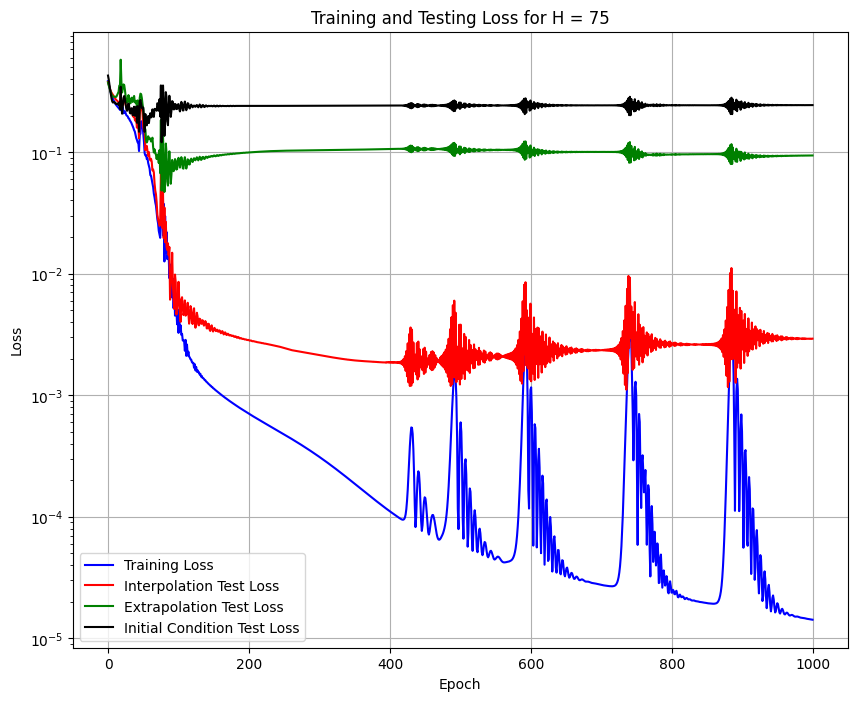

Figure saved as PDF at: /content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_NeuralODE_MWL_Testing.pdf


In [59]:
# Plot training and testing loss for all configurations
plt.figure(figsize=(10, 8))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label="Training Loss",
        color = "blue"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyA"],
        label="Interpolation Test Loss",
        color = "red"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyB"],
        label="Extrapolation Test Loss",
        color = "green"
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_historyC"],
        label="Initial Condition Test Loss",
        color="black"
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for H = 75")
plt.legend()
plt.grid(True)

# Save the figure as a PDF
pdf_path = "/content/drive/My Drive/PhD MIT/Deep Learning/Final Project/schro_NeuralODE_MWL_Testing.pdf"
plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

# Display the figure
plt.show()

print(f"Figure saved as PDF at: {pdf_path}")

# FNO + test

## training

In [ ]:
# Extract training data from the Schrodinger solution
idx_ = [10, 30, 50, 70, 90, 110, 130, 150]
dt_train = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5]
X_real_train = np.array([sol.y[:N, idx] for idx in idx_])
X_imag_train = np.array([sol.y[N:, idx] for idx in idx_])
X_train = np.hstack([X_real_train, X_imag_train])  # Combined real and imaginary parts
time_steps = np.array(dt_train)

# FNO Components
class SpectralConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, modes):
        super(SpectralConv1d, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes = modes
        self.scale = 1 / (in_channels * out_channels)
        self.weights1 = nn.Parameter(
            self.scale * torch.rand(in_channels, out_channels, modes, dtype=torch.cfloat)
        )

    def forward(self, x):
        x_ft = torch.fft.rfft(x, dim=-1)
        out_ft = torch.zeros_like(x_ft, dtype=torch.cfloat)
        out_ft[..., : self.modes] = torch.einsum(
            "bix,iox->box", x_ft[..., : self.modes], self.weights1
        )
        x = torch.fft.irfft(out_ft, n=x.size(-1), dim=-1)
        return x


class FNO1d(nn.Module):
    def __init__(self, modes, width, dropout_prob=0):
        super(FNO1d, self).__init__()
        self.modes = modes
        self.width = width
        self.dropout = nn.Dropout(dropout_prob)  # Define dropout with a given probability
        self.fc0 = nn.Linear(3, self.width)  # 3: real, imaginary, and time

        self.conv0 = SpectralConv1d(self.width, self.width, self.modes)
        self.conv1 = SpectralConv1d(self.width, self.width, self.modes)
        self.conv2 = SpectralConv1d(self.width, self.width, self.modes)

        self.w0 = nn.Conv1d(self.width, self.width, 1)
        self.w1 = nn.Conv1d(self.width, self.width, 1)
        self.w2 = nn.Conv1d(self.width, self.width, 1)

        self.fc1 = nn.Linear(self.width, 128)
        self.fc2 = nn.Linear(128, 2)  # Output: real and imaginary

    def forward(self, x):
        x = self.fc0(x)
        x = x.permute(0, 2, 1)

        x1 = self.conv0(x)
        x2 = self.w0(x)
        x = x1 + x2
        x = nn.ReLU()(x)

        x1 = self.conv1(x)
        x2 = self.w1(x)
        x = x1 + x2
        x = nn.ReLU()(x)

        x1 = self.conv2(x)
        x2 = self.w2(x)
        x = x1 + x2

        x = x.permute(0, 2, 1)
        x = nn.ReLU()(self.fc1(x))
        x = self.fc2(x)
        return x


# Prepare data
spatial_grid = np.repeat(xgrid.reshape(1, -1), len(time_steps), axis=0)
temporal_grid = np.repeat(time_steps.reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, real, and imaginary components as input
input_data = np.stack([spatial_grid, temporal_grid, X_real_train], axis=-1)
output_data = np.stack([X_real_train, X_imag_train], axis=-1)  # Shape: (8, len(xgrid), 2)

# Convert to PyTorch tensors
input_tensor = torch.tensor(input_data, dtype=torch.float32)
output_tensor = torch.tensor(output_data, dtype=torch.float32)

## preparing test dataset

In [ ]:
# Define the test time grid
dt_test = np.arange(0, 1.6, 0.2)  # Test times from 1.5 to 5.0 with spacing of 0.1

print(dt_test)

# Extract test data for Ey and Hz
u_real_test = np.array([u_real_sol[:, int(t / dt)] for t in dt_test])
u_imag_test = np.array([u_imag_sol[:, int(t / dt)] for t in dt_test])

# Prepare test dataset for input and output
spatial_test_grid = np.repeat(xgrid.reshape(1, -1), len(dt_test), axis=0)
temporal_test_grid = np.repeat(dt_test.reshape(-1, 1), len(xgrid), axis=1)

# Combine spatial, temporal, and fields (Ey, Hz) as input for testing
input_data_test = np.stack([spatial_test_grid, temporal_test_grid, u_real_test], axis=-1)
output_data_test = np.stack([u_real_test, u_imag_test], axis=-1)

# Convert test data to PyTorch tensors
input_tensor_test = torch.tensor(input_data_test, dtype=torch.float32)
output_tensor_test = torch.tensor(output_data_test, dtype=torch.float32)

print("Testing dataset prepared.")

[1.6 1.7 1.8 1.9 2.  2.1 2.2 2.3 2.4 2.5 2.6 2.7 2.8 2.9 3.  3.1 3.2 3.3
 3.4 3.5 3.6 3.7 3.8 3.9 4.  4.1 4.2 4.3 4.4 4.5 4.6 4.7 4.8 4.9]
Testing dataset prepared.


## Changing the hyper parameters

Training model with modes=8, width=64
Epoch 0, Training Loss: 0.9342929720878601, Testing Loss: 0.5882478952407837
Epoch 500, Training Loss: 0.41642606258392334, Testing Loss: 0.5190621018409729
Epoch 1000, Training Loss: 0.4053059220314026, Testing Loss: 0.5137596726417542
Epoch 1500, Training Loss: 0.4005517363548279, Testing Loss: 0.5090910196304321
Epoch 2000, Training Loss: 0.3963905870914459, Testing Loss: 0.506316065788269
Epoch 2500, Training Loss: 0.39178356528282166, Testing Loss: 0.5029453635215759
Epoch 3000, Training Loss: 0.3868362009525299, Testing Loss: 0.49846509099006653
Epoch 3500, Training Loss: 0.3813104033470154, Testing Loss: 0.49349379539489746
Epoch 4000, Training Loss: 0.3752165734767914, Testing Loss: 0.48998066782951355
Epoch 4500, Training Loss: 0.36877715587615967, Testing Loss: 0.4924028813838959
Epoch 5000, Training Loss: 0.36174774169921875, Testing Loss: 0.494124174118042
Epoch 5500, Training Loss: 0.3532860577106476, Testing Loss: 0.49539798498153687


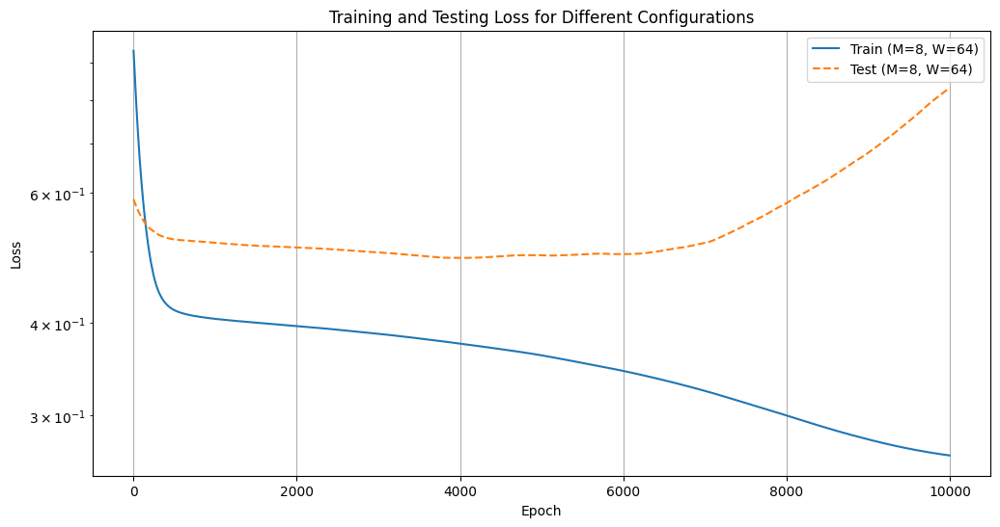

In [ ]:


import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from torch.optim.lr_scheduler import StepLR


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move tensors to GPU
input_tensor = input_tensor.to(device)
output_tensor = output_tensor.to(device)
input_tensor_test = input_tensor_test.to(device)
output_tensor_test = output_tensor_test.to(device)



def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def train_and_benchmark_fno_with_test(modes, width, lr, epochs, input_tensor, output_tensor, input_tensor_test, output_tensor_test, save_path="model.pth"):
    fno_model = FNO1d(modes, width, dropout_prob=0.2).to(device)
    optimizer = torch.optim.Adam(fno_model.parameters(), lr=lr, weight_decay=1e-4)
    # scheduler = StepLR(optimizer, step_size=1000, gamma=0.1)

    loss_fn = nn.MSELoss()

    num_parameters = count_parameters(fno_model)
    start_time = time.time()
    train_loss_history = []
    test_loss_history = []

    for epoch in range(epochs):
        fno_model.train()
        optimizer.zero_grad()
        predictions = fno_model(input_tensor)
        train_loss = loss_fn(predictions, output_tensor)
        train_loss.backward()


        optimizer.step()

        # scheduler.step()

        train_loss_history.append(train_loss.item())

        fno_model.eval()
        with torch.no_grad():
            test_predictions = fno_model(input_tensor_test)
            test_loss = loss_fn(test_predictions, output_tensor_test)
            test_loss_history.append(test_loss.item())

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Training Loss: {train_loss.item()}, Testing Loss: {test_loss.item()}")

    training_time = time.time() - start_time
    fno_model.eval()
    start_inference = time.time()
    with torch.no_grad():
        fno_model(input_tensor_test)
    inference_time = time.time() - start_inference

    torch.save(fno_model.state_dict(), save_path)

    return {
        "modes": modes,
        "width": width,
        "lr": lr,
        "epochs": epochs,
        "training_time": training_time,
        "inference_time": inference_time,
        "final_train_loss": train_loss_history[-1],
        "final_test_loss": test_loss_history[-1],
        "num_parameters": num_parameters,
        "train_loss_history": train_loss_history,
        "test_loss_history": test_loss_history,
        "model_path": save_path,
    }



# Load existing metrics
if os.path.exists("schro_fno_benchmark_metrics.json"):
    with open("schro_fno_benchmark_metrics.json", "r") as f:
        all_metrics = json.load(f)
else:
    all_metrics = []

# Training loop
lr = 1e-2
epochs = 1000

# M <= N/2 + 1 = 51
modes_range = [8]
width_range = [128]

for modes in modes_range:
    for width in width_range:
        print(f"Training model with modes={modes}, width={width}")
        save_path = f"fno_model_modes_{modes}_width_{width}.pth"
        metrics = train_and_benchmark_fno_with_test(
            modes=modes,
            width=width,
            lr=lr,
            epochs=epochs,
            input_tensor=input_tensor,
            output_tensor=output_tensor,
            input_tensor_test=input_tensor_test,
            output_tensor_test=output_tensor_test,
            save_path=save_path,
        )
        all_metrics.append(metrics)

        # Save metrics incrementally
        with open("schro_fno_benchmark_metrics.json", "w") as f:
            json.dump(all_metrics, f, indent=4)

        print(f"Metrics for modes={modes}, width={width} saved.")

# Plot training and testing loss for all configurations
plt.figure(figsize=(12, 6))
for metrics in all_metrics:
    epochs_range = range(metrics["epochs"])
    plt.plot(
        epochs_range,
        metrics["train_loss_history"],
        label=f"Train (M={metrics['modes']}, W={metrics['width']})",
    )
    plt.plot(
        epochs_range,
        metrics["test_loss_history"],
        linestyle="--",
        label=f"Test (M={metrics['modes']}, W={metrics['width']})",
    )
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss for Different Configurations")
plt.legend()
plt.grid(True)
plt.show()
plt.close()


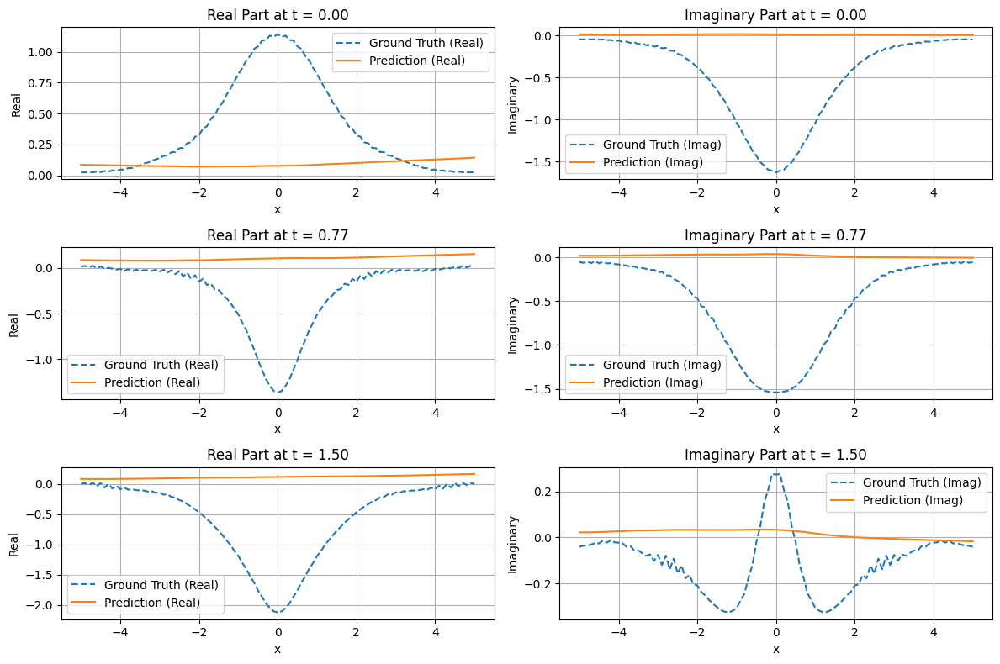

In [ ]:
def plot_ground_truth_vs_predictions(fno_model, input_tensor_test, output_tensor_test, xgrid, tgrid, time_indices, device):
    """
    Plot ground truth and predictions for the real and imaginary parts over a given time range.

    Parameters:
    - fno_model: Trained FNO model
    - input_tensor_test: Input tensor for testing
    - output_tensor_test: Ground truth output tensor for testing
    - xgrid: Spatial grid points
    - tgrid: Temporal grid points
    - time_indices: Indices of the time points to visualize
    - device: Device to run the model (CPU or GPU)
    """

    fno_model.eval()
    input_tensor_test = input_tensor_test.to(device)
    output_tensor_test = output_tensor_test.to(device)

    # Get predictions
    with torch.no_grad():
        predictions = fno_model(input_tensor_test).cpu().numpy()

    # Extract real and imaginary parts of the predictions and ground truth
    pred_real = predictions[time_indices, :, 0]
    pred_imag = predictions[time_indices, :, 1]
    gt_real = output_tensor_test[time_indices, :, 0].cpu().numpy()
    gt_imag = output_tensor_test[time_indices, :, 1].cpu().numpy()

    # Plot settings
    plt.figure(figsize=(12, 8))
    num_plots = len(time_indices)

    for i, idx in enumerate(time_indices):
        plt.subplot(num_plots, 2, 2 * i + 1)
        plt.plot(xgrid, gt_real[i], label="Ground Truth (Real)", linestyle="--")
        plt.plot(xgrid, pred_real[i], label="Prediction (Real)")
        plt.title(f"Real Part at t = {tgrid[idx]:.2f}")
        plt.xlabel("x")
        plt.ylabel("Real")
        plt.legend()
        plt.grid(True)

        plt.subplot(num_plots, 2, 2 * i + 2)
        plt.plot(xgrid, gt_imag[i], label="Ground Truth (Imag)", linestyle="--")
        plt.plot(xgrid, pred_imag[i], label="Prediction (Imag)")
        plt.title(f"Imaginary Part at t = {tgrid[idx]:.2f}")
        plt.xlabel("x")
        plt.ylabel("Imaginary")
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()


# Load the trained model
fno_model = FNO1d(modes=8, width=64).to(device)
fno_model.eval()

# Ensure tensors are on the right device
input_tensor_test = input_tensor_test.to(device)
output_tensor_test = output_tensor_test.to(device)

# Define the grids if not already defined
xgrid = np.linspace(-5, 5, input_tensor_test.shape[1])  # Example spatial grid
tgrid = np.linspace(0, 1.5, input_tensor_test.shape[0])  # Example temporal grid

# Select time indices for visualization
time_indices = [0, len(tgrid) // 2, len(tgrid) - 1]

# Plot the predictions vs. ground truth
plot_ground_truth_vs_predictions(fno_model, input_tensor_test, output_tensor_test, xgrid, tgrid, time_indices, device)



# KAN-ODE

In [ ]:
import numpy as np
import torch
from torch import nn
from torchdiffeq import odeint
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

input_tensor_test = input_tensor_test.to(device)
output_tensor_test = output_tensor_test.to(device)


# Radial Basis Function (RBF)
def rbf(x, z, h):
    """Radial Basis Function."""
    z = z.to(x.device)
    return torch.exp(-((x - z) / h) ** 2)

# Define KAN-ODE architecture
# KDense Layer
class KDense(nn.Module):
    def __init__(self, in_dims, out_dims, grid_len,
                 normalizer=torch.tanh, grid_lims=(-1.0, 1.0),
                 denominator=None, basis_func=rbf,
                 base_act=torch.nn.SiLU(), use_base_act=True):
        """
        Kolmogorov-Arnold Dense Layer.

        :param in_dims: Input dimensionality.
        :param out_dims: Output dimensionality.
        :param grid_len: Number of grid points.
        """
        super(KDense, self).__init__()
        self.in_dims = in_dims
        self.out_dims = out_dims
        self.grid_len = grid_len
        self.normalizer = normalizer
        self.grid_lims = torch.tensor(grid_lims, dtype=torch.float32)
        self.denominator = denominator or (2 / (grid_len - 1))
        self.basis_func = basis_func
        self.base_act = base_act
        self.use_base_act = use_base_act

        # Define weights
        self.C = nn.Parameter(torch.empty(out_dims, grid_len * in_dims))
        if use_base_act:
            self.W = nn.Parameter(torch.empty(out_dims, in_dims))
        else:
            self.W = None

        # Initialize weights
        nn.init.xavier_uniform_(self.C)  # Glorot initialization
        if self.use_base_act:
            nn.init.xavier_uniform_(self.W)

        # Create grid
        self.grid = torch.linspace(self.grid_lims[0], self.grid_lims[1], grid_len)

    def forward(self, x):
        """
        Forward pass through the KDense layer.

        :param x: Input tensor (batch_size, in_dims).
        :return: Output tensor (batch_size, out_dims).
        """
        batch_size = x.shape[0] if x.ndim > 1 else 1  # Handle batch size or single input
        x = x.unsqueeze(0) if x.ndim == 1 else x  # Ensure input is 2D for consistency

        # Normalize inputs
        x_norm = self.normalizer(x)  # ∈ [-1, 1]

        # Move self.grid to the same device as x
        grid = self.grid.to(x.device)

        # Reshape inputs for basis function computation
        x_reshaped = x_norm.unsqueeze(-1)  # Shape: (batch_size, in_dims, 1)

        # Compute basis function
        basis = self.basis_func(x_reshaped, self.grid, self.denominator)  # Shape: (batch_size, in_dims, grid_len)

        # Reshape basis to align with weight dimensions
        if basis.ndim == 3:
            basis = basis.permute(0, 2, 1).contiguous()  # Reorder to (batch_size, grid_len, in_dims)
            basis = basis.view(batch_size, -1)  # Flatten to (batch_size, grid_len * in_dims)
        elif basis.ndim == 2:  # Handle non-batch case
            basis = basis.view(-1)  # Flatten for single instance

        # print(f"basis shape: {basis.shape}")  # Should be (batch_size, grid_len * in_dims)
        # print(f"self.C shape: {self.C.shape}")  # Should be (out_dims, grid_len * in_dims)


        # Compute spline component
        spline = torch.matmul(basis, self.C.T)  # Shape: (batch_size, out_dims)

        if self.use_base_act:
            base = torch.matmul(x, self.W.T)  # Shape: (batch_size, out_dims)
            base = self.base_act(base)
            return spline + base
        else:
            return spline


# Updated KANODE class
# KANODE Architecture
class KANODE(nn.Module):
    def __init__(self, xgrid_len, KANnode, KANgrid):
        """
        Kolmogorov-Arnold Neural ODE Model.

        :param xgrid_len: Length of spatial grid.
        :param KANnode: Number of nodes per layer.
        :param KANgrid: Number of grid points in KDense.
        """
        super(KANODE, self).__init__()
        self.layer1 = KDense(xgrid_len * 2, KANnode, KANgrid, basis_func=rbf)
        self.layer2 = KDense(KANnode, xgrid_len * 2, KANgrid, basis_func=rbf)

    def forward(self, t, y):
        y = self.layer1(y)
        y = self.layer2(y)
        return y



# Reshape initial condition for a single time step
t_eval = torch.tensor(dt_train, dtype=torch.float32).to(device)  # Time points for evaluation
y0 = torch.tensor(np.hstack([X_real_train[0], X_imag_train[0]]), dtype=torch.float32).to(device)  # Shape: (2 * len(xgrid),)

# Compute loss
ground_truth = np.hstack([X_real_train, X_imag_train])  # Combine real and imaginary parts
ground_truth_tensor = torch.tensor(ground_truth, dtype=torch.float32).to(device)  # Ground truth shape: (len(dt_train), 2 * len(xgrid))

# Parameters
KANgrid = 10
KANnode = 10
learning_rate = 1e-3
num_epochs = 3000  # 1e5 iterations in KAN-ODE paper
loss_history = []
test_loss_history = []

# Instantiate the KANODE model
kanode = KANODE(len(xgrid), KANnode, KANgrid).to(device)
# Define optimizer and loss function
optimizer = torch.optim.Adam(kanode.parameters(), lr=learning_rate)
loss_fn = nn.MSELoss()  # Mean squared error loss

# Training loop
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Forward pass through the ODE solver for training data
    pred = odeint(kanode, y0, t_eval)  # Solve the ODE for the given time points
    pred = pred.view(len(dt_train), -1)  # Reshape to match ground truth shape

    # Compute training loss
    loss = loss_fn(pred, ground_truth_tensor)
    loss.backward()
    optimizer.step()

    # Log the training loss
    loss_history.append(loss.item())


    # Prepare initial condition for the test set
    y0_test = torch.tensor(np.hstack([u_real_test[0], u_imag_test[0]]), dtype=torch.float32).to(device)
    dt_test_tensor = torch.tensor(dt_test, dtype=torch.float32).to(device)

    # Ground truth for test set
    ground_truth_test = torch.tensor(np.hstack([u_real_test, u_imag_test]), dtype=torch.float32).to(device)

    # Evaluate the model on the test data
    kanode.eval()
    with torch.no_grad():
        test_pred = odeint(kanode, y0_test, dt_test_tensor)  # Solve the ODE for test time points
        test_pred = test_pred.view(len(dt_test), -1)         # Reshape to match ground truth shape
        test_loss = loss_fn(test_pred, ground_truth_test)    # Compute test loss
        test_loss_history.append(test_loss.item())


    kanode.train()  # Set model back to training mode

    # Print progress every 100 epochs
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Training Loss: {loss.item()}, Test Loss: {test_loss.item()}")


# Plot the training loss
plt.figure(figsize=(8, 4))
plt.plot(range(num_epochs), loss_history, label="Training Loss")
plt.plot(range(num_epochs), test_loss_history, label="Testing Loss")
plt.yscale("log")  # Use logarithmic scale for better visualization of convergence
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curve for KAN-ODE Training")
plt.legend()
plt.grid(True)
plt.show()


Using device: cuda
Epoch 0, Training Loss: 0.4258814752101898, Test Loss: 0.8049730062484741
Epoch 100, Training Loss: 0.21215933561325073, Test Loss: 2.7634382247924805
Epoch 200, Training Loss: 0.14827992022037506, Test Loss: 7.286128520965576
Epoch 300, Training Loss: 0.12934289872646332, Test Loss: 4.898504257202148
Epoch 400, Training Loss: 0.0818910300731659, Test Loss: 6.479044437408447


KeyboardInterrupt: 

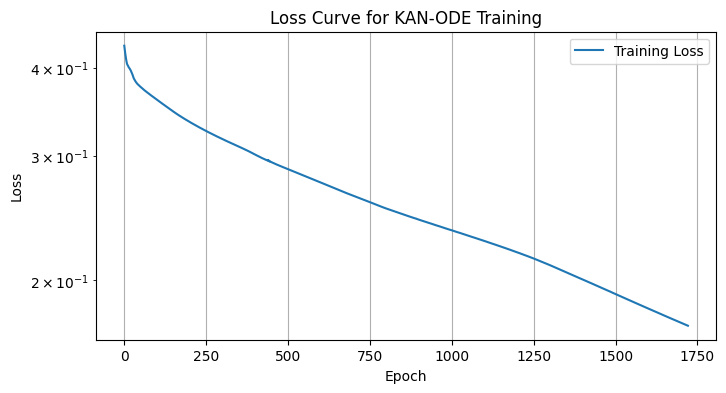

In [ ]:
e# Plot the training loss
plt.figure(figsize=(8, 4))
# plt.plot(range(num_epochs), loss_history, label="Training Loss")
plt.plot(range(1722), loss_history, label="Training Loss")
plt.yscale("log")  # Use logarithmic scale for better visualization of convergence
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curve for KAN-ODE Training")
plt.legend()
plt.grid(True)
plt.show()

# LV

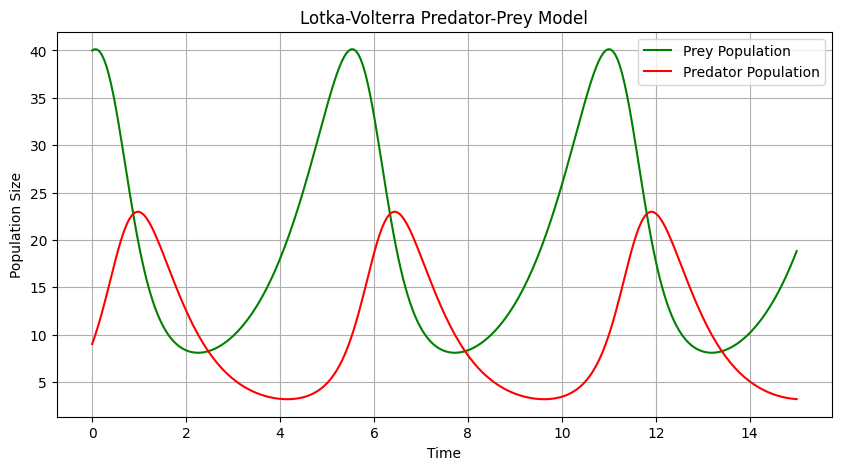

In [ ]:
import torch
from torchdiffeq import odeint
import matplotlib.pyplot as plt

# Define the Lotka-Volterra system as a class to encapsulate the parameters
class LotkaVolterraSystem(torch.nn.Module):
    def __init__(self, alpha, beta, delta, gamma):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.delta = delta
        self.gamma = gamma

    def forward(self, t, y):
        prey, predator = y[0], y[1]
        dprey_dt = self.alpha * prey - self.beta * prey * predator
        dpredator_dt = self.delta * prey * predator - self.gamma * predator
        return torch.tensor([dprey_dt, dpredator_dt])

# Parameters
alpha = 1.0     # Prey growth rate
beta = 0.1      # Predation rate
delta = 0.075   # Predator growth rate
gamma = 1.5     # Predator death rate

# Initial conditions: [prey, predator]
y0 = torch.tensor([40.0, 9.0], dtype=torch.float32)  # Initial population sizes

# Time points
t = torch.linspace(0, 15, 300)

# Create the system instance
lotka_volterra = LotkaVolterraSystem(alpha, beta, delta, gamma)

# Solve the system
solution = odeint(lotka_volterra, y0, t)

# Plot results
prey, predators = solution[:, 0].numpy(), solution[:, 1].numpy()

plt.figure(figsize=(10, 5))
plt.plot(t.numpy(), prey, label="Prey Population", color="green")
plt.plot(t.numpy(), predators, label="Predator Population", color="red")
plt.xlabel("Time")
plt.ylabel("Population Size")
plt.title("Lotka-Volterra Predator-Prey Model")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import torch
from torch import nn
from torchdiffeq import odeint
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define the Radial Basis Function (RBF)
def rbf(x, z, h):
    """Radial Basis Function."""
    z = z.to(x.device)
    return torch.exp(-((x - z) / h) ** 2)

# Define KDense Layer
class KDense(nn.Module):
    def __init__(self, in_dims, out_dims, grid_len,
                 normalizer=torch.tanh, grid_lims=(-1.0, 1.0),
                 denominator=None, basis_func=rbf,
                 base_act=torch.nn.SiLU(), use_base_act=True):
        super(KDense, self).__init__()
        self.in_dims = in_dims
        self.out_dims = out_dims
        self.grid_len = grid_len
        self.normalizer = normalizer
        self.grid_lims = torch.tensor(grid_lims, dtype=torch.float32)
        self.denominator = denominator or (2 / (grid_len - 1))
        self.basis_func = basis_func
        self.base_act = base_act
        self.use_base_act = use_base_act

        # Define weights
        self.C = nn.Parameter(torch.empty(out_dims, grid_len * in_dims))
        if use_base_act:
            self.W = nn.Parameter(torch.empty(out_dims, in_dims))
        else:
            self.W = None

        # Initialize weights
        nn.init.xavier_uniform_(self.C)
        if self.use_base_act:
            nn.init.xavier_uniform_(self.W)

        # Create grid
        self.grid = torch.linspace(self.grid_lims[0], self.grid_lims[1], grid_len).to(device)

    def forward(self, x):
        batch_size = x.shape[0] if x.ndim > 1 else 1
        x = x.unsqueeze(0) if x.ndim == 1 else x

        # Normalize inputs
        x_norm = self.normalizer(x)

        # Compute basis function
        x_reshaped = x_norm.unsqueeze(-1)
        basis = self.basis_func(x_reshaped, self.grid, self.denominator)

        basis = basis.permute(0, 2, 1).contiguous()
        basis = basis.view(batch_size, -1)

        # Compute spline component
        spline = torch.matmul(basis, self.C.T)

        if self.use_base_act:
            base = torch.matmul(x, self.W.T)
            base = self.base_act(base)
            return spline + base
        else:
            return spline

# Define KANODE Architecture
class KANODE(nn.Module):
    def __init__(self, in_dims, KANnode, KANgrid):
        super(KANODE, self).__init__()
        self.layer1 = KDense(in_dims, KANnode, KANgrid, basis_func=rbf)
        self.layer2 = KDense(KANnode, in_dims, KANgrid, basis_func=rbf)

    def forward(self, t, y):
        y = self.layer1(y)
        y = self.layer2(y)
        return y

# Parameters
KANgrid = 5
KANnode = 10
learning_rate = 1e-3
num_epochs = 3000
loss_history = []

# Define the Lotka-Volterra system and move tensors to the correct device
def lotka_volterra(t, y, alpha=1.0, beta=0.1, delta=0.075, gamma=1.5):
    y = y.to(device)  # Ensure y is on the same device
    prey, predator = y[0], y[1]
    dprey_dt = alpha * prey - beta * prey * predator
    dpredator_dt = delta * prey * predator - gamma * predator
    return torch.tensor([dprey_dt, dpredator_dt], dtype=torch.float32).to(device)


# Instantiate the KANODE model
kanode = KANODE(in_dims=2, KANnode=KANnode, KANgrid=KANgrid).to(device)

# Define optimizer and loss function
optimizer = torch.optim.Adam(kanode.parameters(), lr=learning_rate)
loss_fn = nn.MSELoss()

# Training loop
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Forward pass through the ODE solver for training data
    pred = odeint(kanode, y0, t_eval)
    loss = loss_fn(pred, ground_truth)

    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item()}")

# Plot the training loss
plt.figure(figsize=(8, 4))
plt.plot(range(num_epochs), loss_history, label="Training Loss")
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curve for KAN-ODE Training on Lotka-Volterra")
plt.legend()
plt.grid(True)
plt.show()

# Plot predictions vs ground truth
pred = pred.cpu().detach().numpy()
ground_truth = ground_truth.cpu().detach().numpy()
plt.figure(figsize=(10, 5))
plt.plot(t_eval.cpu(), ground_truth[:, 0], label="True Prey", color="green")
plt.plot(t_eval.cpu(), ground_truth[:, 1], label="True Predator", color="red")
plt.plot(t_eval.cpu(), pred[:, 0], '--', label="Predicted Prey", color="blue")
plt.plot(t_eval.cpu(), pred[:, 1], '--', label="Predicted Predator", color="purple")
plt.xlabel("Time")
plt.ylabel("Population")
plt.title("Lotka-Volterra: True vs Predicted Populations")
plt.legend()
plt.grid(True)
plt.show()


Using device: cuda
Epoch 0, Loss: 17281748.0
Epoch 100, Loss: 639551.8125
Epoch 200, Loss: 250427.8125
Epoch 300, Loss: 99243.8828125
Epoch 400, Loss: 57582.6953125


KeyboardInterrupt: 